In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import networkx as nx
import subprocess
import time
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.metrics.pairwise import euclidean_distances

# Load Dataset

In [2]:
scenario = 10
dsn = pd.read_csv(f'C:\\Users\\popul\\Documents\\Homework\\cs_6490\\project\\CS6490_NetworkSecurity_FinalProject\\botembed\\data\\scenario_{scenario}.csv')

In [3]:
# make the graph
E = [(u,v) for u, v in dsn[['SrcAddr', 'DstAddr']].drop_duplicates().values]
G = nx.Graph()
G.add_edges_from(E)
G_ip_list = G.nodes()
G = nx.convert_node_labels_to_integers(G)

In [4]:
unique_labels = dsn['Label'].unique()

botnet_labels = [x for x in unique_labels if 'botnet' in x.lower()]
bad_ips = list(dsn[dsn['Label'].isin(botnet_labels)]['SrcAddr'].unique())
bad_ips_indx = [list(G_ip_list).index(i) for i in bad_ips]

from_normal_labels = [x for x in unique_labels if 'From-Normal' in x]
from_normal_ips = dsn[dsn['Label'].isin(from_normal_labels)]['SrcAddr'].unique()
to_normal_labels = [x for x in unique_labels if 'To-Normal' in x]
to_normal_ips = dsn[dsn['Label'].isin(to_normal_labels)]['DstAddr'].unique()
normal_ips = list(from_normal_ips) + list(to_normal_ips)
normal_ips_indx = [list(G_ip_list).index(i) for i in normal_ips]

background_ips = [x for x in list(G_ip_list) if x not in bad_ips+normal_ips]

# pick 10 random background_ips
random_background_ips = list(np.random.choice(background_ips, 10))
random_background_ips_indx = [list(G_ip_list).index(i) for i in random_background_ips]

In [5]:
def run_deepwalk(G, n_walks, walk_length, representation_size, window_size, n_jobs):
    
    print('-'*50)
    print(f'n_walks: {n_walks}, walk_length: {walk_length}, representation_size: {representation_size}, window_size: {window_size}', end=' ')
    start_time = time.time()
    nx.write_edgelist(G, f'scenario_{scenario}.edgelist', data=False) # For deepwalk
    p = subprocess.run(["deepwalk",
                        "--format", "edgelist", 
                        "--input", f"scenario_{scenario}.edgelist",
                        "--max-memory-data-size", "30000000000",
                        "--number-walks", f"{n_walks}",
                        "--walk-length", f"{walk_length}",
                        "--representation-size", f"{representation_size}",
                        "--window-size", f"{window_size}",
                        "--output", f"scenario_{scenario}_n{n_walks}_l{walk_length}_w{window_size}_d{representation_size}.output",
                        "--workers", f"{n_jobs}",
                        "--seed", "1138"])
    end_time = time.time()
    print('Running Time: ', end_time - start_time)
    

    deepwalk_output = pd.read_csv(f'scenario_{scenario}_n{n_walks}_l{walk_length}_w{window_size}_d{representation_size}.output', delimiter=' ',
                             header=None, skiprows=1)
    deepwalk_output = deepwalk_output.sort_values(0).reset_index(drop=True)

    fig, ax = plt.subplots(1, 1, figsize=(8, 10))
    sns.heatmap(deepwalk_output.loc[:, 1:])
    plt.title('All IPS')
    plt.show()
    
    
    sns.heatmap(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:])
    plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
    plt.title('Bad vs. Normal IPS')
    plt.show()
    
    dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], squared=True)
    sns.heatmap(dist)
    plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
    plt.xticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips, rotation=90)
    plt.title('Bad vs. Normal IPS')
    plt.show()
    
    sns.heatmap(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:])
    plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
    plt.title('Bad vs. Random Background IPS')
    plt.show()
    
    dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], squared=True)
    sns.heatmap(dist)
    plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
    plt.xticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips, rotation=90)
    plt.title('Bad vs. Random Background IPS')
    plt.show()

--------------------------------------------------
n_walks: 1, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  57.71289849281311


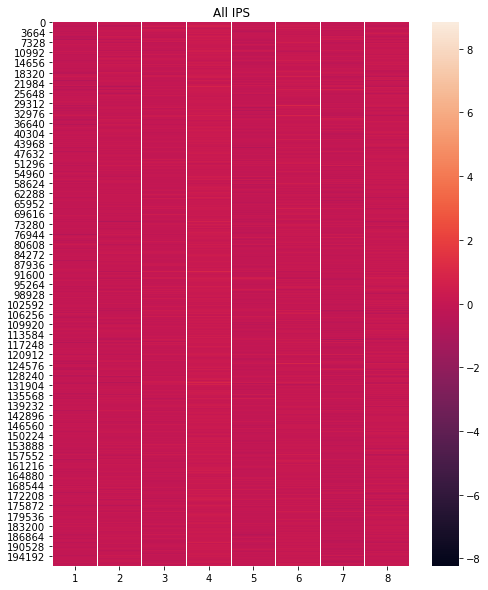

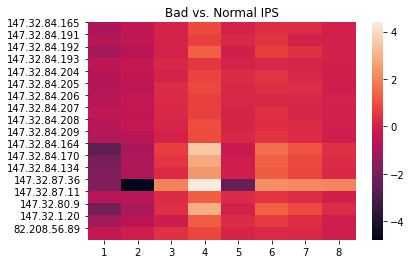

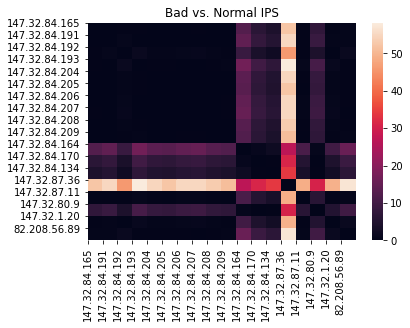

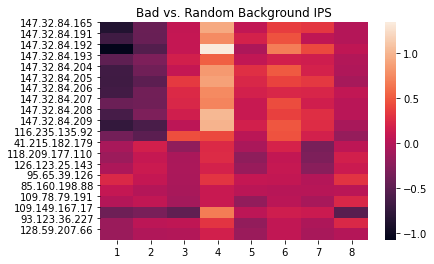

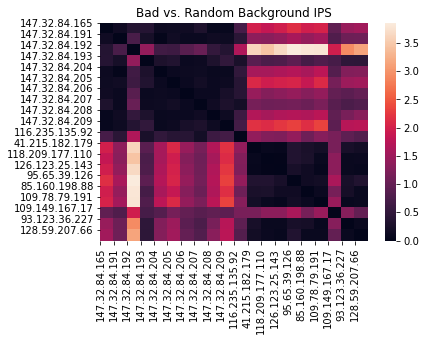

In [43]:
run_deepwalk(G, 
             n_walks=1, 
             walk_length=5, 
             representation_size=8, 
             window_size=2, 
             n_jobs=1)

# 2 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 2, window_size: 2 Running Time:  53.78990960121155


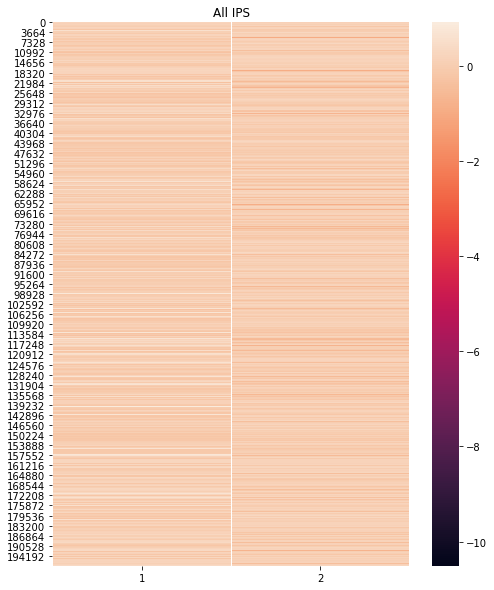

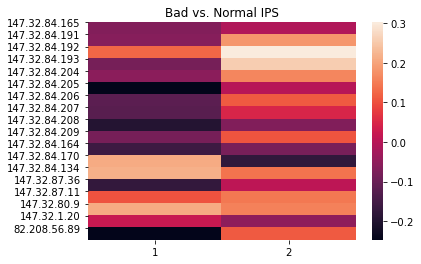

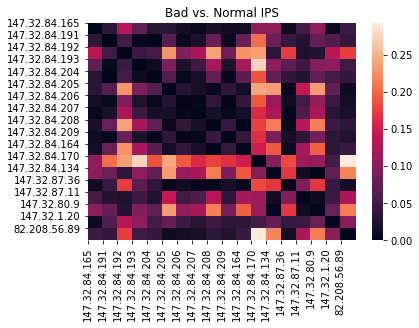

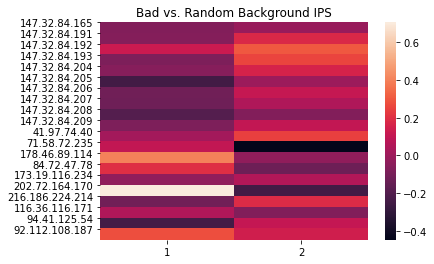

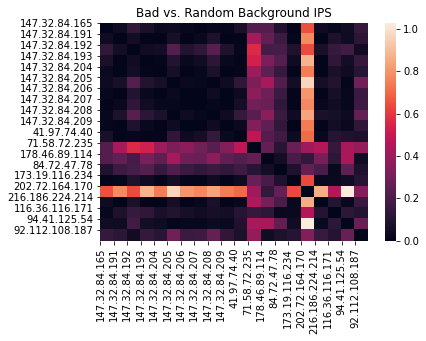

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 2, window_size: 4 Running Time:  53.45996332168579


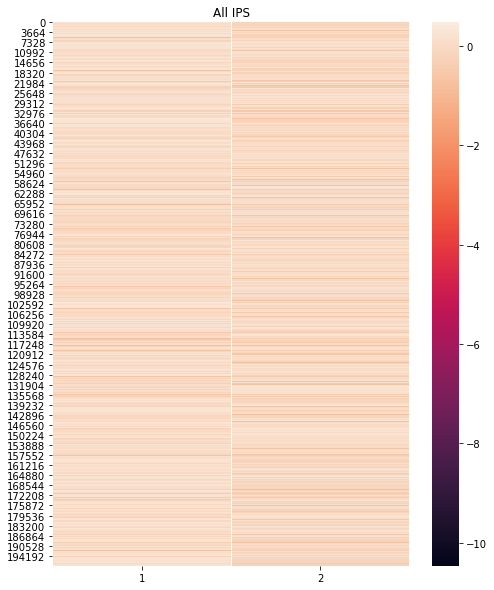

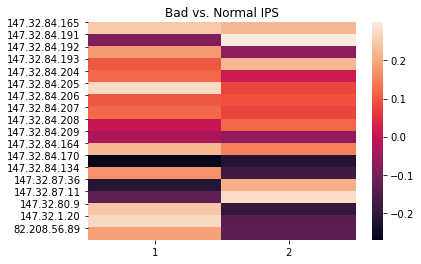

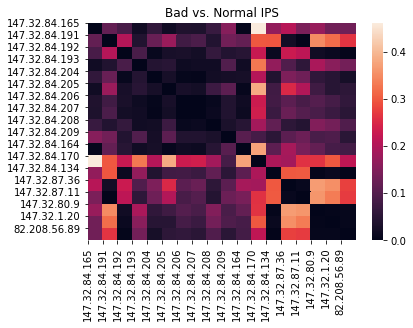

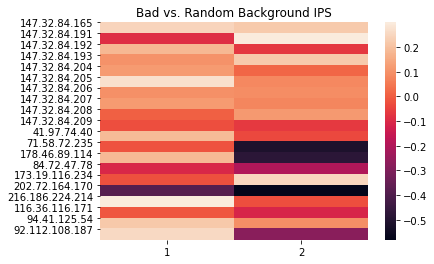

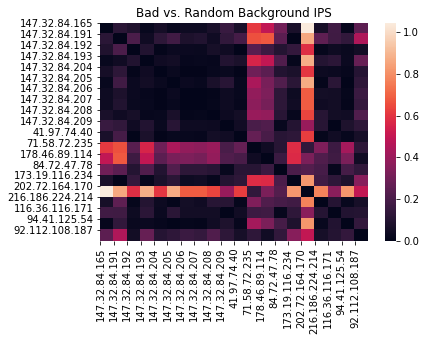

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 2, window_size: 2 Running Time:  115.13919854164124


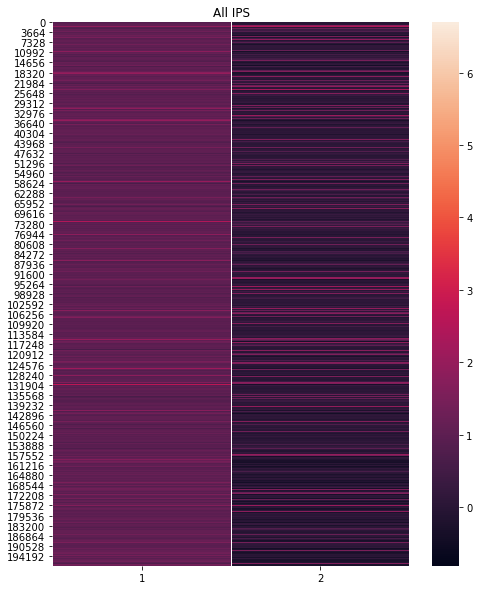

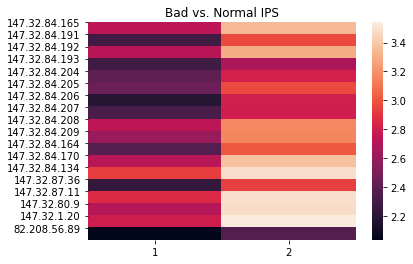

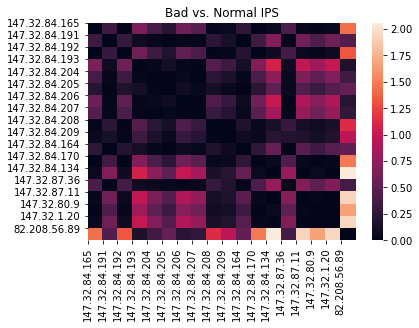

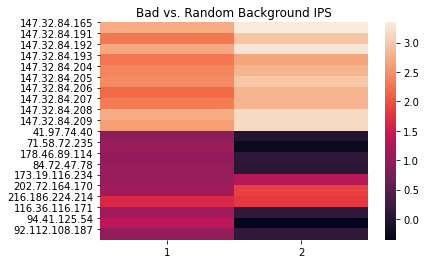

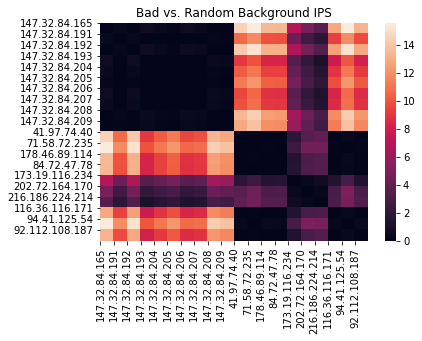

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 2, window_size: 4 Running Time:  122.37384128570557


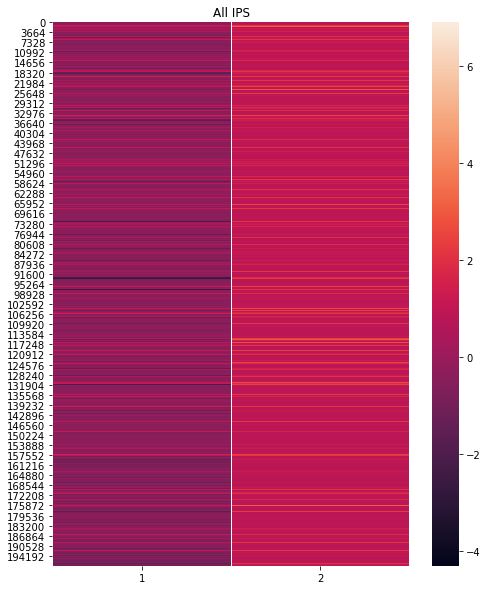

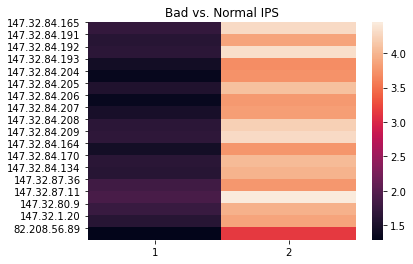

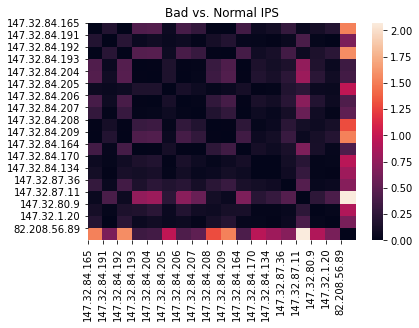

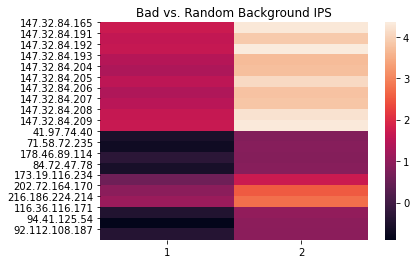

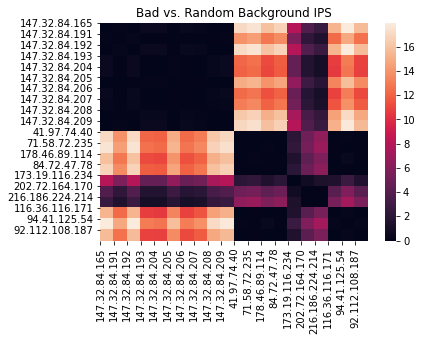

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 2, window_size: 2 Running Time:  191.87955856323242


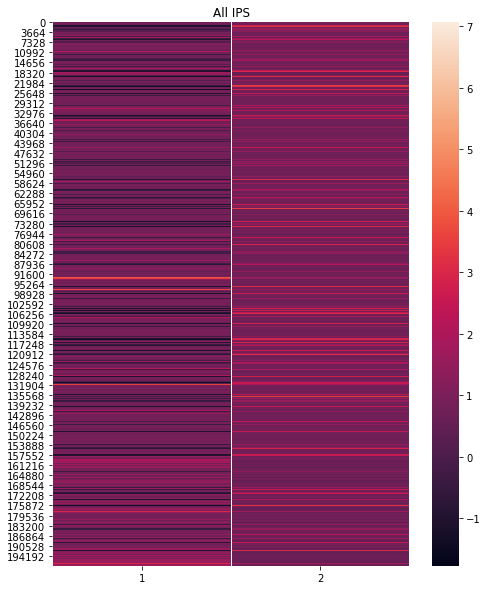

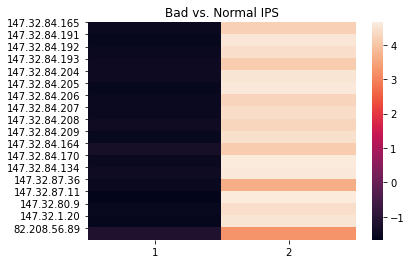

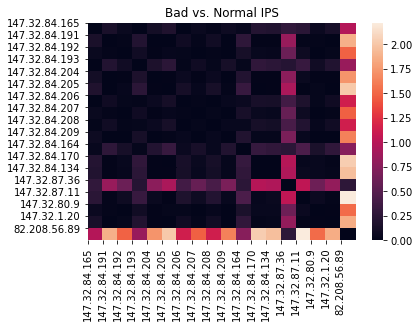

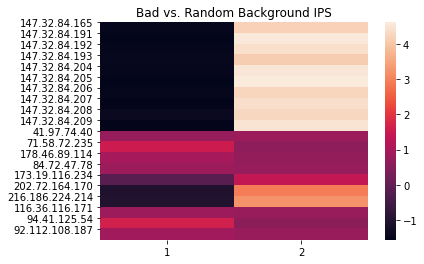

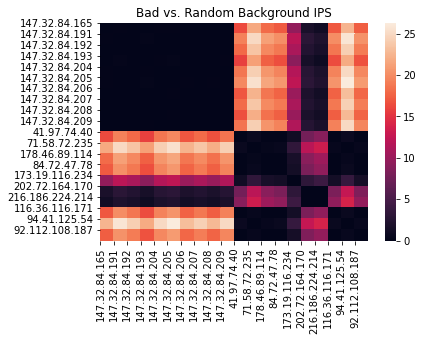

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 2, window_size: 4 Running Time:  231.45919632911682


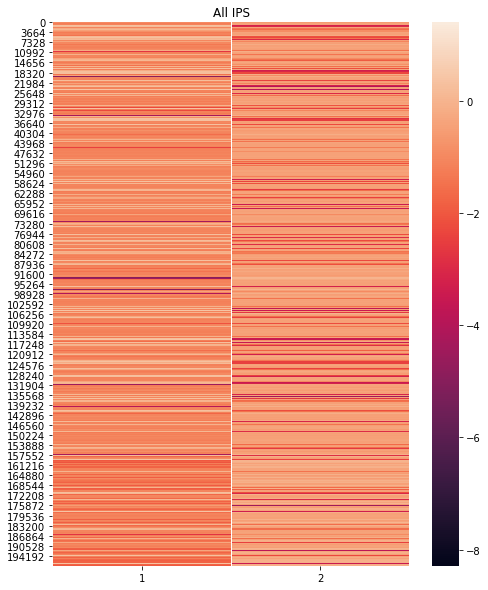

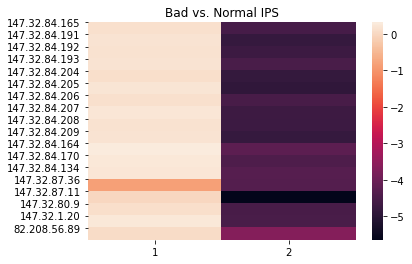

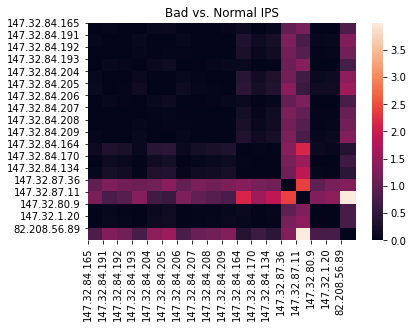

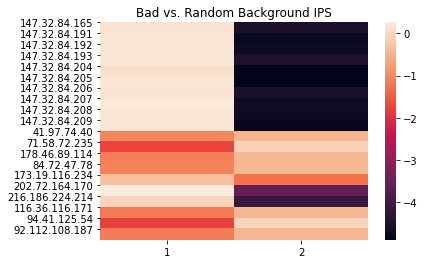

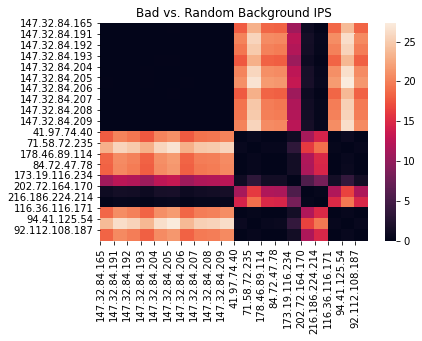

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 2, window_size: 2 Running Time:  70.11227250099182


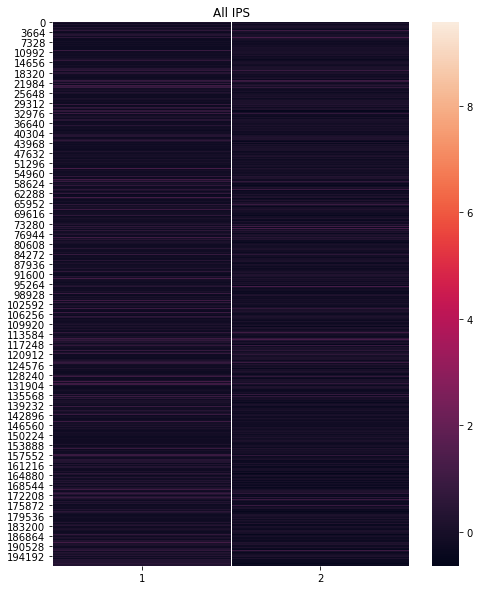

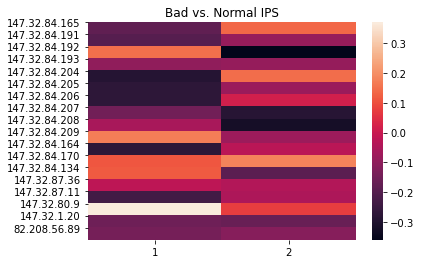

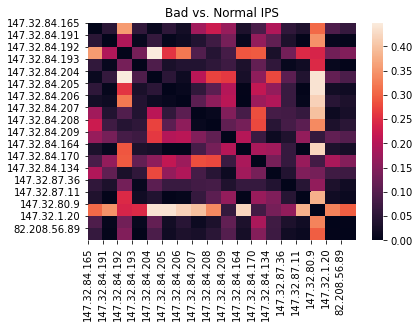

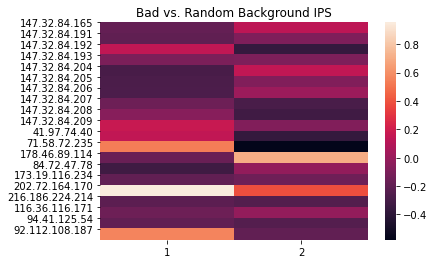

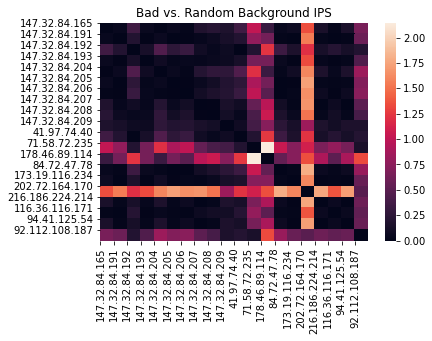

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 2, window_size: 4 Running Time:  69.59658122062683


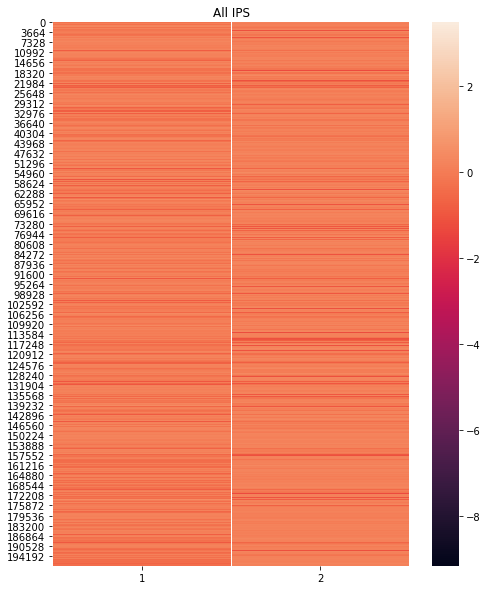

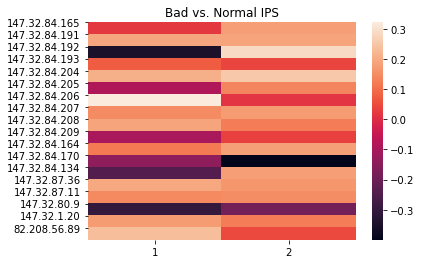

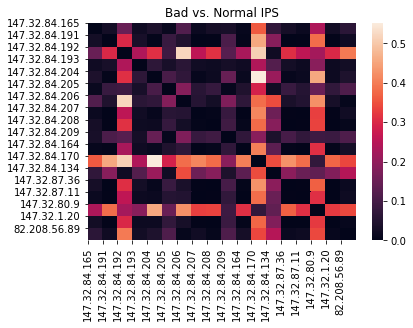

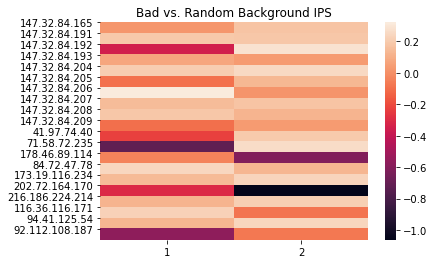

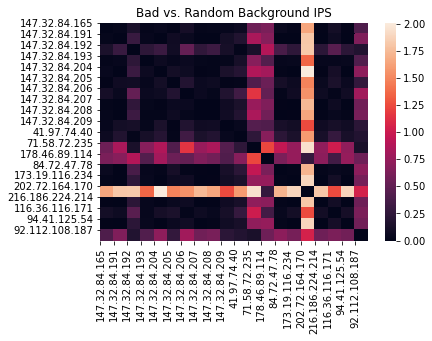

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 2, window_size: 2 Running Time:  192.3997094631195


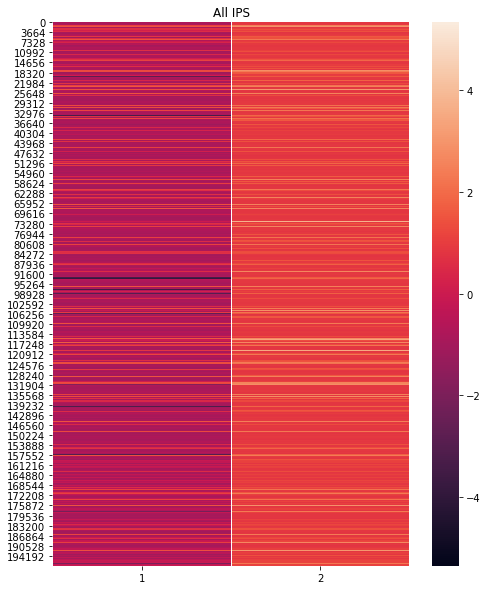

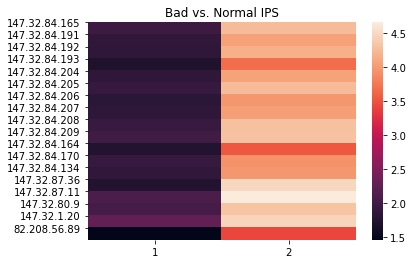

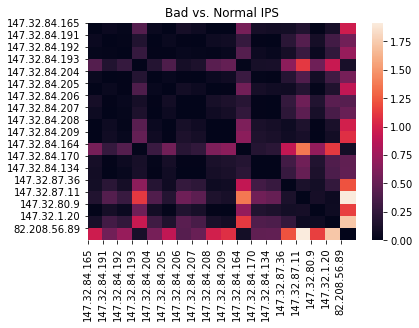

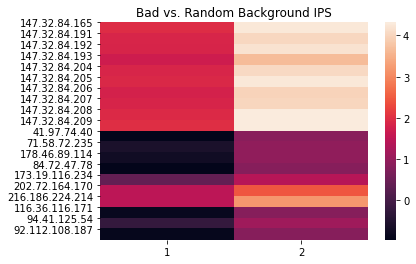

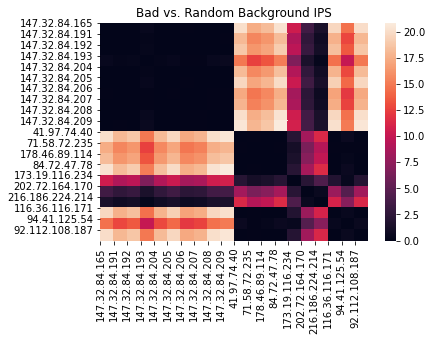

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 2, window_size: 4 Running Time:  207.3716311454773


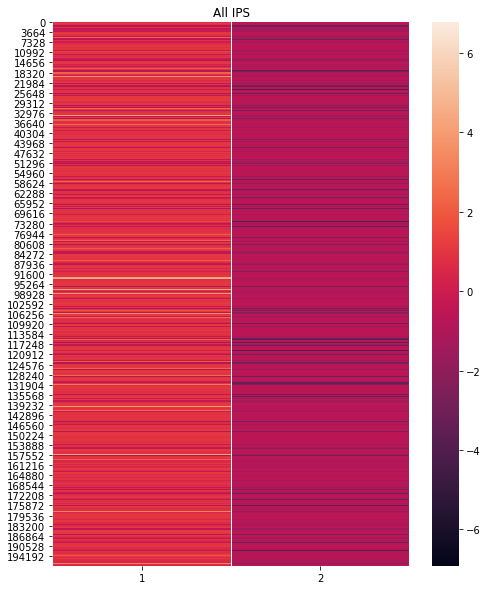

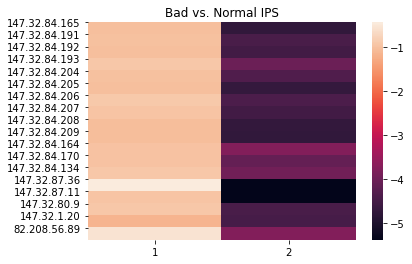

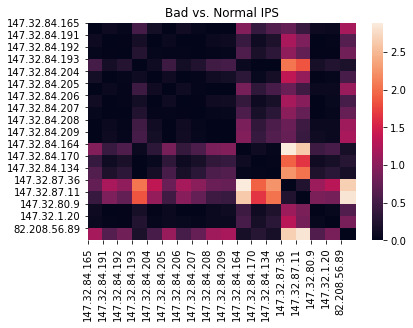

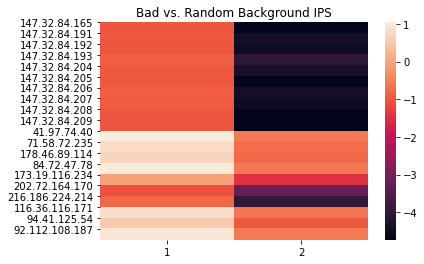

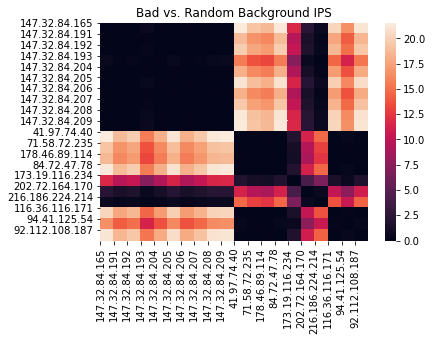

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 2, window_size: 2 Running Time:  346.64054679870605


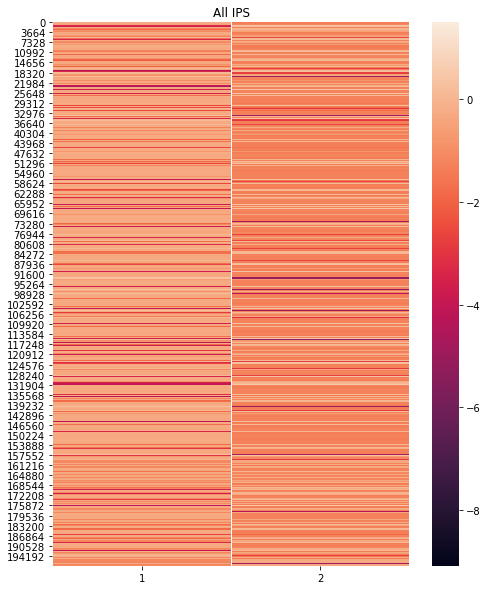

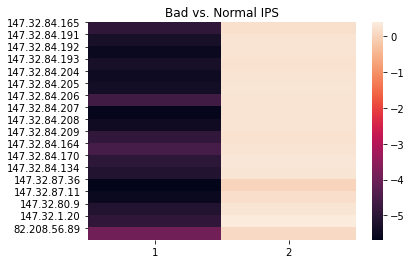

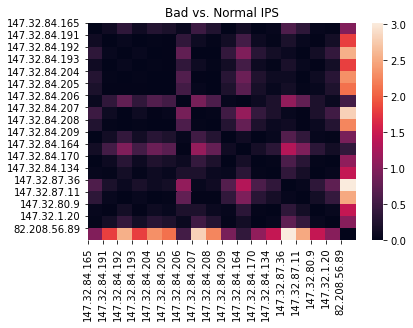

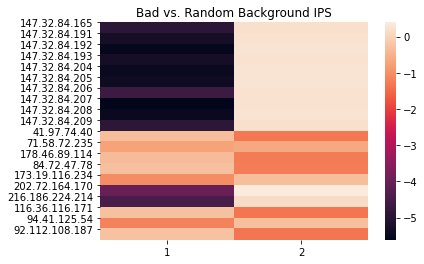

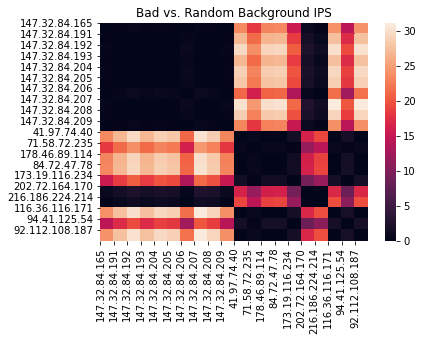

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 2, window_size: 4 Running Time:  425.5590524673462


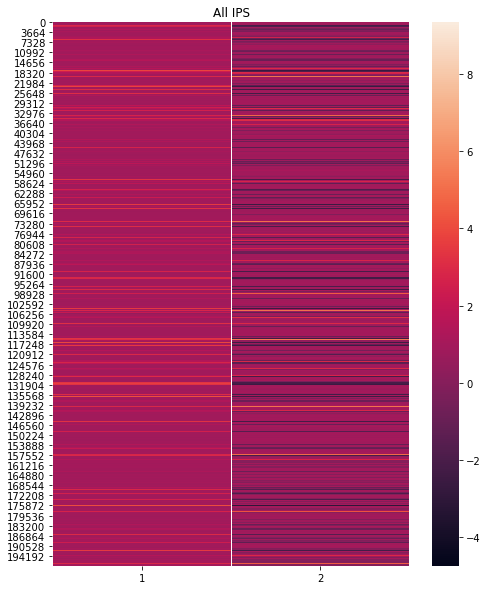

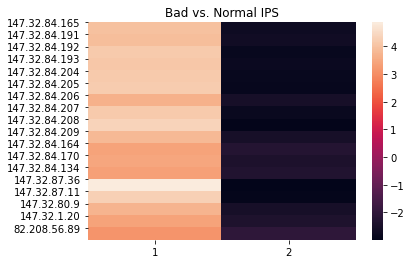

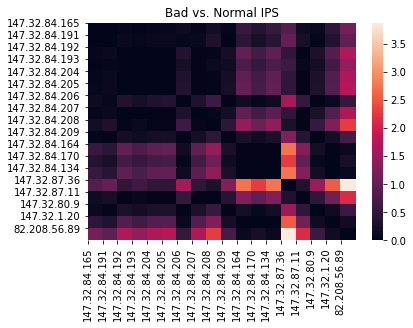

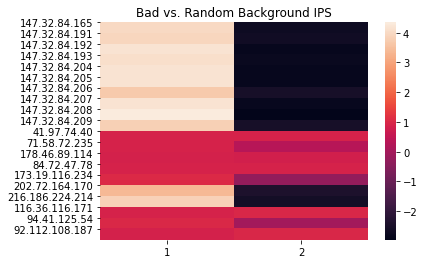

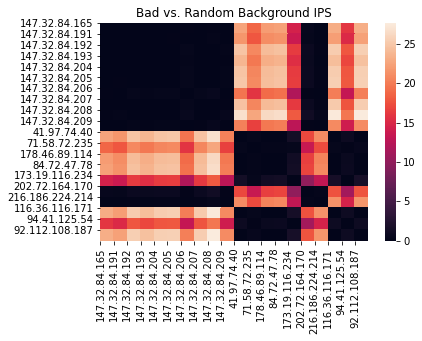

In [6]:
for representation_size in [2]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 4 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 4, window_size: 2 Running Time:  71.85697197914124


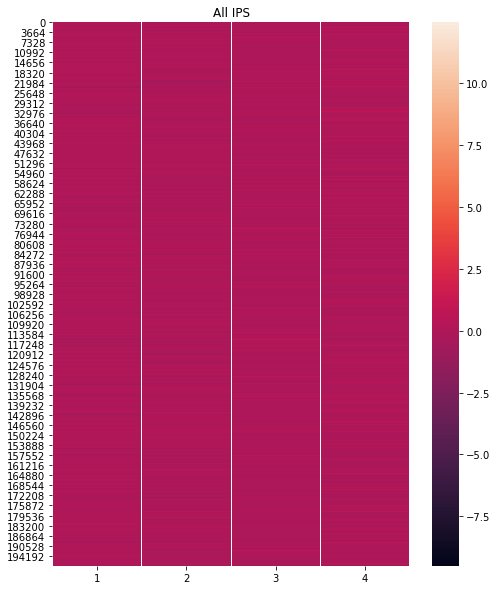

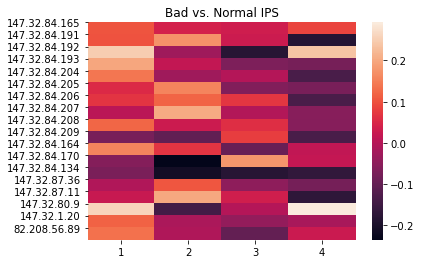

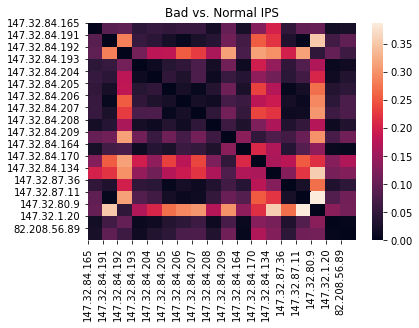

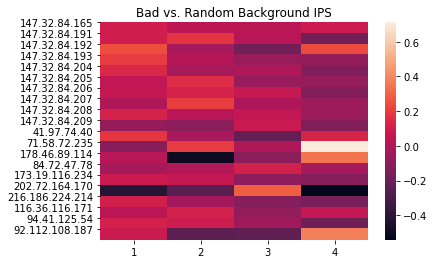

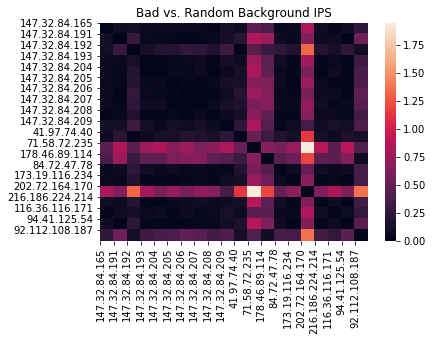

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 4, window_size: 4 Running Time:  55.14570093154907


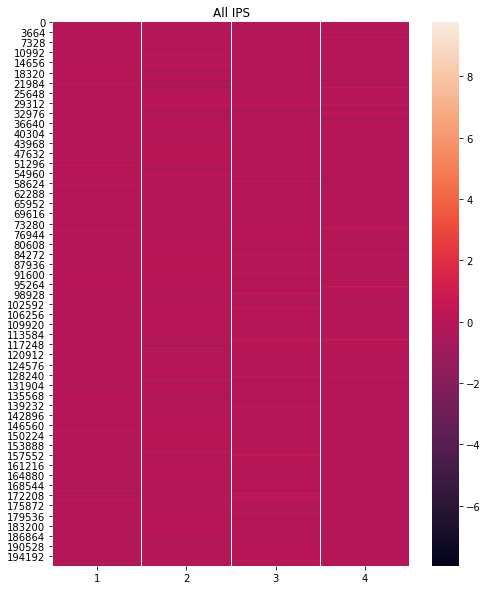

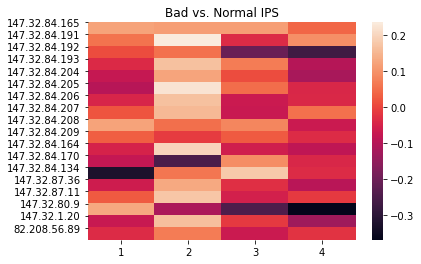

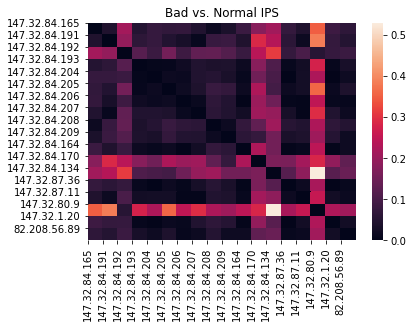

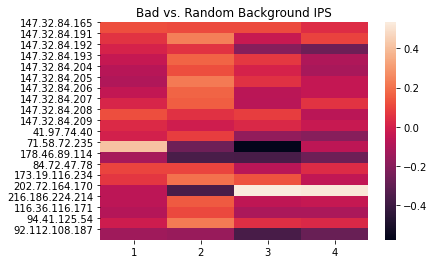

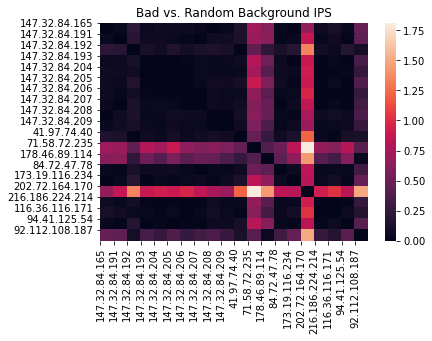

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 4, window_size: 2 Running Time:  120.89964485168457


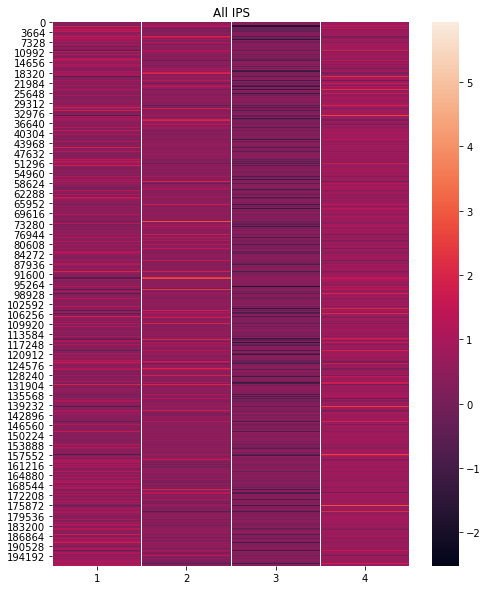

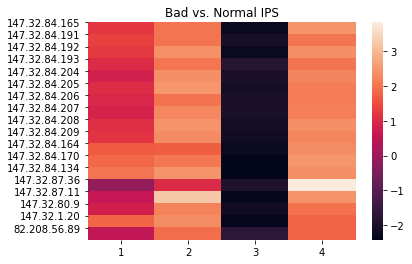

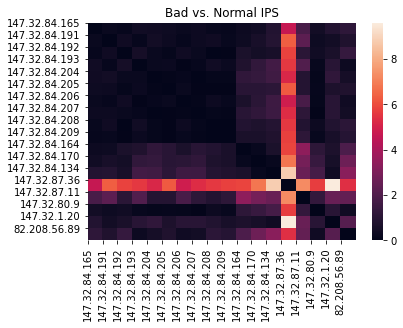

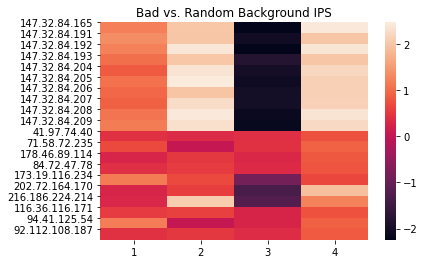

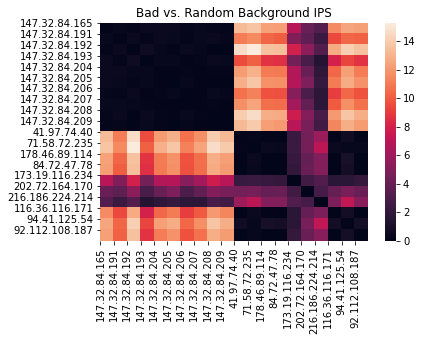

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 4, window_size: 4 Running Time:  130.74937510490417


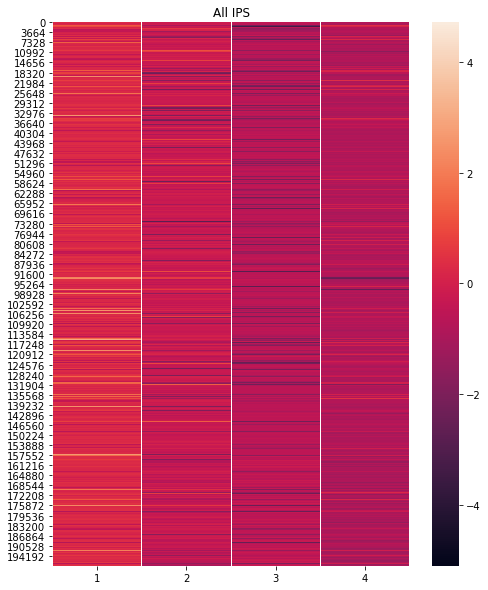

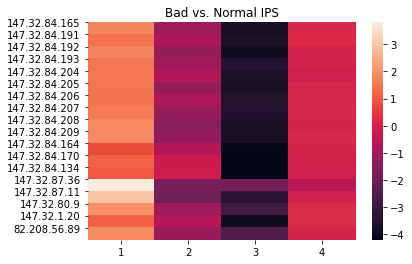

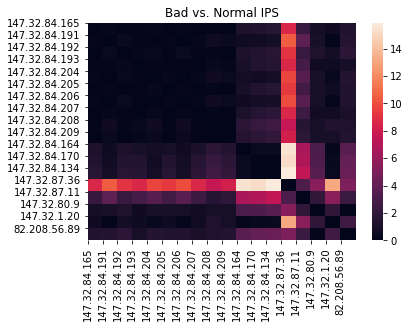

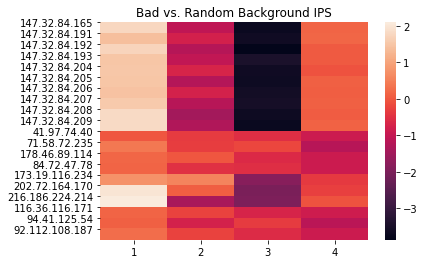

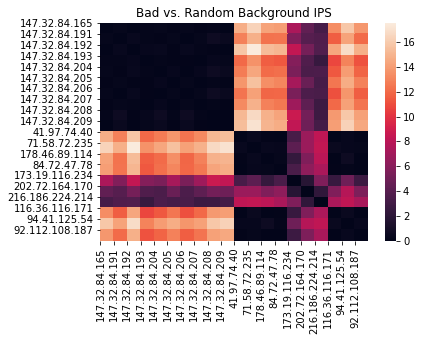

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 4, window_size: 2 Running Time:  206.1395754814148


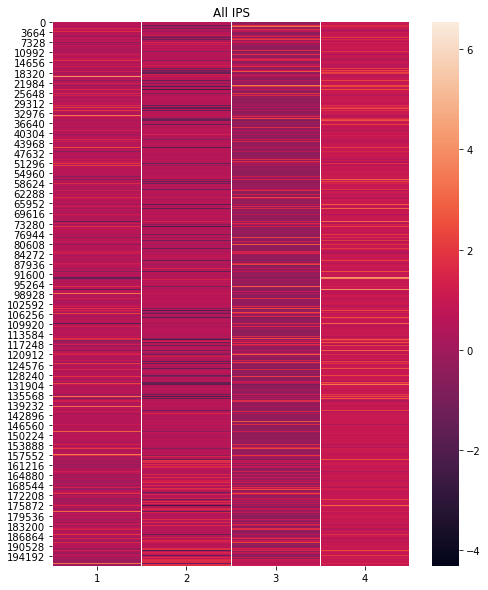

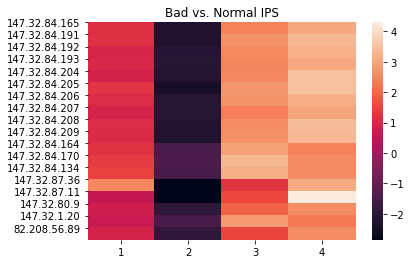

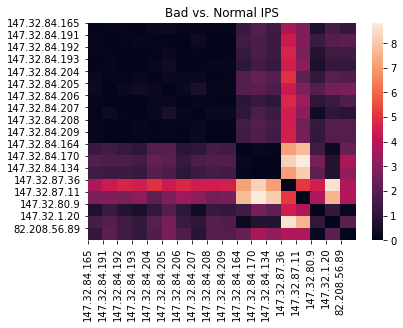

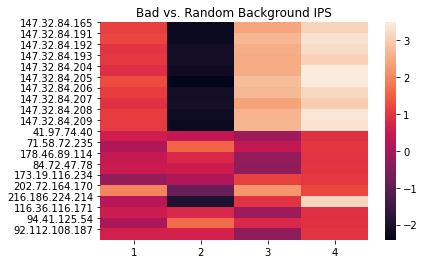

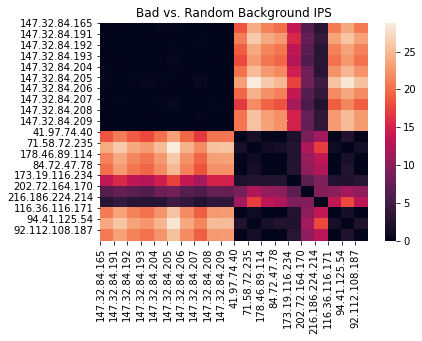

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 4, window_size: 4 Running Time:  249.47914791107178


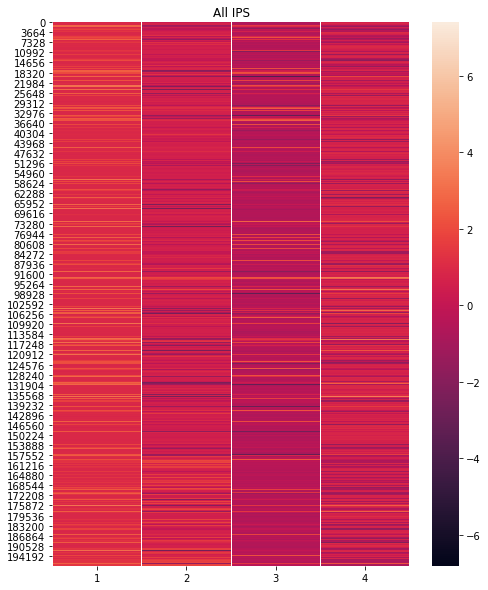

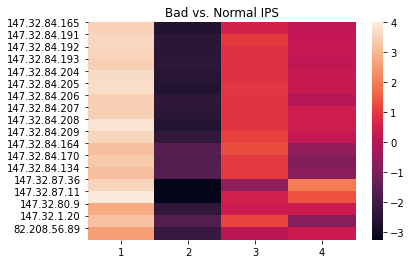

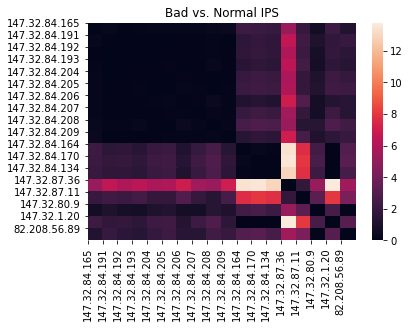

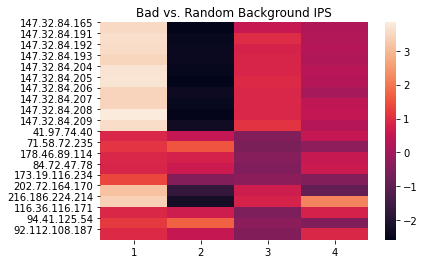

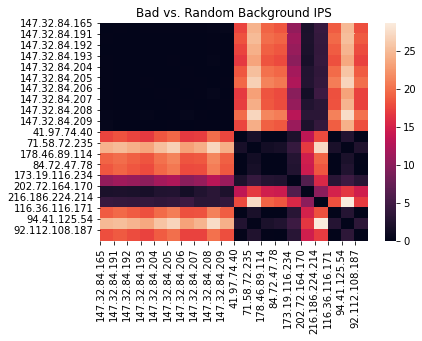

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 4, window_size: 2 Running Time:  69.53624868392944


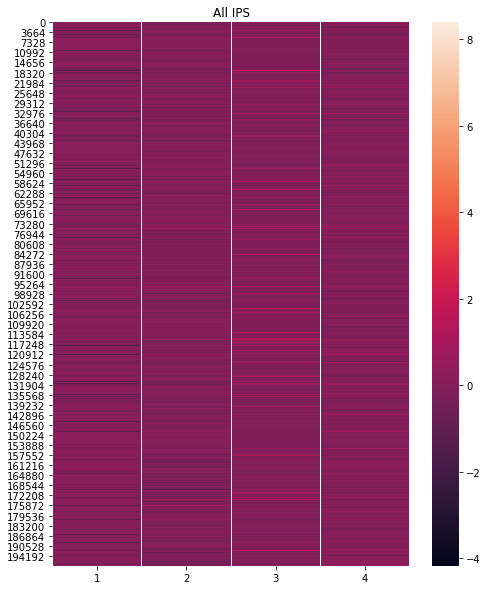

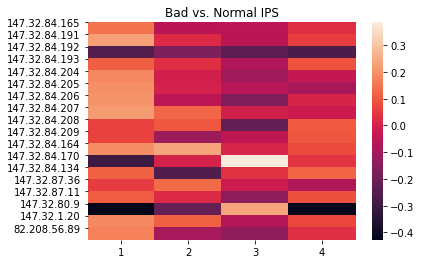

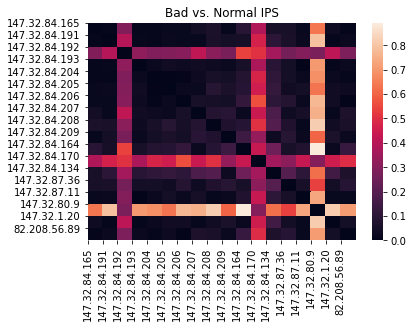

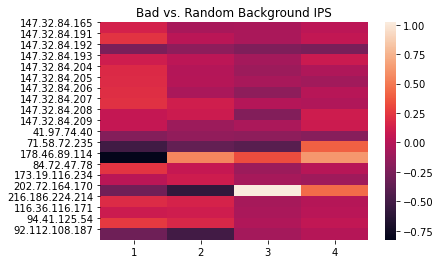

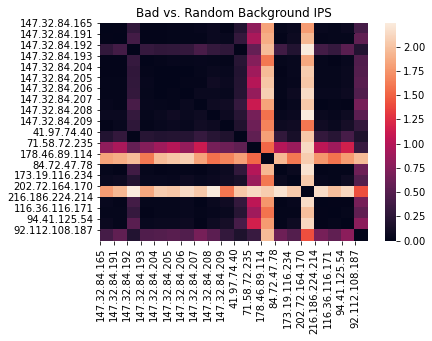

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 4, window_size: 4 Running Time:  69.99475526809692


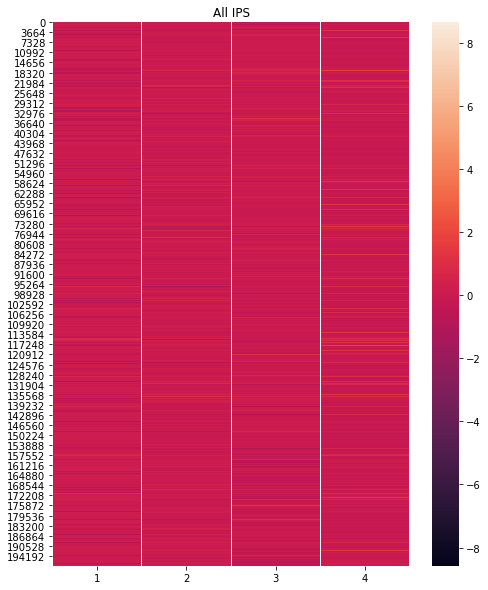

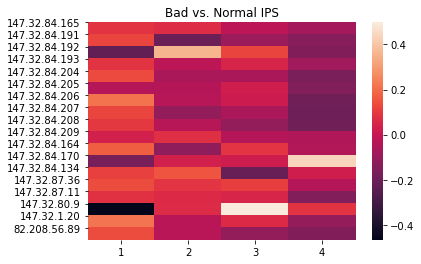

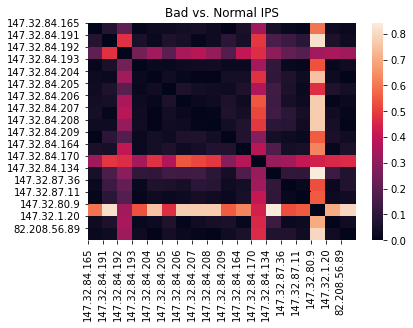

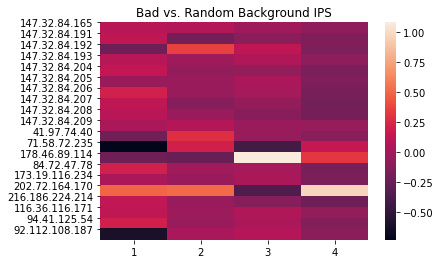

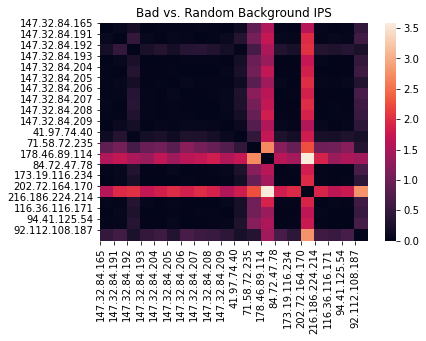

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 4, window_size: 2 Running Time:  204.18327116966248


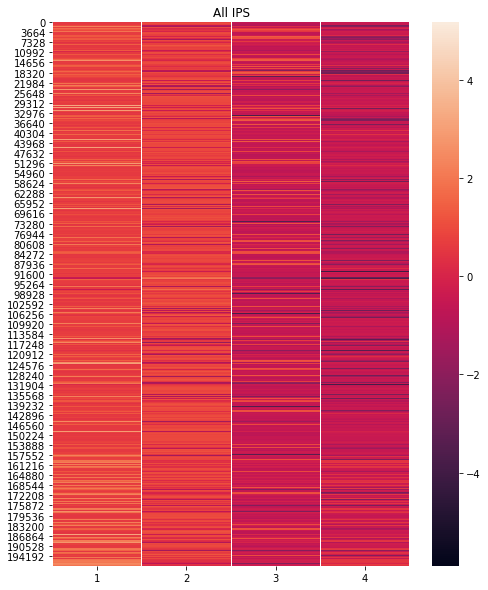

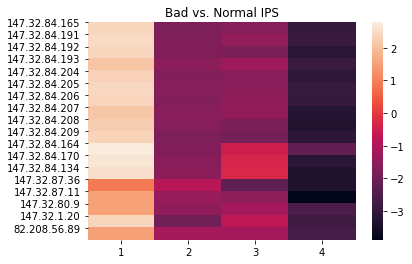

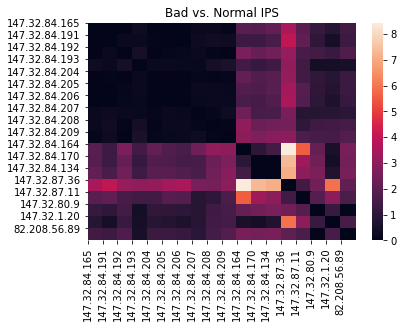

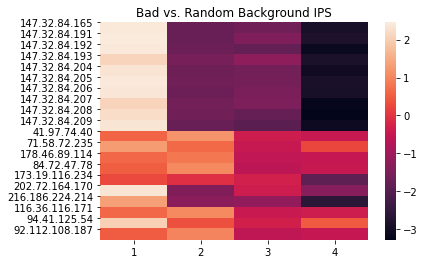

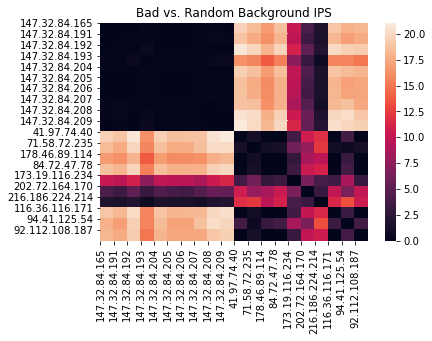

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 4, window_size: 4 Running Time:  224.4604890346527


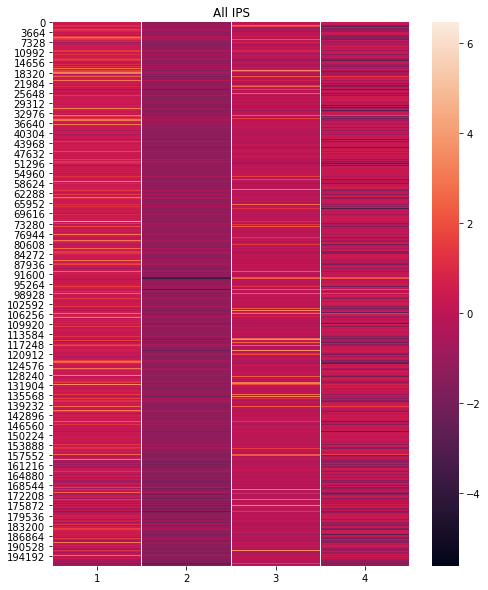

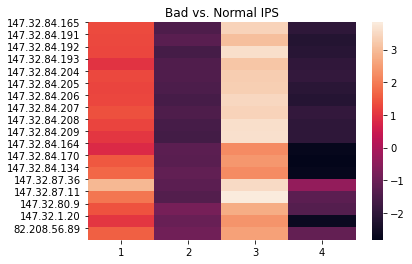

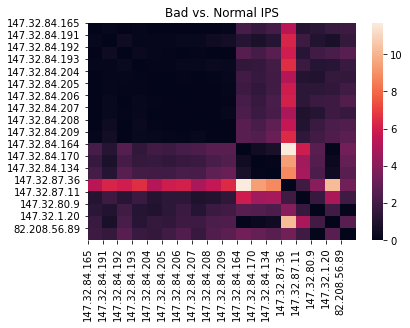

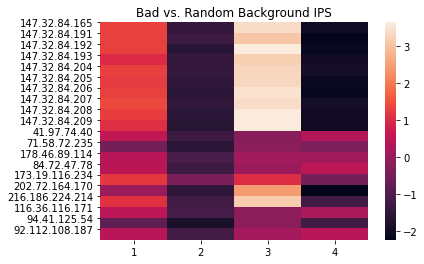

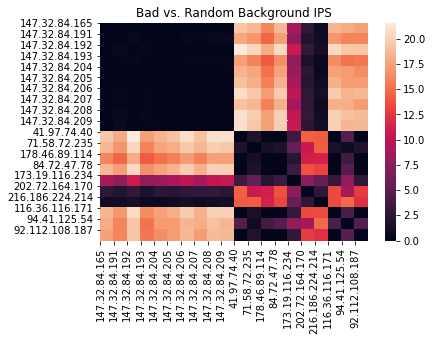

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 4, window_size: 2 Running Time:  366.00152921676636


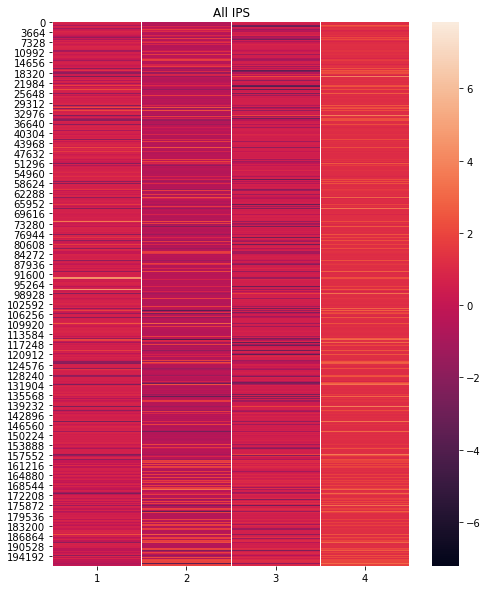

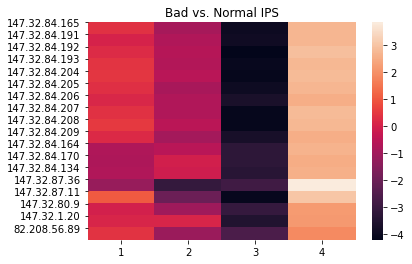

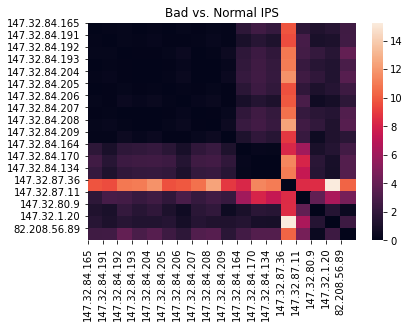

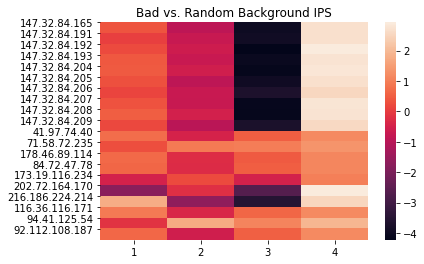

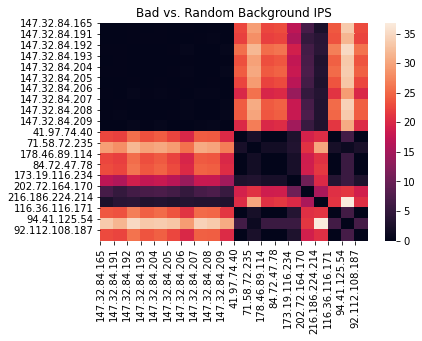

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 4, window_size: 4 Running Time:  454.31571316719055


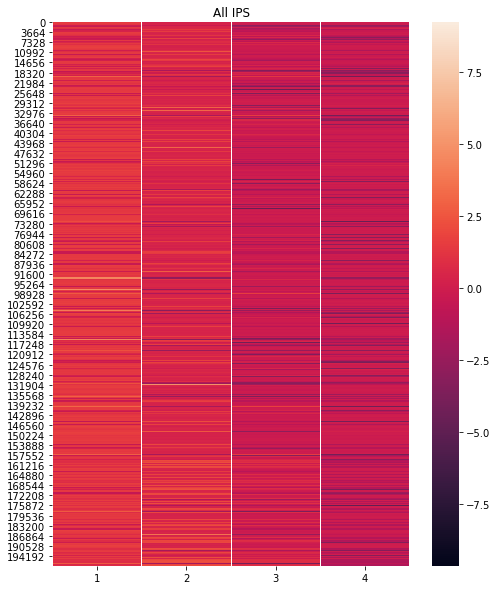

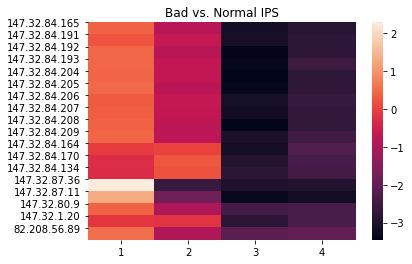

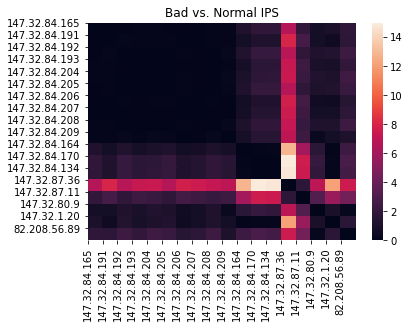

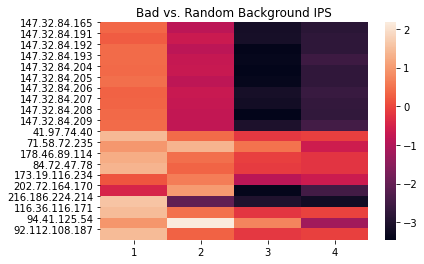

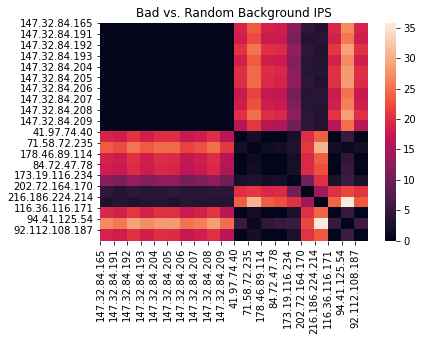

In [7]:
for representation_size in [4]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 8 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 8, window_size: 2 Running Time:  55.049564361572266


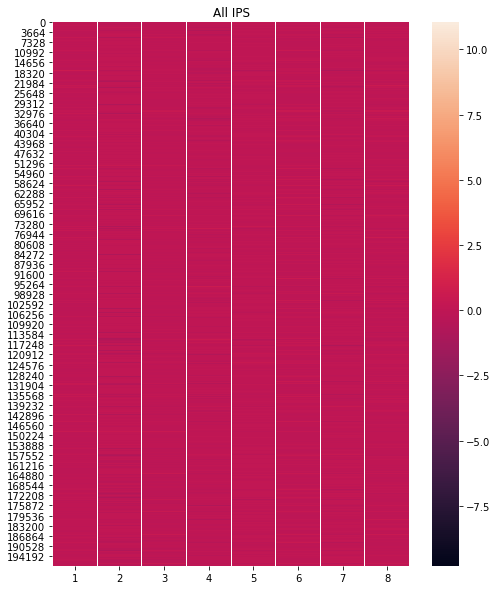

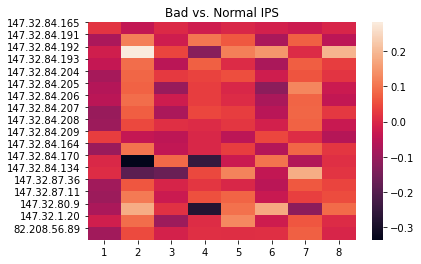

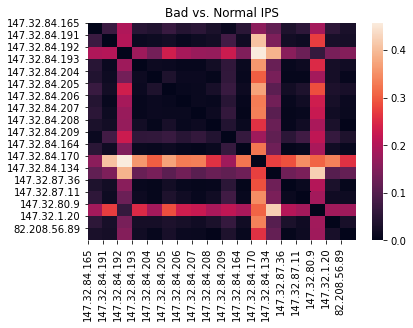

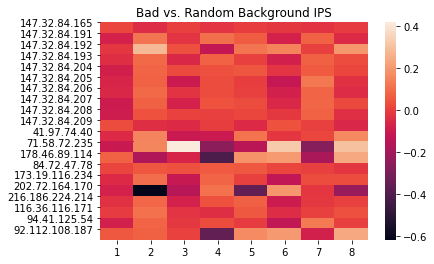

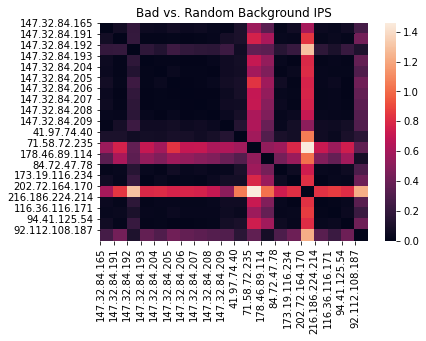

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 8, window_size: 4 Running Time:  55.14283895492554


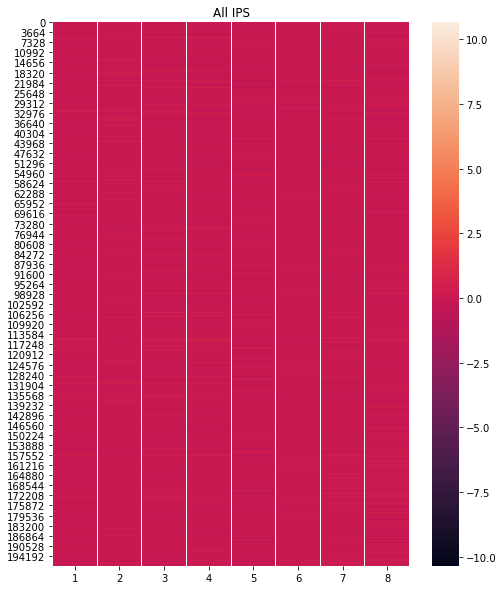

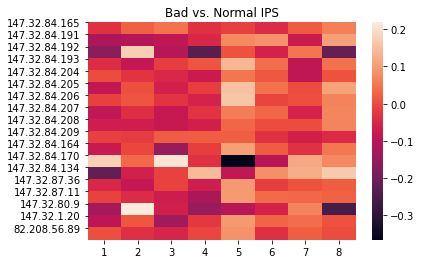

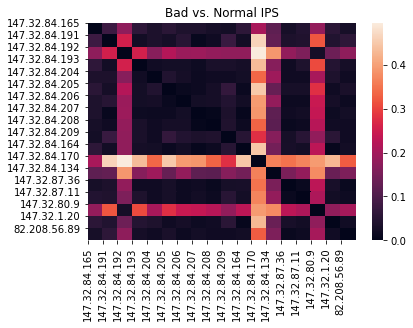

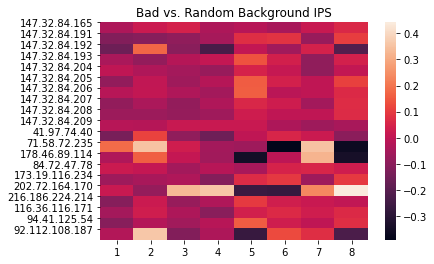

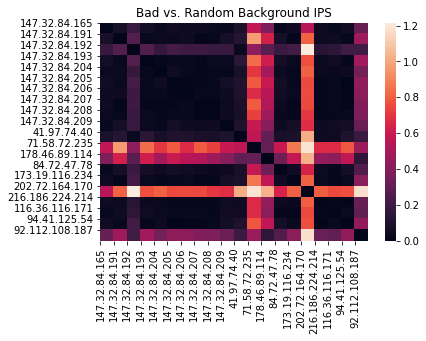

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  132.33964562416077


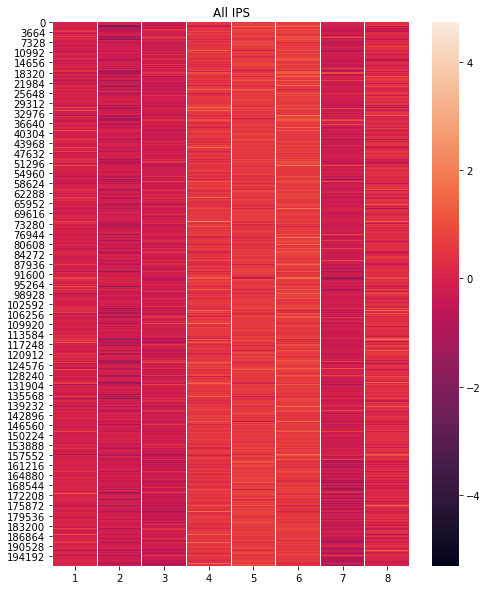

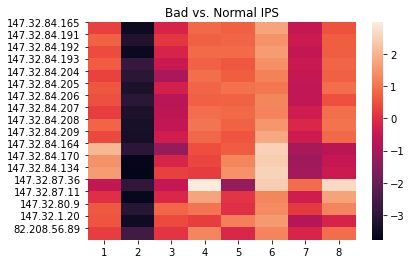

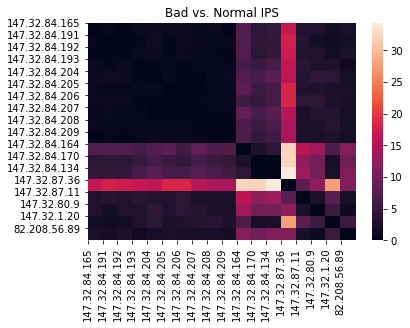

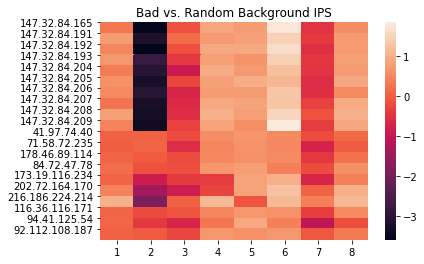

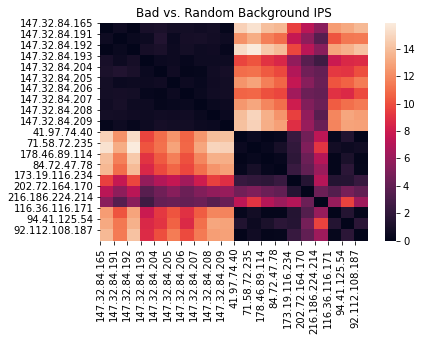

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 8, window_size: 4 Running Time:  142.30859637260437


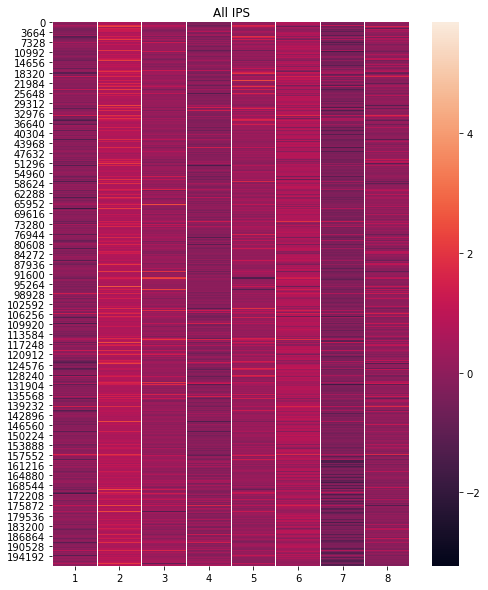

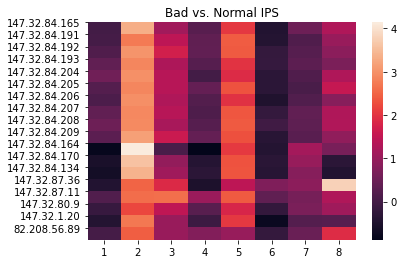

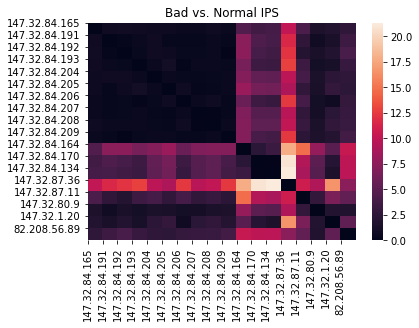

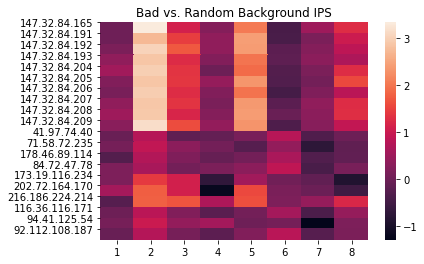

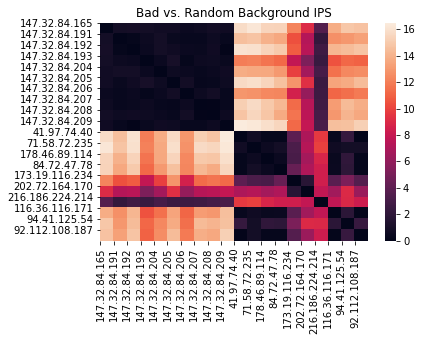

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 8, window_size: 2 Running Time:  229.1362054347992


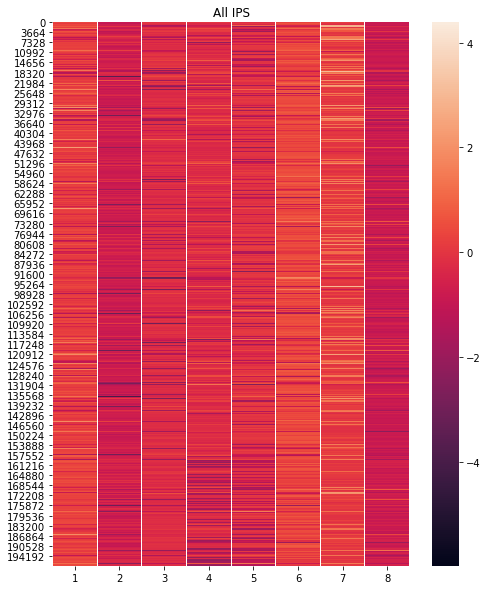

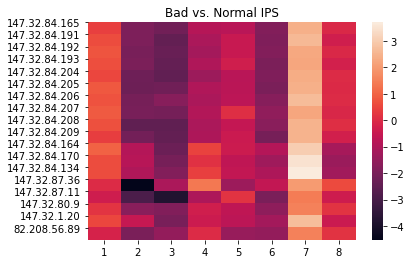

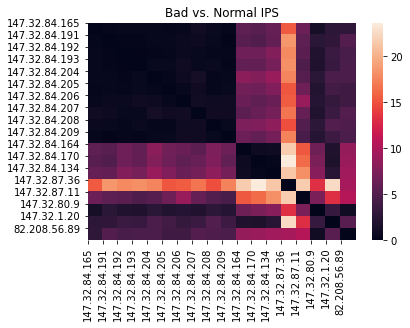

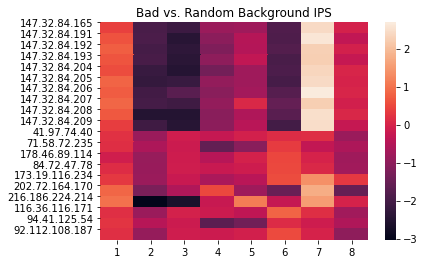

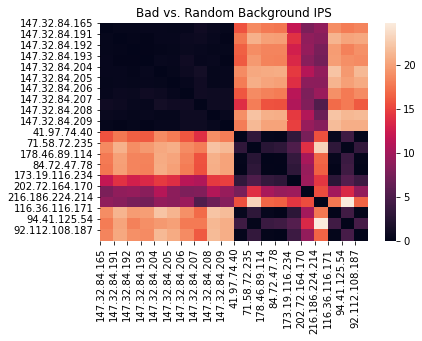

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 8, window_size: 4 Running Time:  282.59636211395264


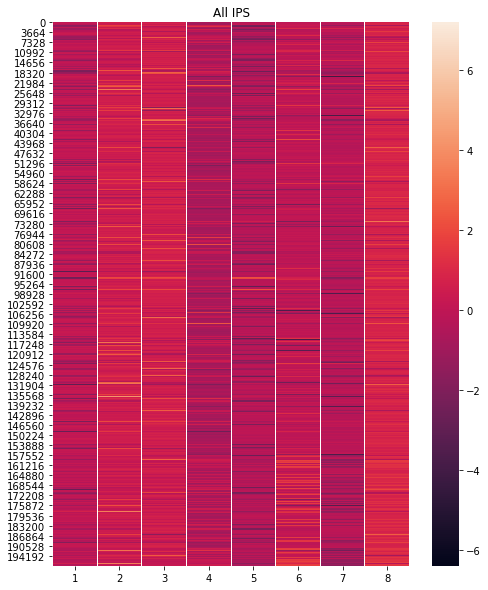

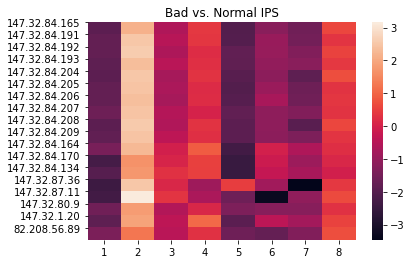

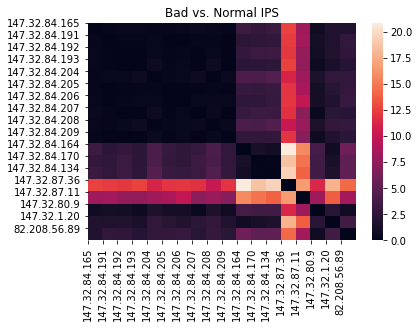

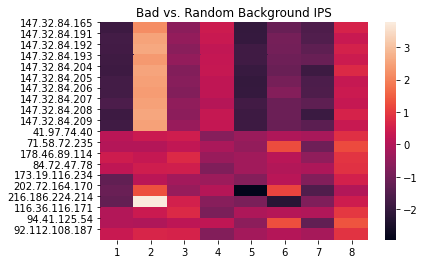

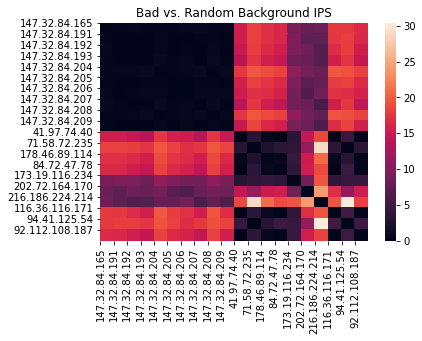

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 8, window_size: 2 Running Time:  71.72975778579712


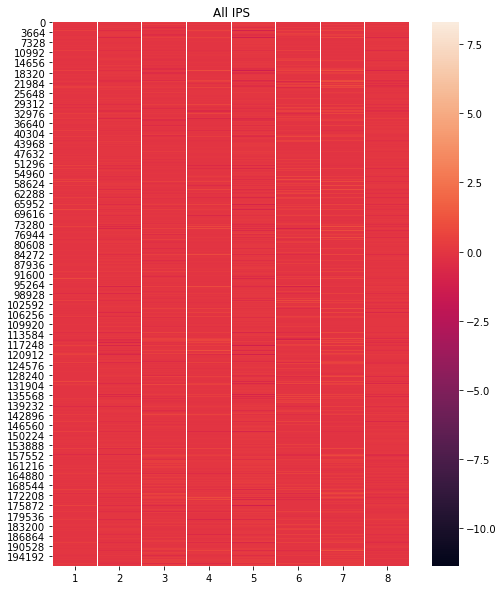

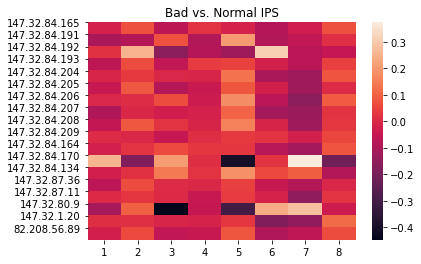

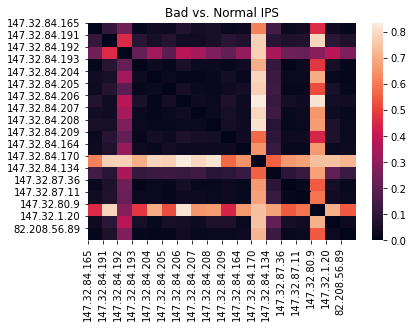

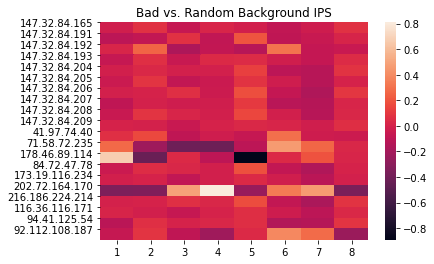

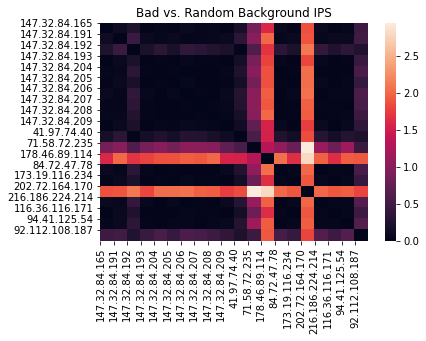

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 8, window_size: 4 Running Time:  71.20408654212952


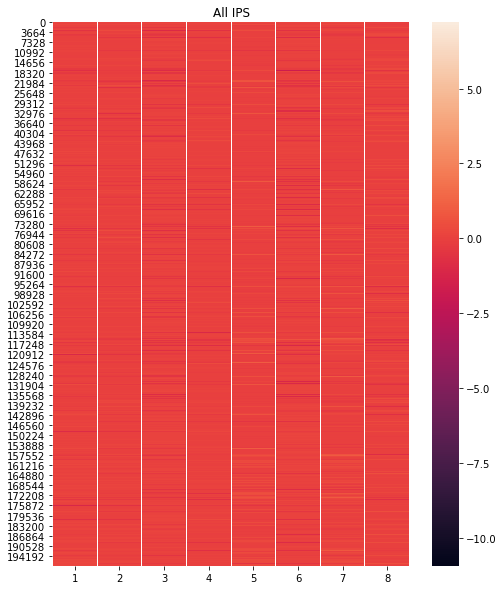

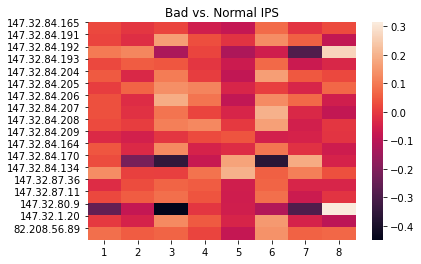

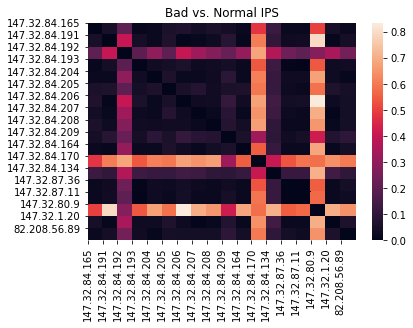

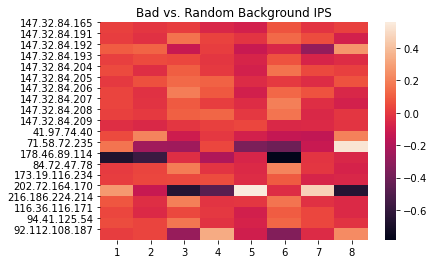

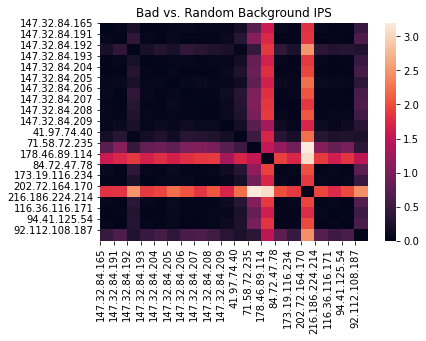

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 8, window_size: 2 Running Time:  225.08097434043884


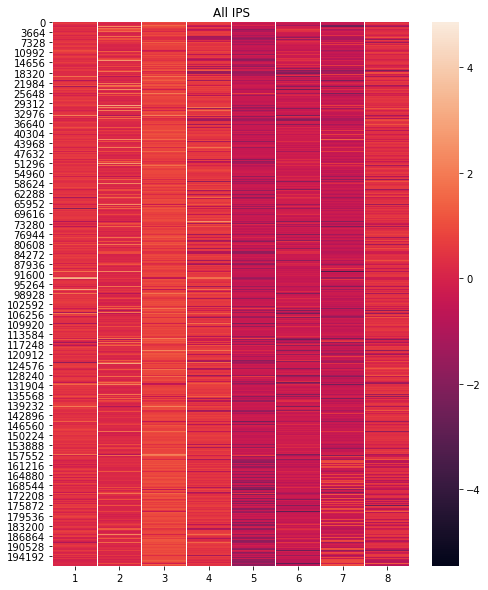

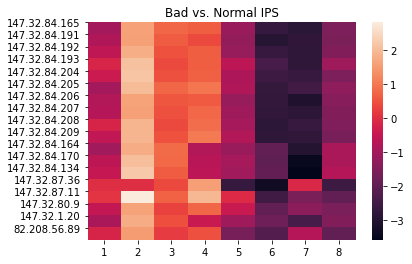

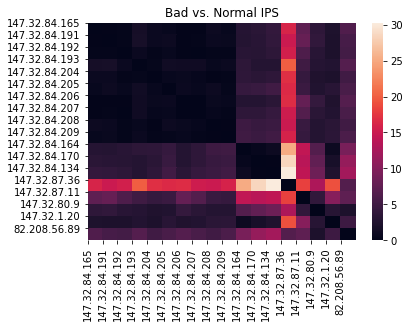

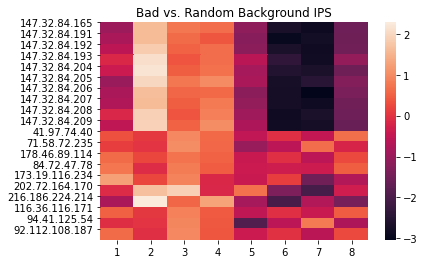

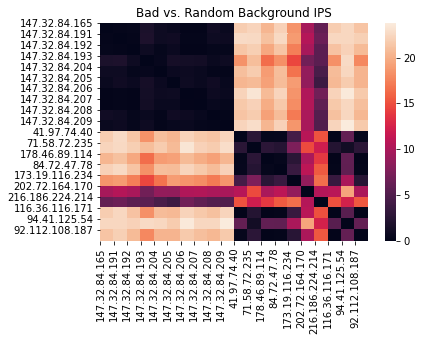

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 8, window_size: 4 Running Time:  247.9568109512329


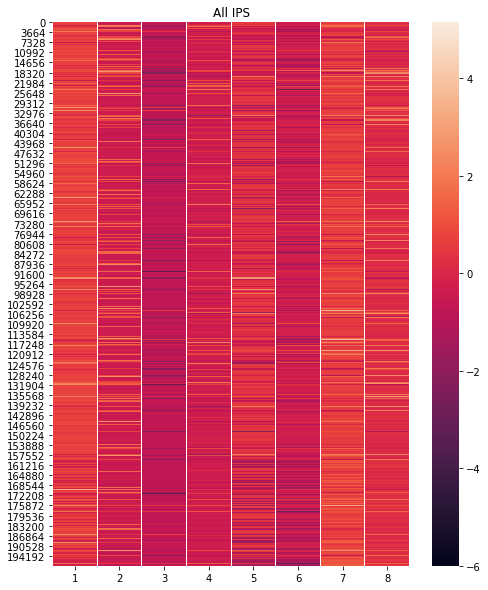

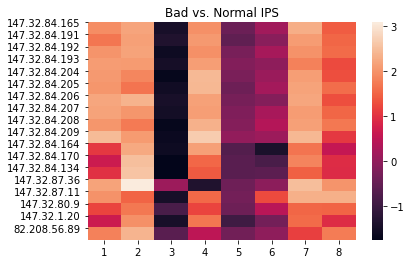

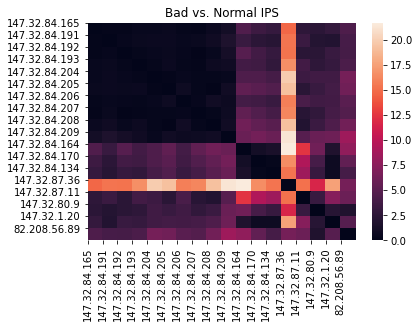

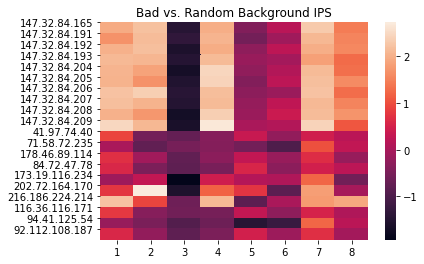

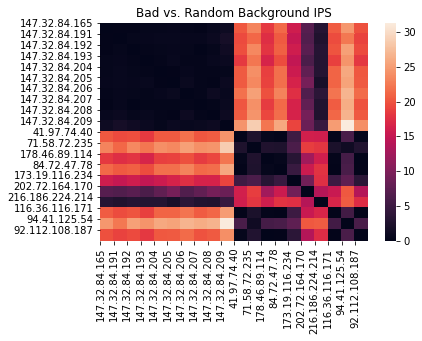

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 8, window_size: 2 Running Time:  420.5893099308014


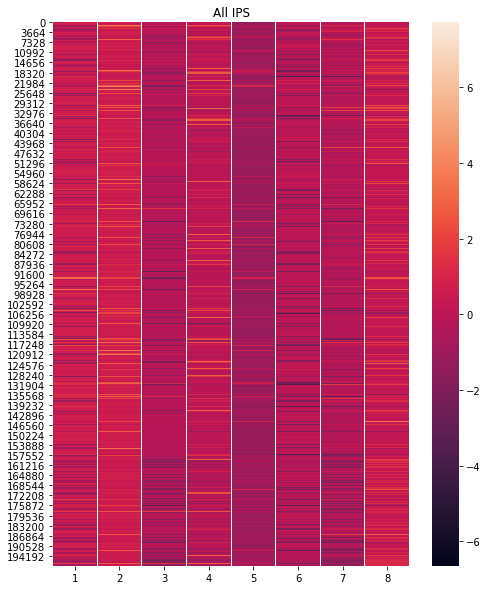

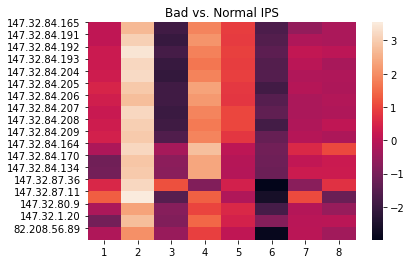

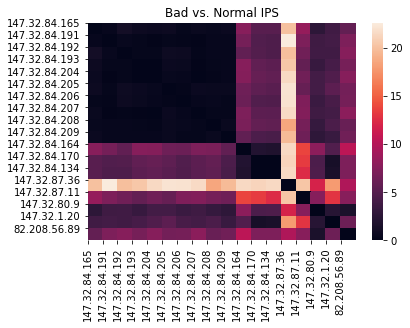

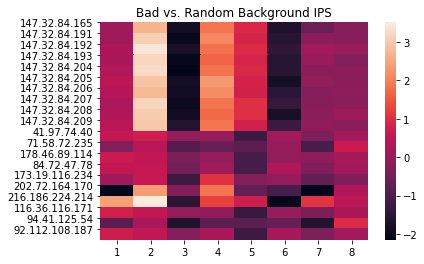

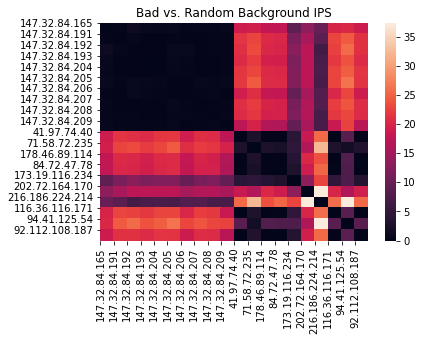

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 8, window_size: 4 Running Time:  519.9228208065033


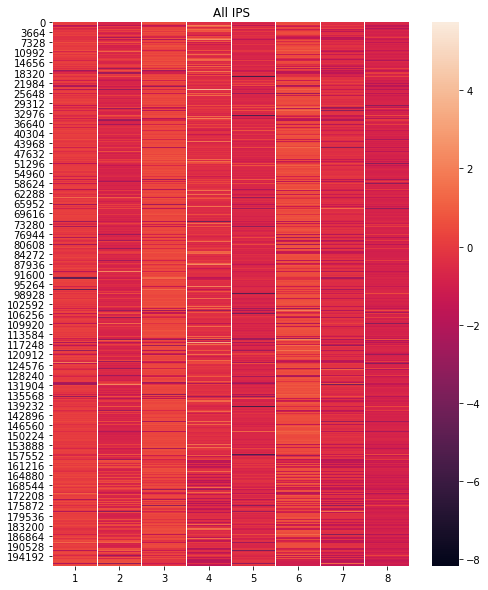

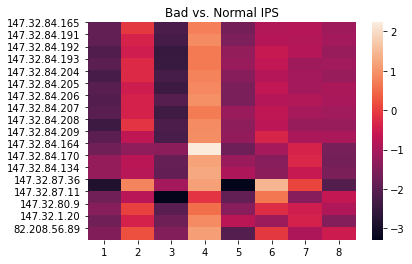

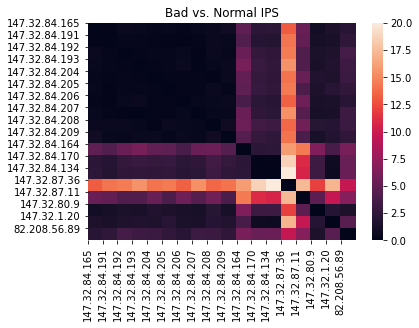

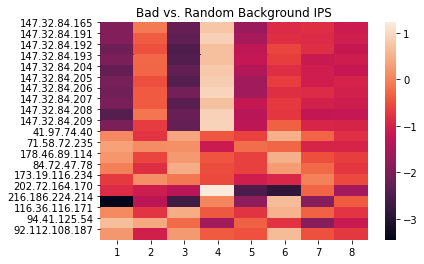

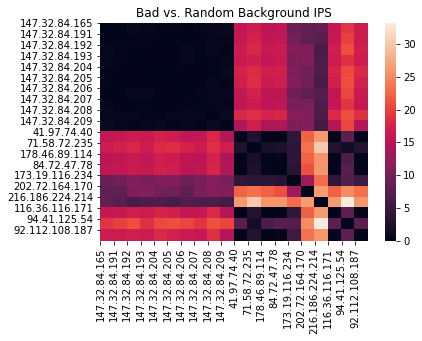

In [8]:
for representation_size in [8]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 12 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 12, window_size: 2 Running Time:  56.3693470954895


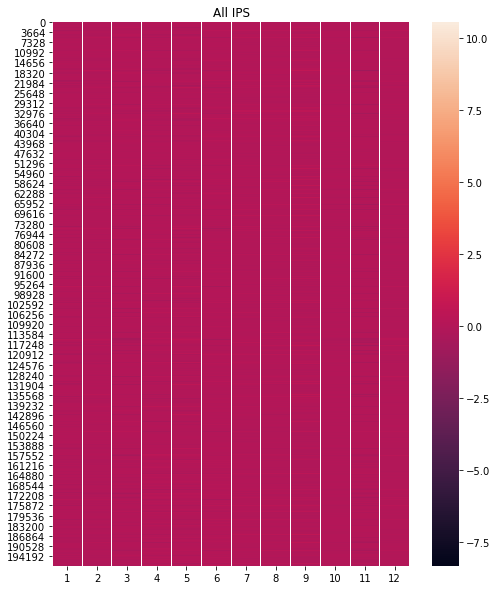

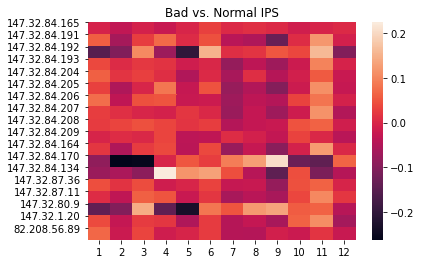

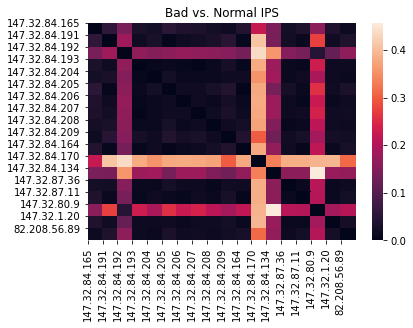

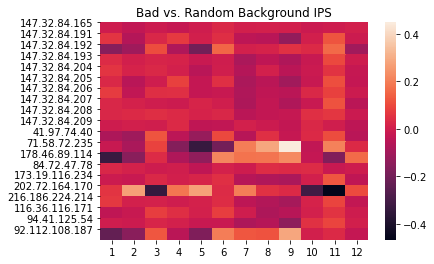

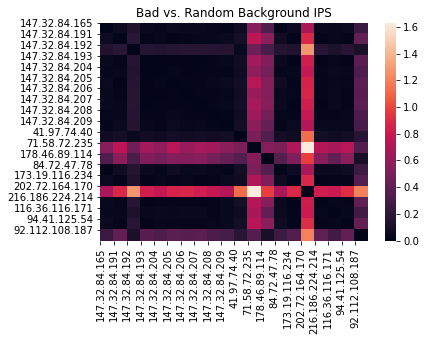

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 12, window_size: 4 Running Time:  56.05996561050415


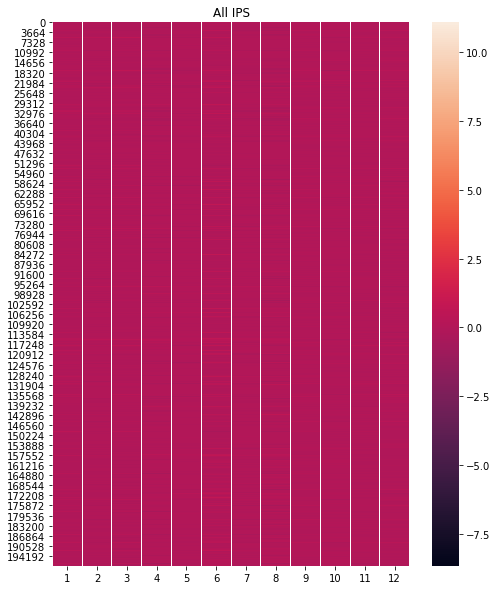

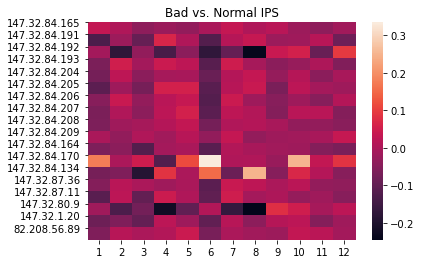

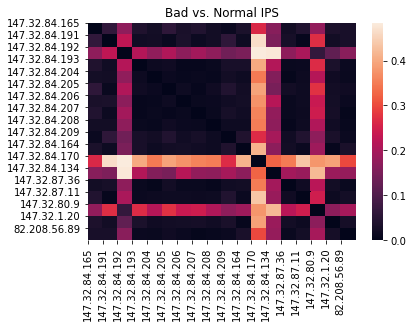

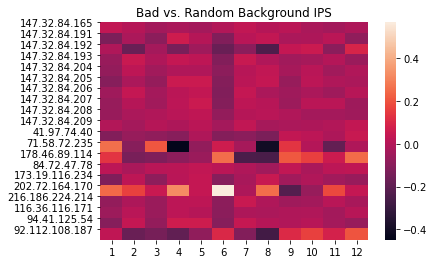

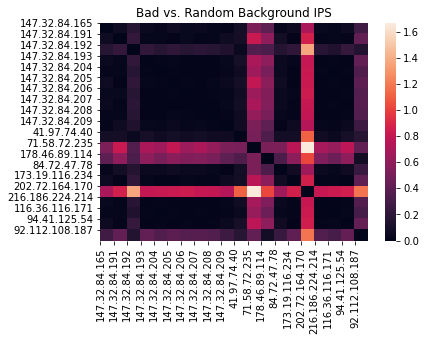

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 12, window_size: 2 Running Time:  141.6381471157074


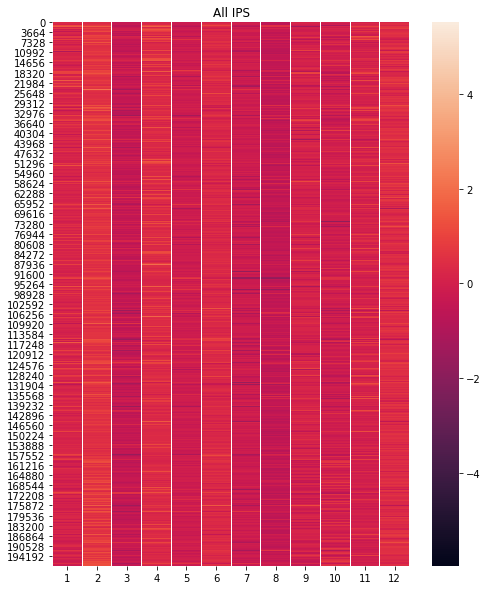

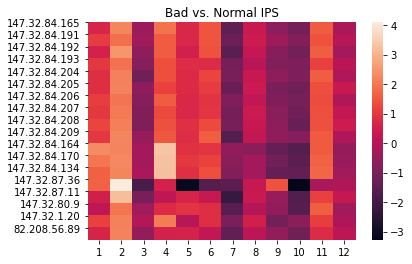

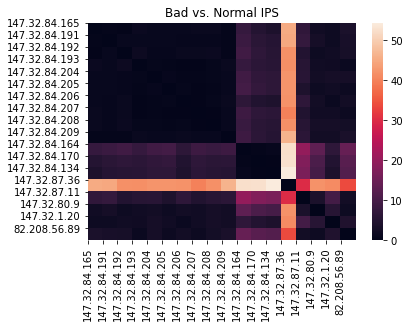

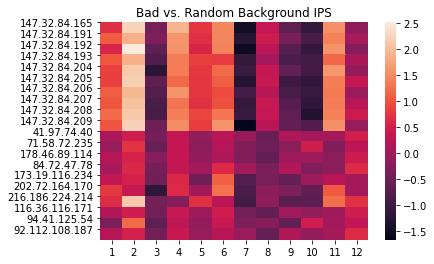

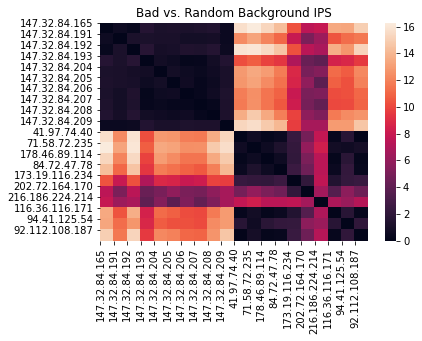

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 12, window_size: 4 Running Time:  153.1057894229889


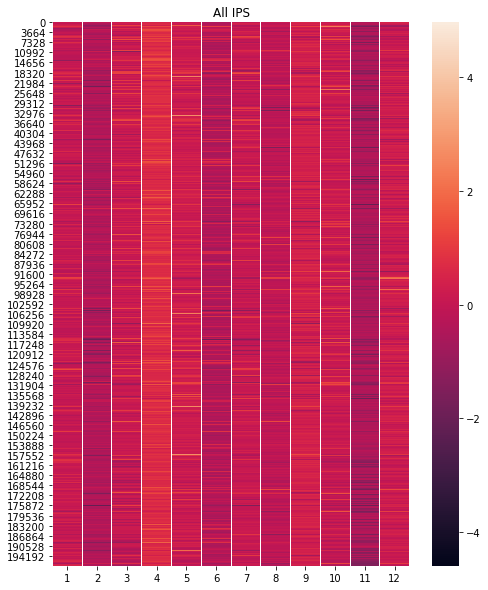

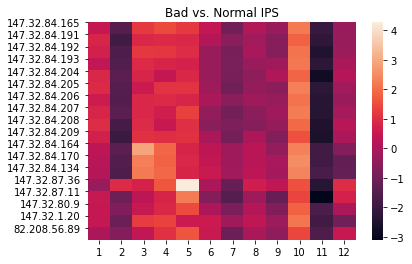

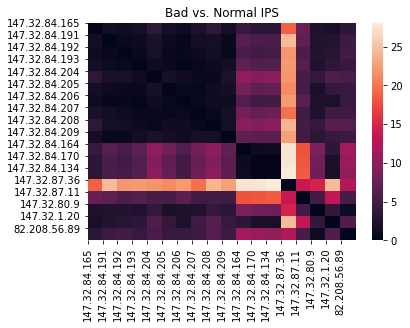

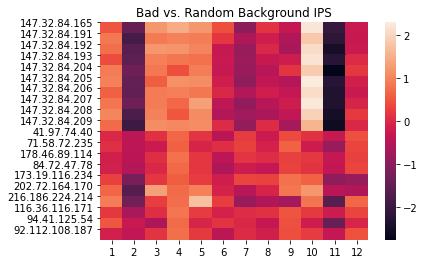

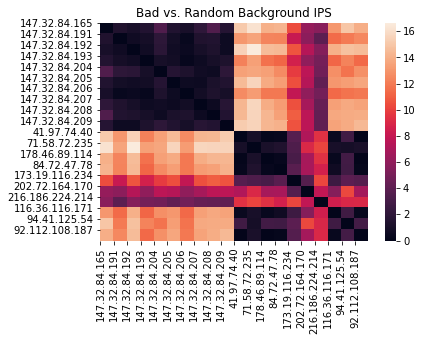

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 12, window_size: 2 Running Time:  247.94890332221985


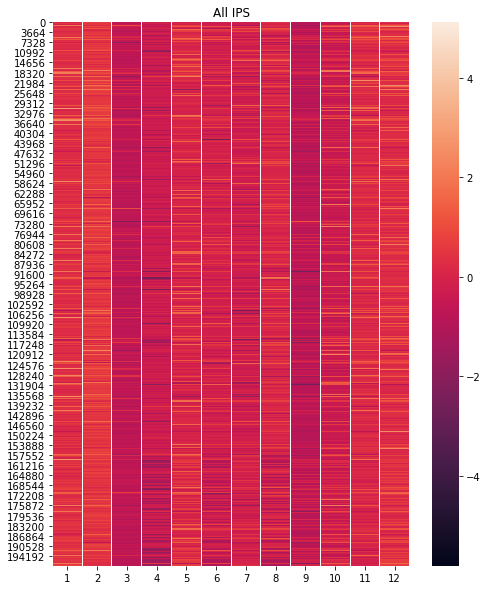

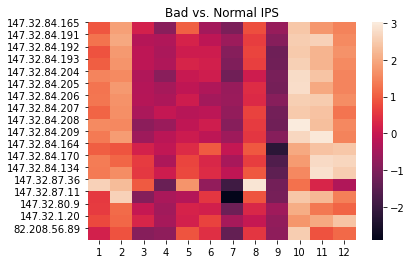

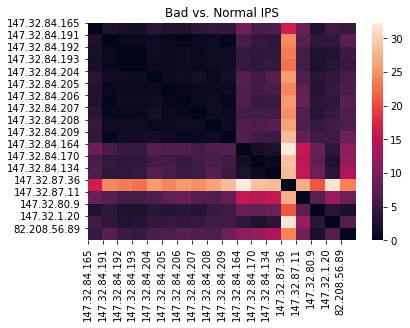

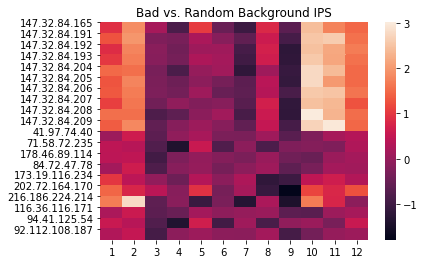

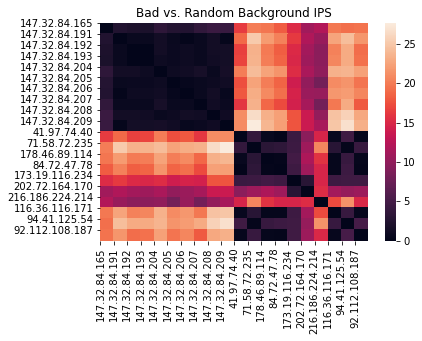

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 12, window_size: 4 Running Time:  306.24381589889526


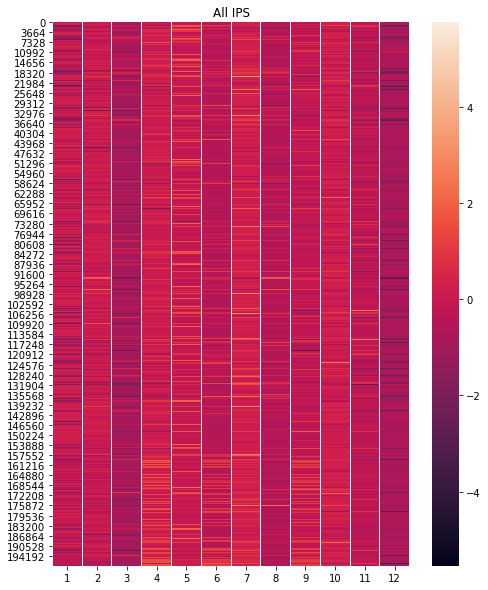

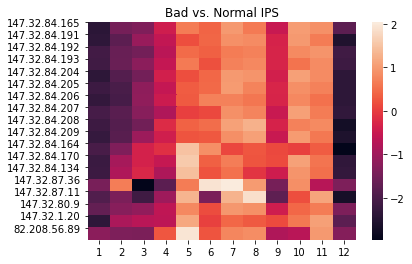

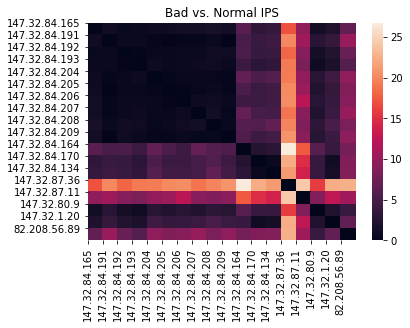

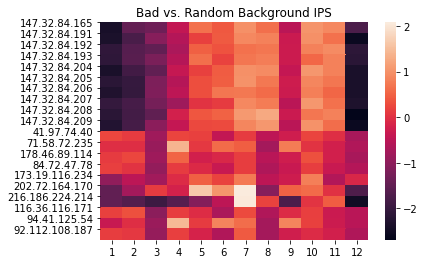

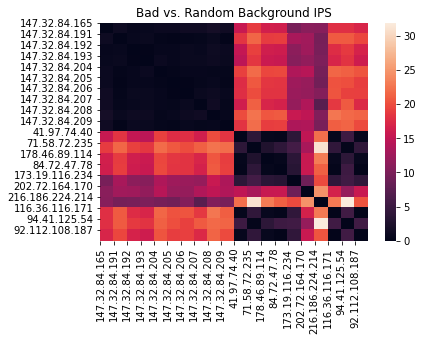

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 12, window_size: 2 Running Time:  72.2417676448822


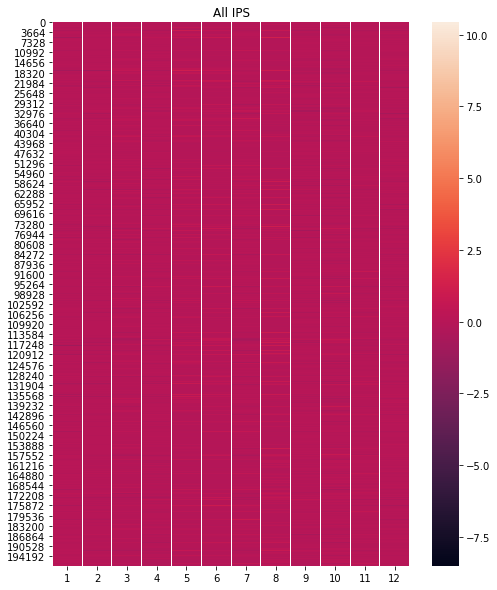

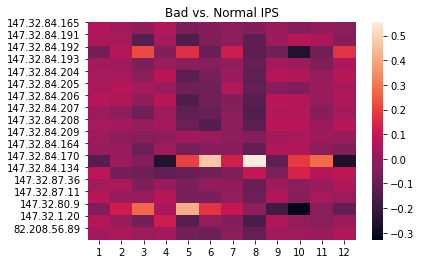

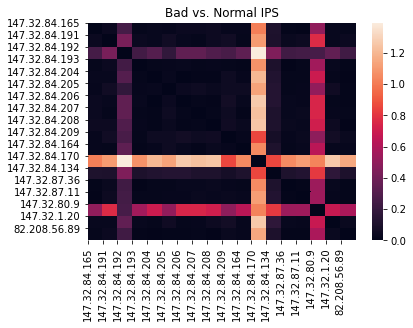

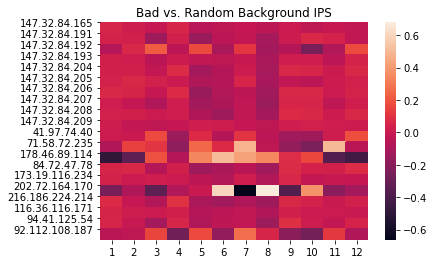

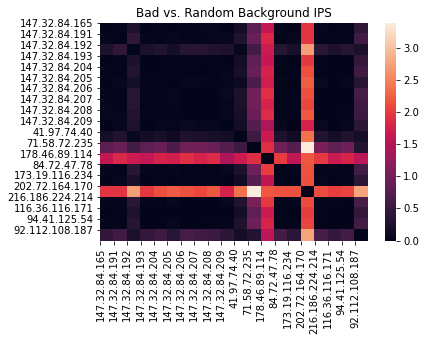

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 12, window_size: 4 Running Time:  72.78480124473572


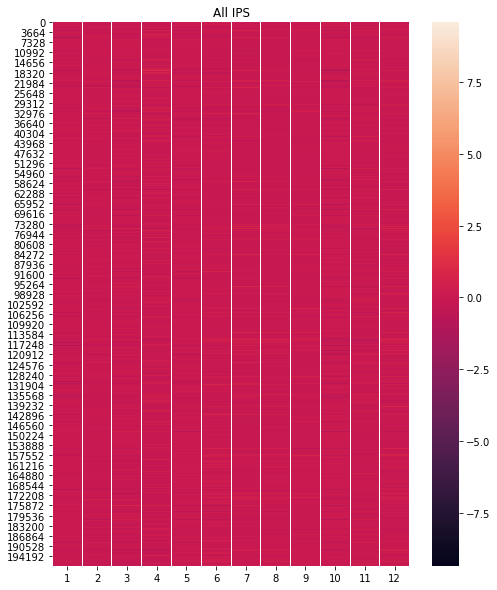

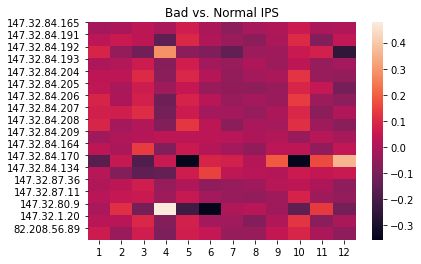

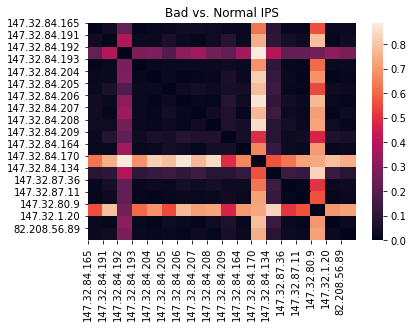

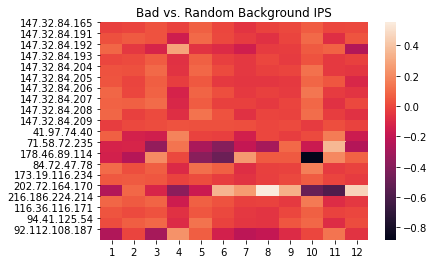

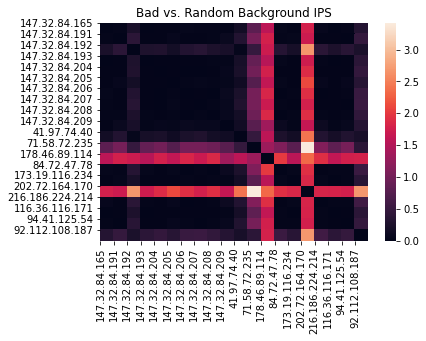

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 12, window_size: 2 Running Time:  244.95223188400269


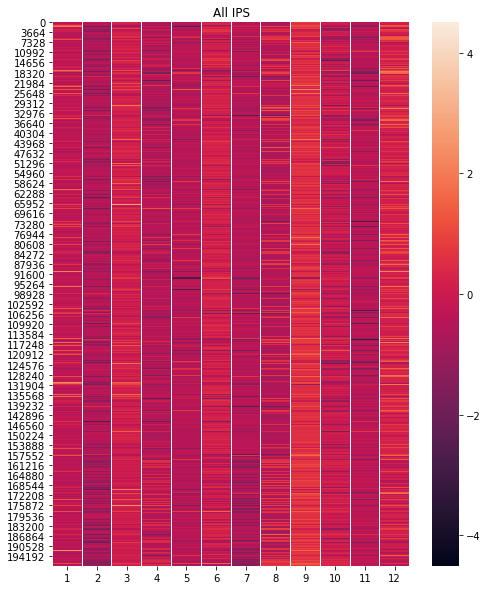

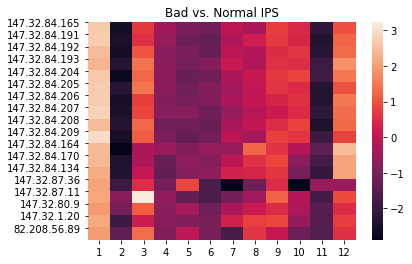

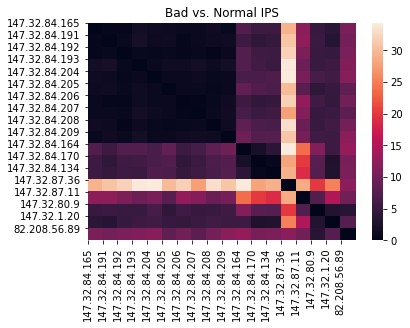

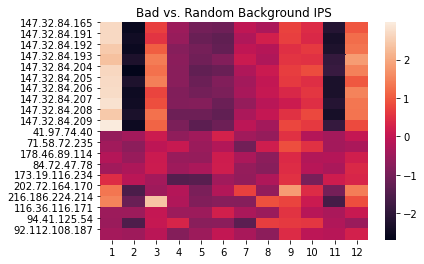

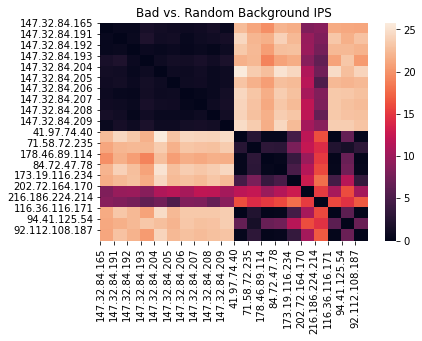

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 12, window_size: 4 Running Time:  268.5857136249542


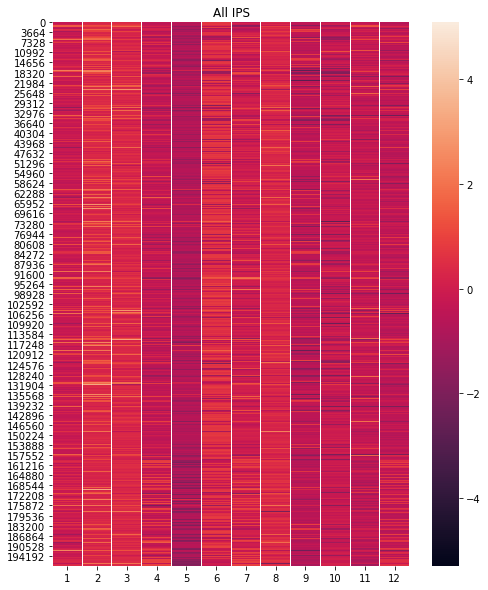

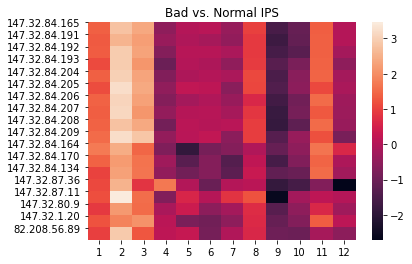

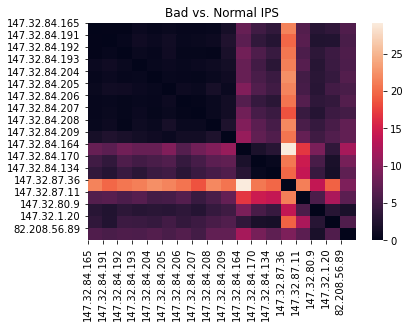

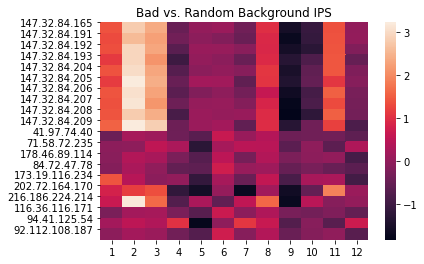

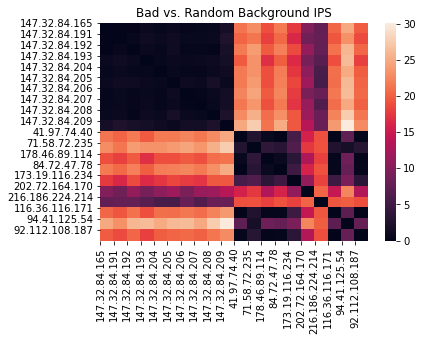

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 12, window_size: 2 Running Time:  457.40995621681213


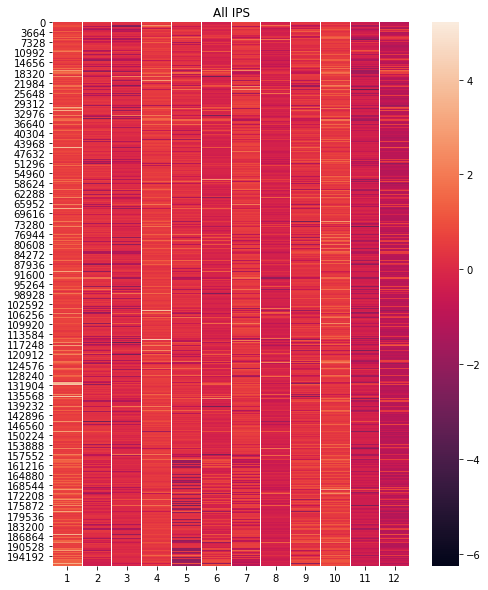

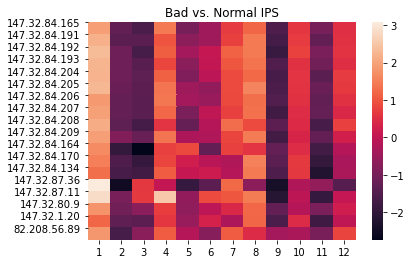

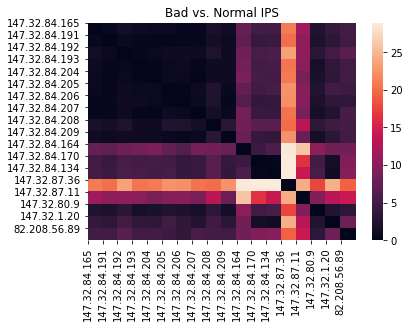

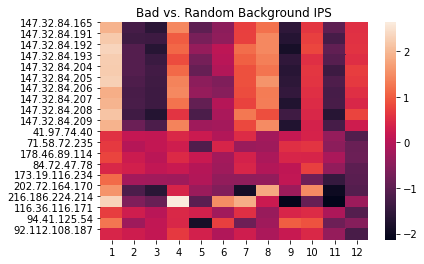

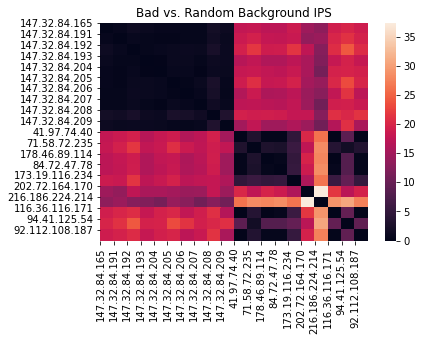

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 12, window_size: 4 Running Time:  574.592636346817


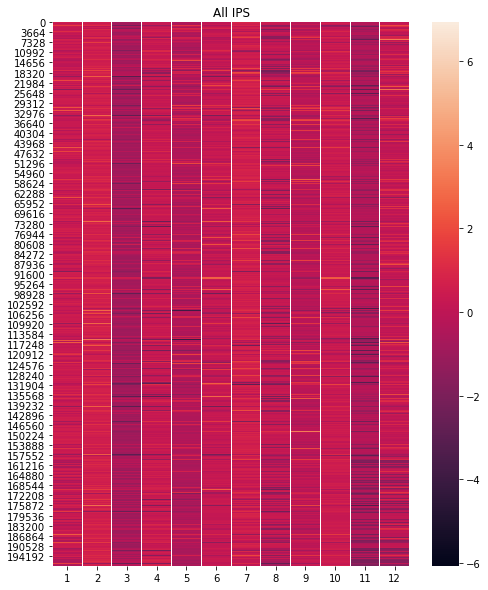

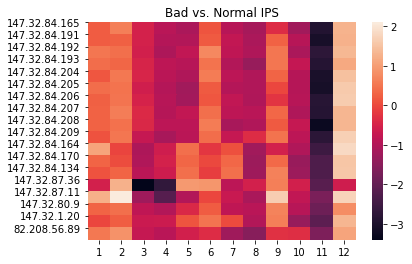

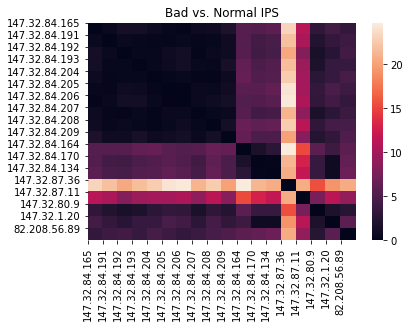

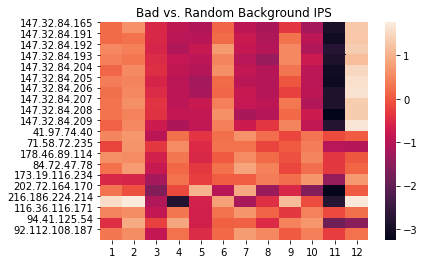

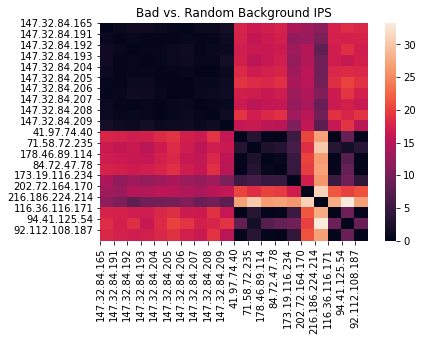

In [9]:
for representation_size in [12]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

# 16 dimensions

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 16, window_size: 2 Running Time:  56.99046993255615


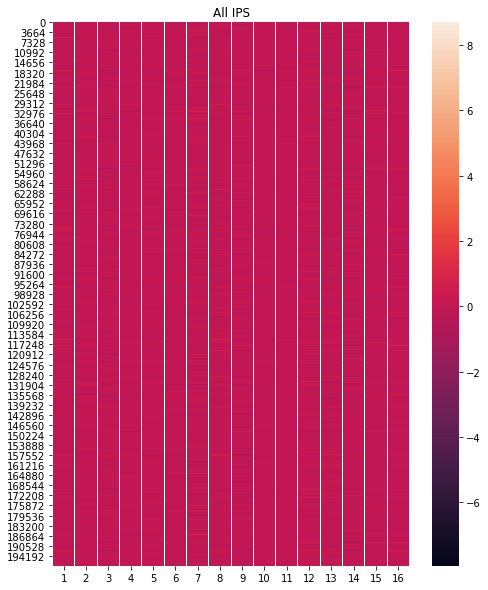

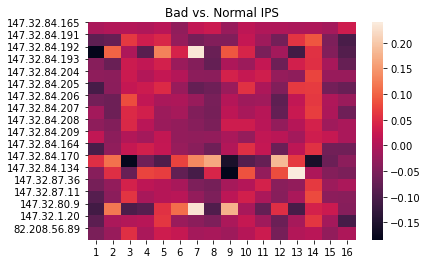

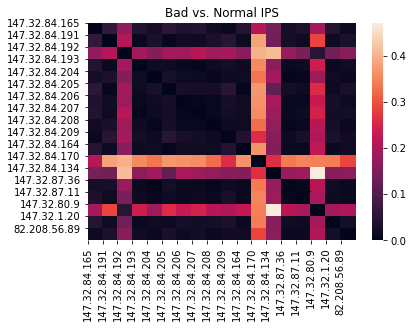

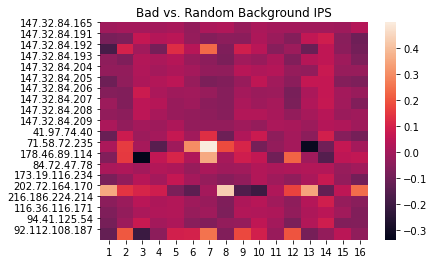

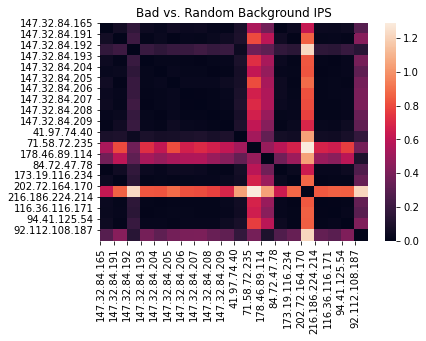

--------------------------------------------------
n_walks: 5, walk_length: 2, representation_size: 16, window_size: 4 Running Time:  57.312183141708374


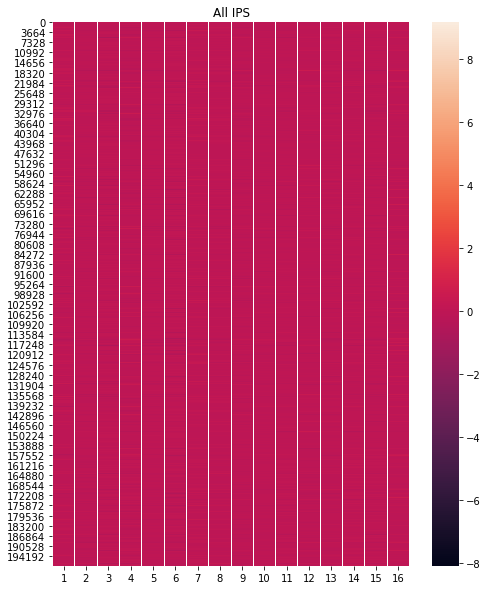

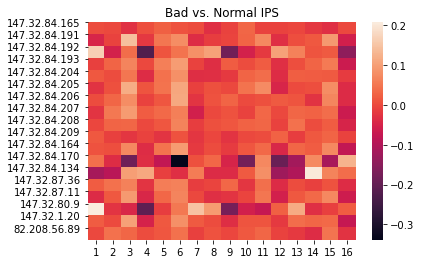

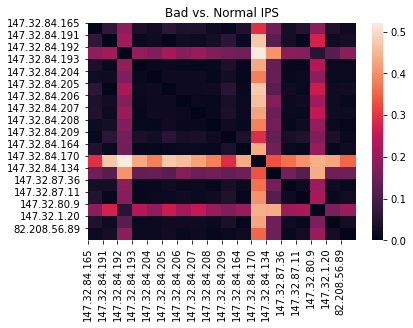

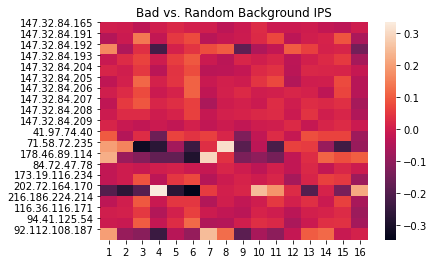

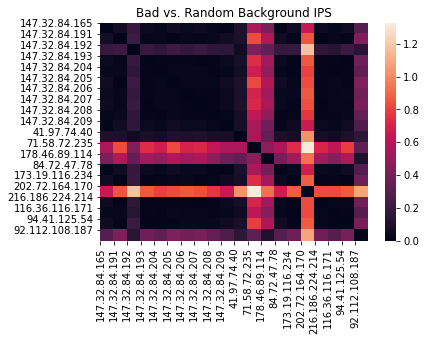

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  150.999746799469


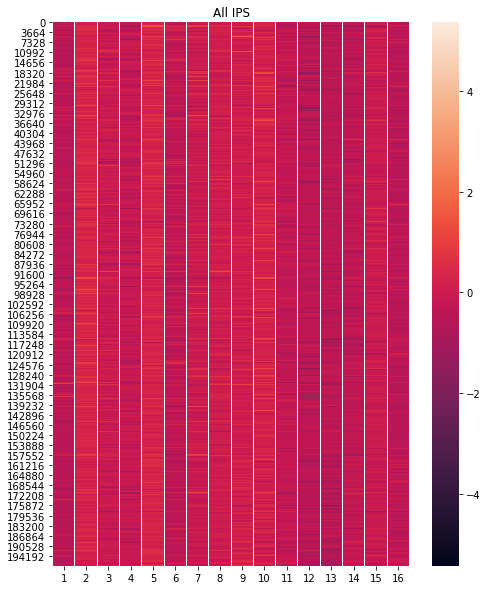

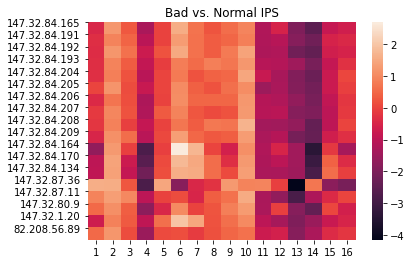

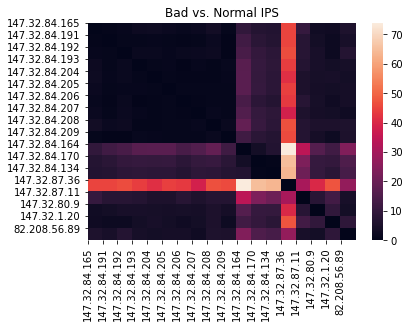

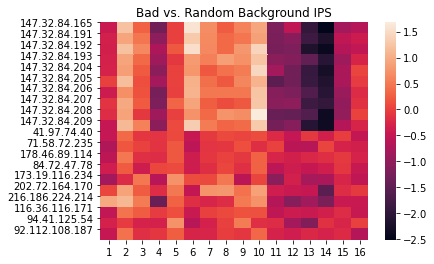

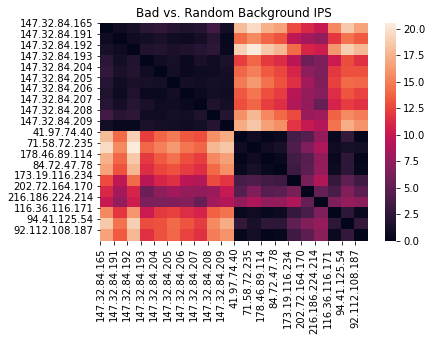

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 4 Running Time:  165.8413987159729


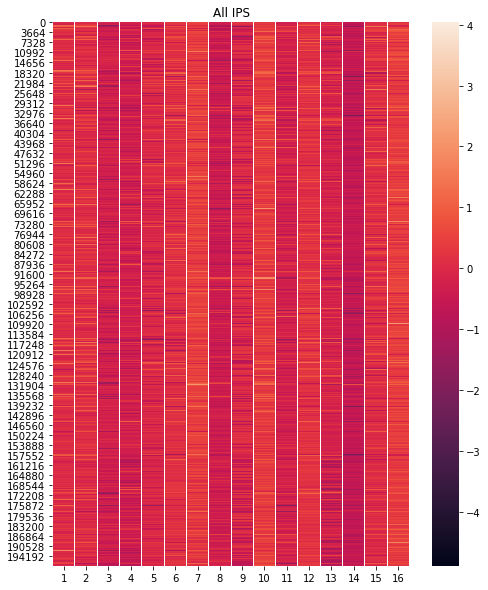

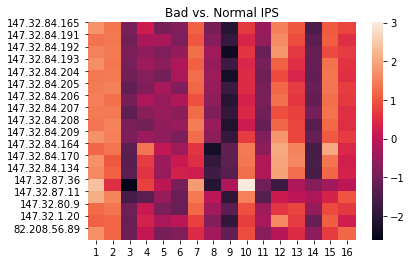

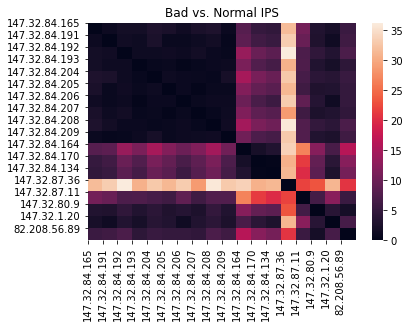

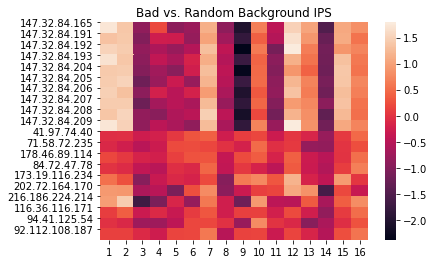

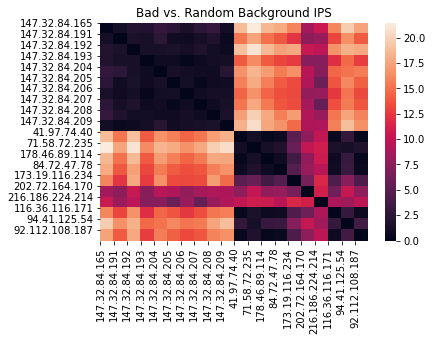

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  270.8443429470062


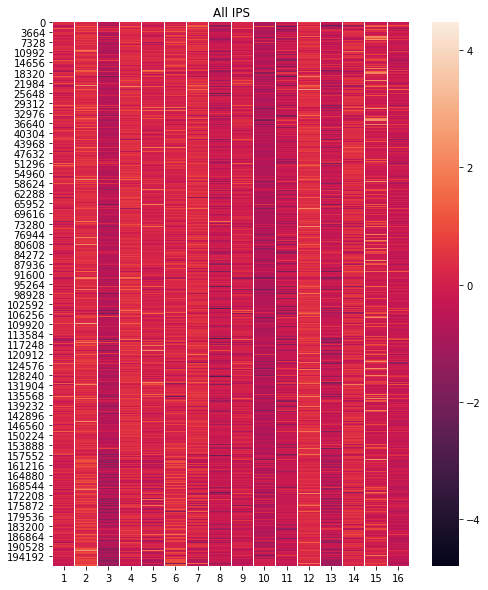

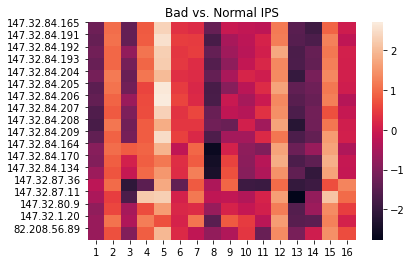

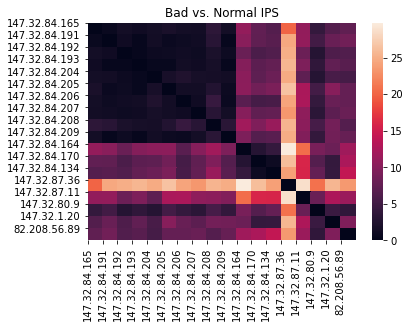

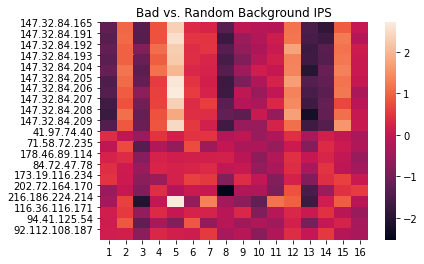

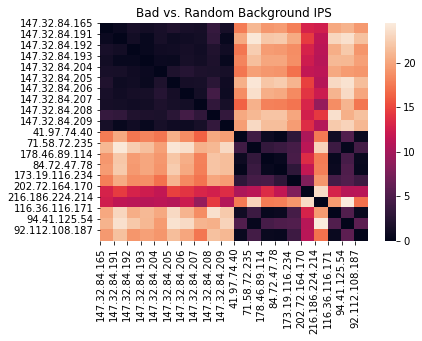

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  337.8091895580292


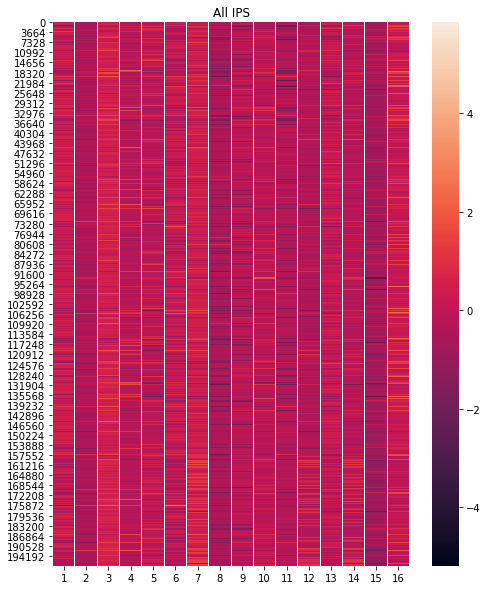

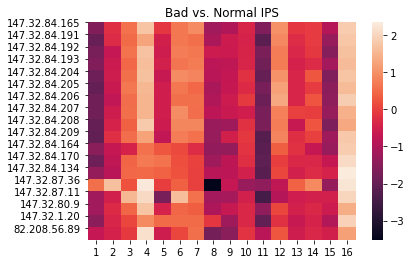

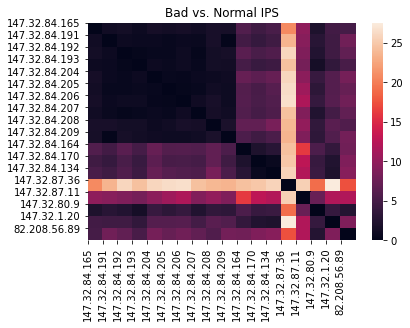

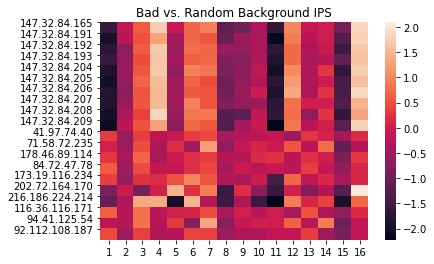

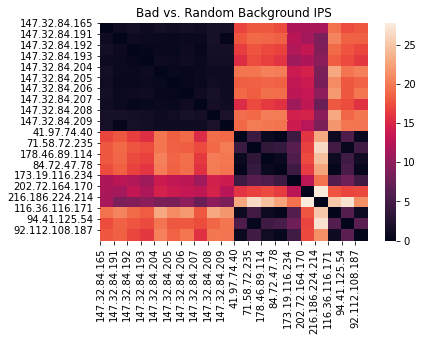

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 16, window_size: 2 Running Time:  74.32412958145142


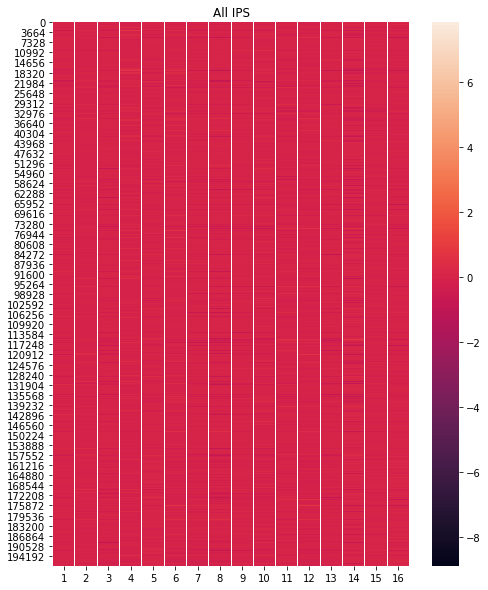

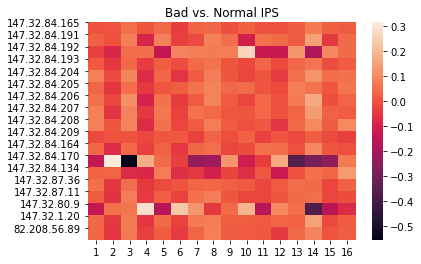

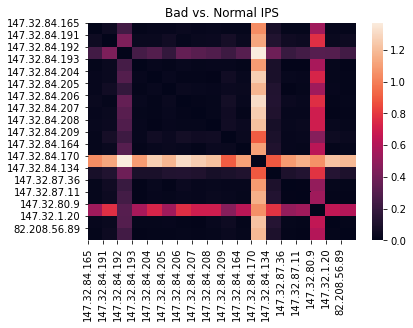

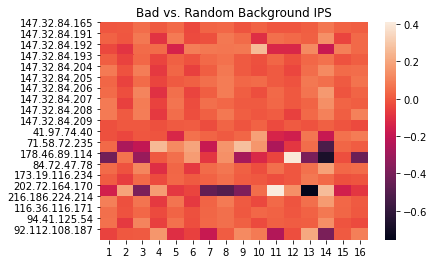

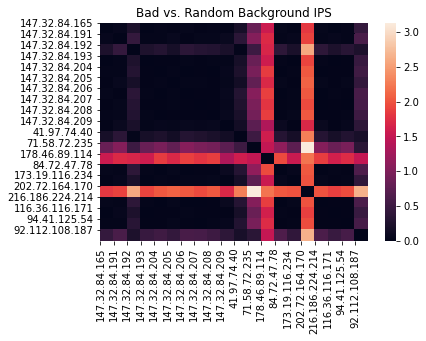

--------------------------------------------------
n_walks: 10, walk_length: 2, representation_size: 16, window_size: 4 Running Time:  74.33527874946594


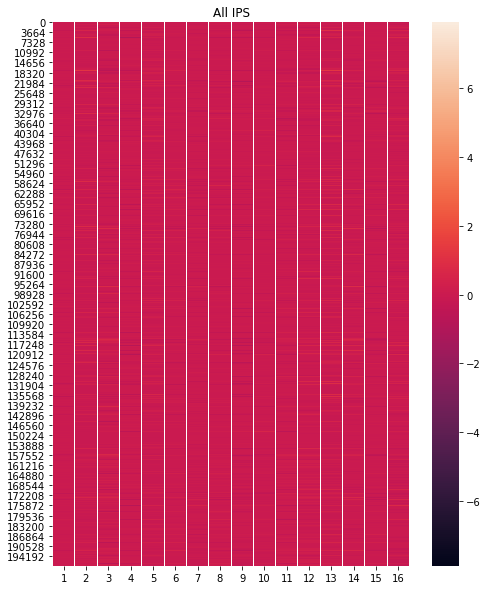

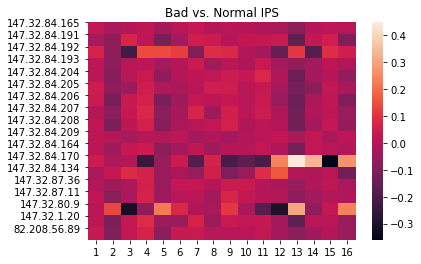

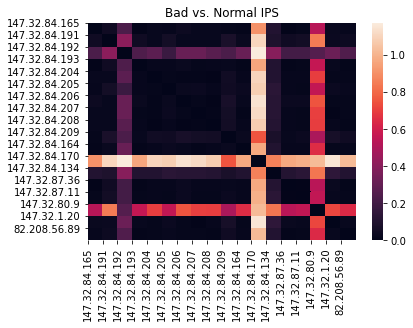

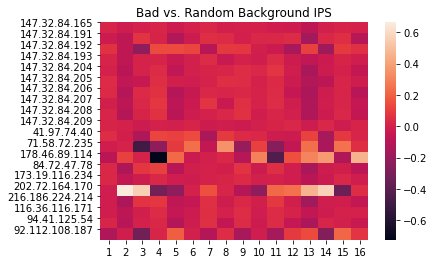

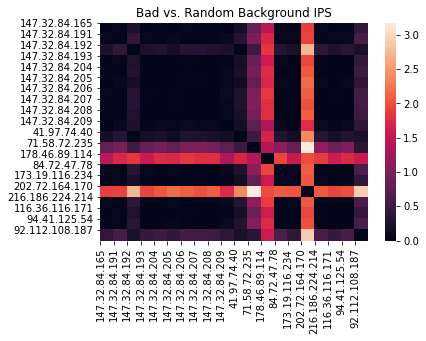

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  263.57545495033264


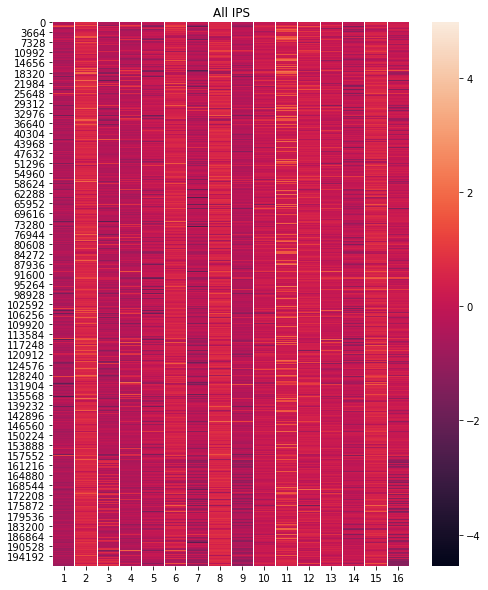

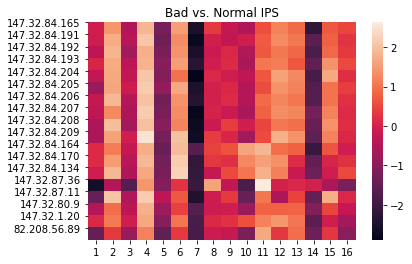

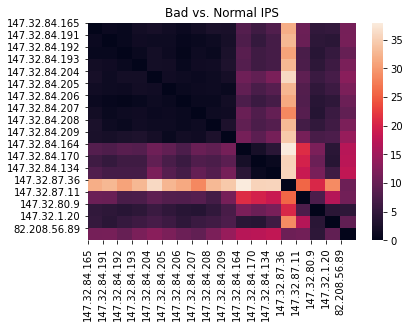

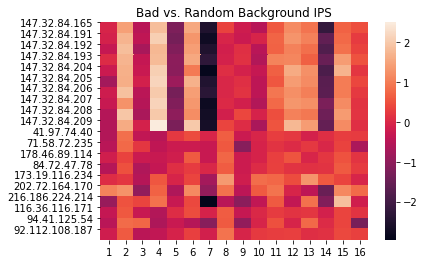

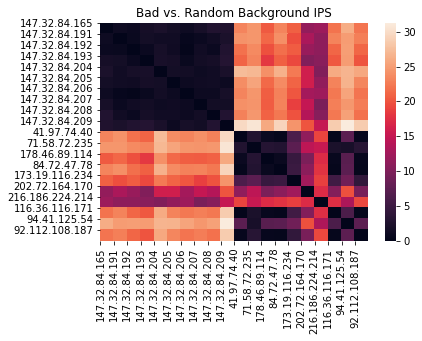

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 4 Running Time:  294.1463289260864


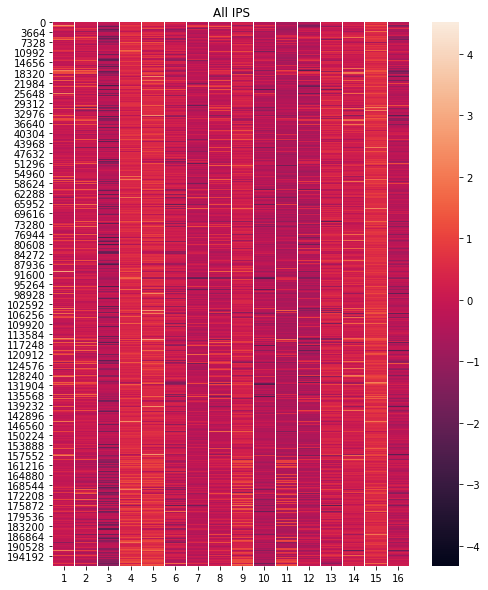

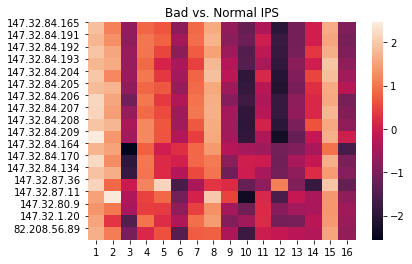

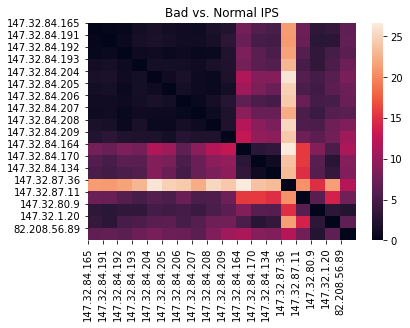

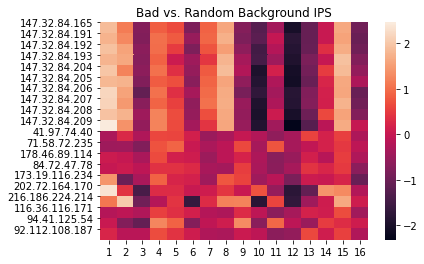

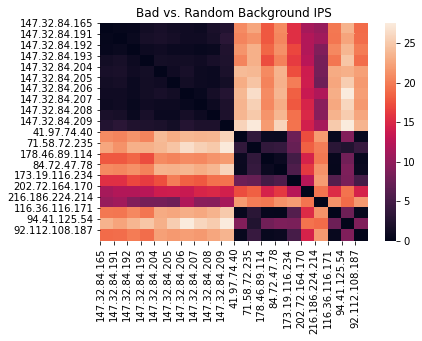

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  497.70666217803955


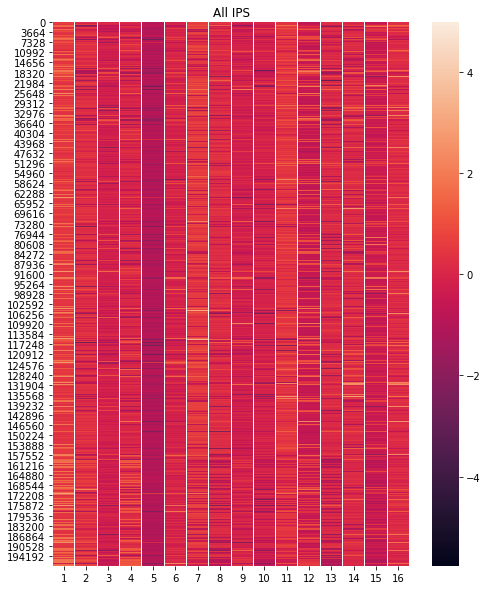

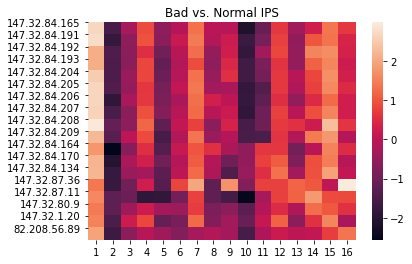

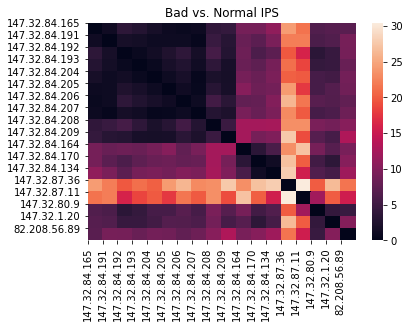

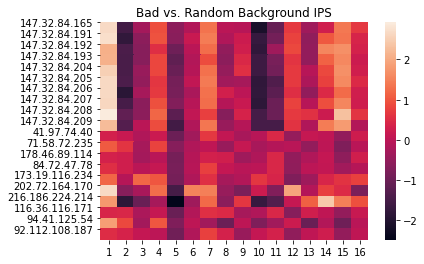

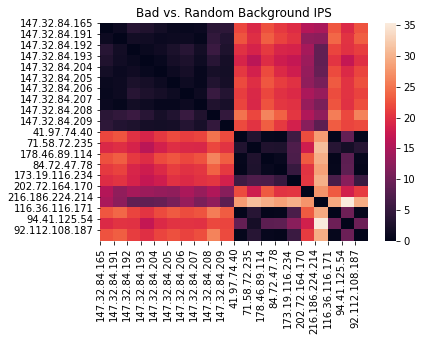

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  632.6947362422943


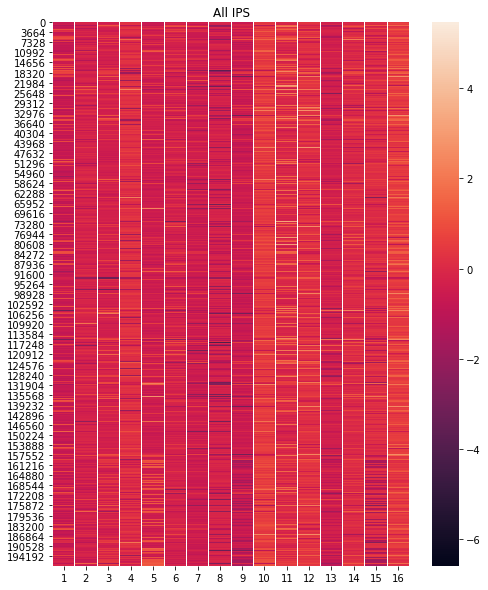

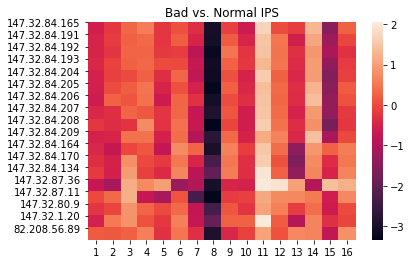

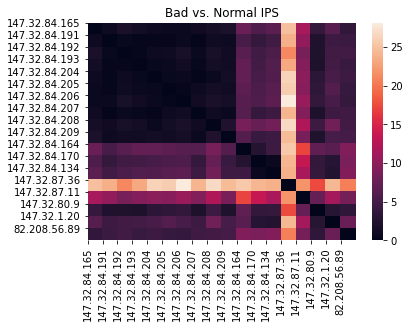

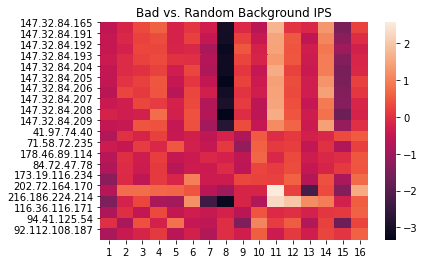

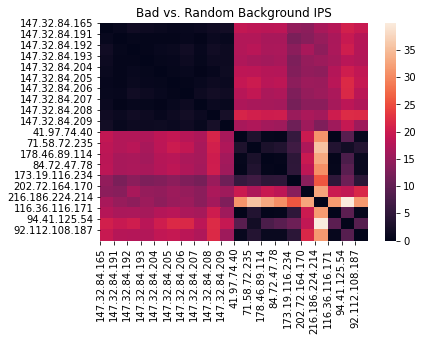

In [10]:
for representation_size in [16]:
    for n_walks in [5, 10]:
        for walk_length in [2, 5, 10]:
            for window_size in [2, 4]:
                run_deepwalk(G, 
                             n_walks=n_walks, 
                             walk_length=walk_length, 
                             representation_size=representation_size, 
                             window_size=window_size, 
                             n_jobs=1)
        

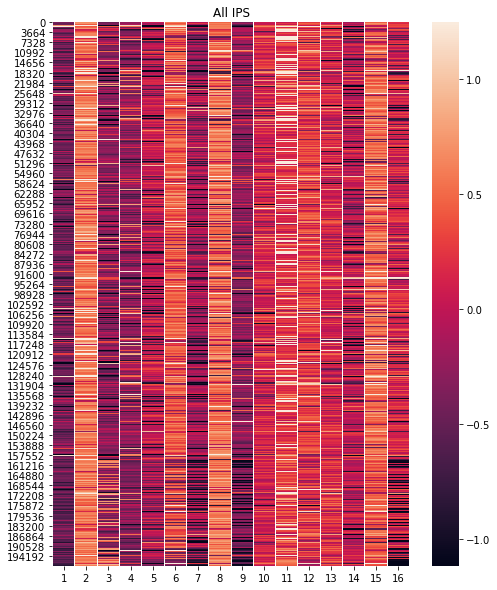

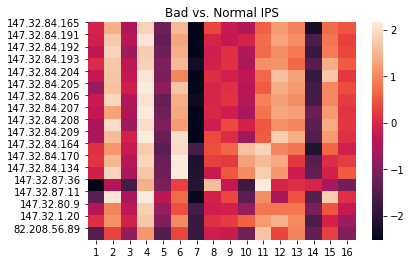

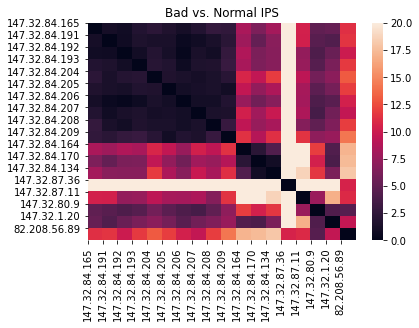

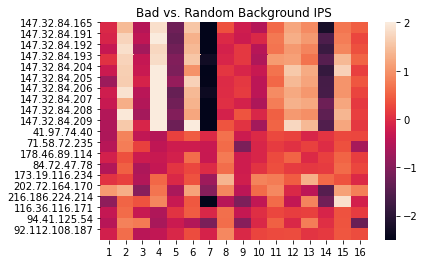

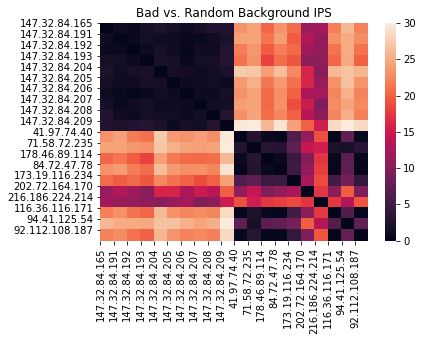

In [32]:
deepwalk_output = pd.read_csv(f'scenario_{scenario}_n{10}_l{5}_w{2}_d{representation_size}.output', delimiter=' ',
                             header=None, skiprows=1)
deepwalk_output = deepwalk_output.sort_values(0).reset_index(drop=True)

#cmap = sns.cubehelix_palette(6, start=1, rot=3, dark=0, light=.95, gamma=0.8, reverse=True, as_cmap=True)
#cmap = sns.light_palette('red', gamma=0.8)

fig, ax = plt.subplots(1, 1, figsize=(8, 10))
sns.heatmap(deepwalk_output.loc[:, 1:], robust=True)
plt.title('All IPS')
plt.show()

sns.heatmap(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], robust=True)
plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
plt.title('Bad vs. Normal IPS')
plt.show()

dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + normal_ips_indx, 1:], squared=True)
sns.heatmap(dist, robust=True, vmax=20)
plt.yticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips)
plt.xticks(range(len(bad_ips_indx + normal_ips_indx)), labels=bad_ips + normal_ips, rotation=90)
plt.title('Bad vs. Normal IPS')
plt.show()

sns.heatmap(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], robust=True)
plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
plt.title('Bad vs. Random Background IPS')
plt.show()

dist = euclidean_distances(deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], deepwalk_output.loc[bad_ips_indx + random_background_ips_indx, 1:], squared=True)
sns.heatmap(dist, robust=True, vmax=30)
plt.yticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips)
plt.xticks(range(len(bad_ips_indx + random_background_ips_indx)), labels=bad_ips + random_background_ips, rotation=90)
plt.title('Bad vs. Random Background IPS')
plt.show()

--------------------------------------------------
n_walks: 5, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  157.93622708320618


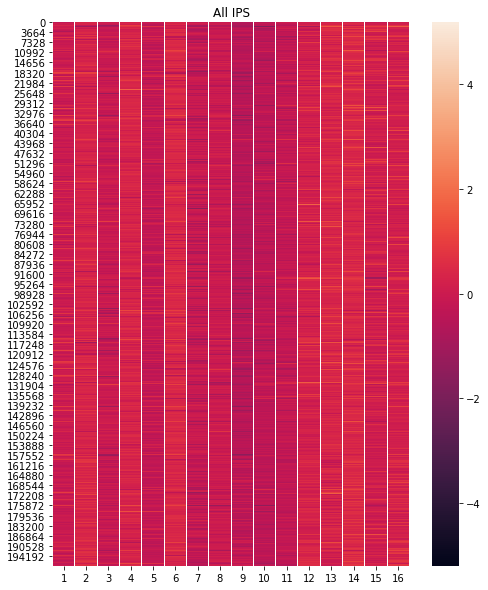

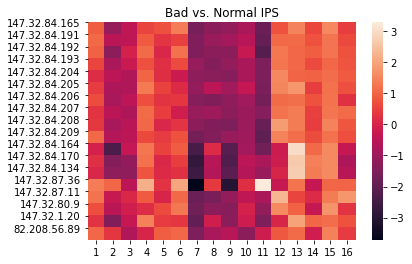

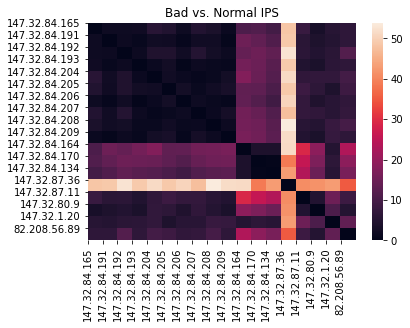

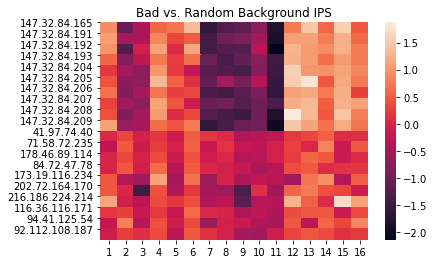

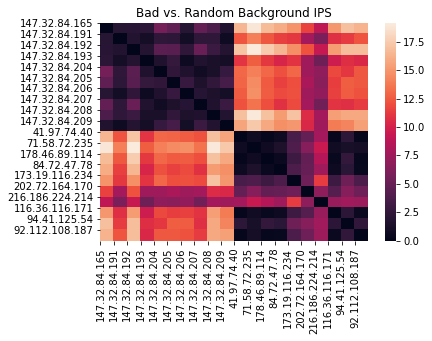

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  272.3288311958313


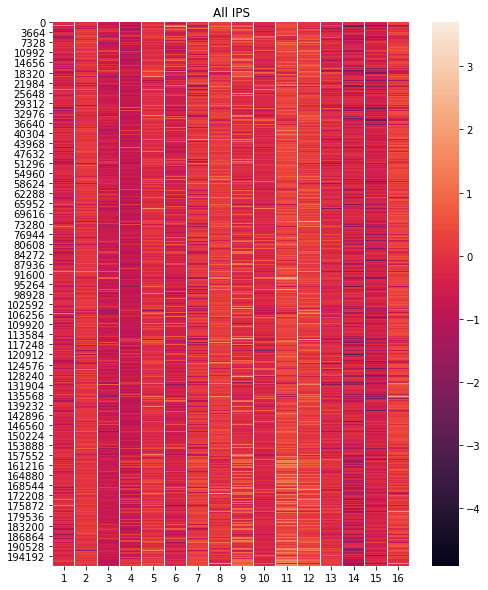

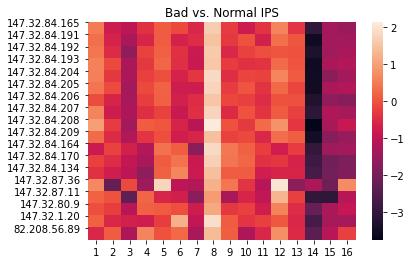

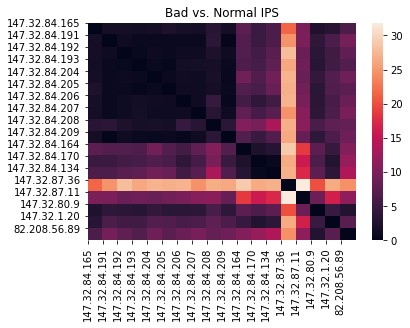

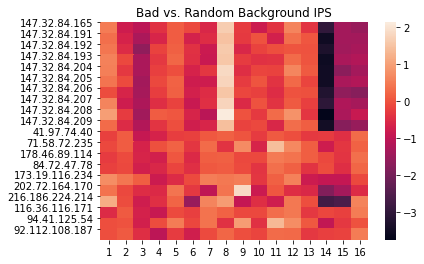

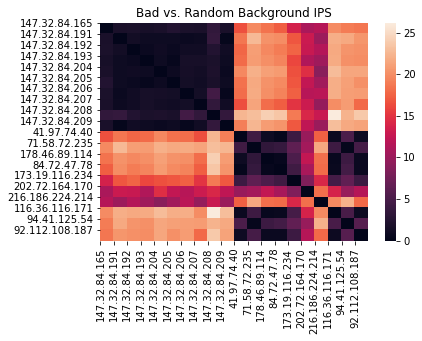

--------------------------------------------------
n_walks: 5, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  341.05461502075195


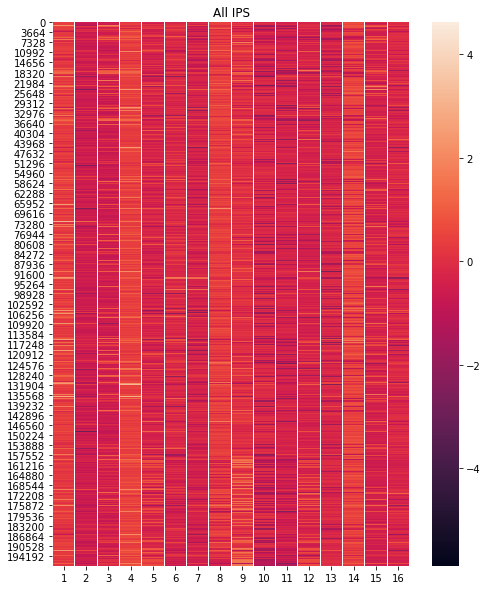

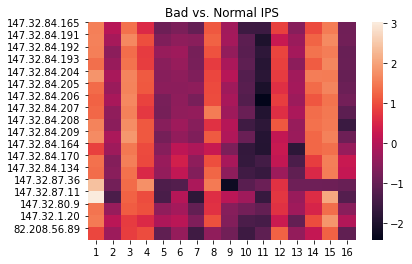

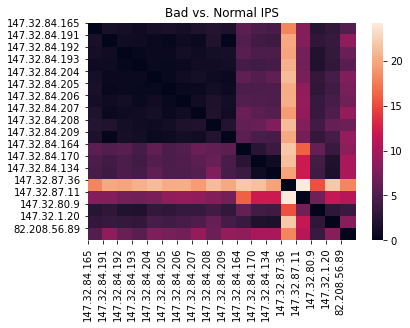

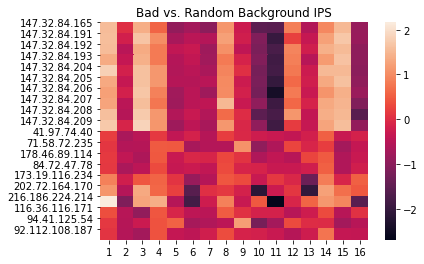

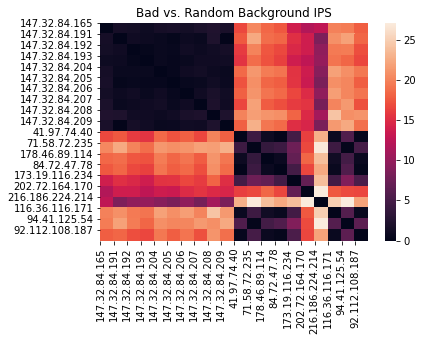

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  561.5084433555603


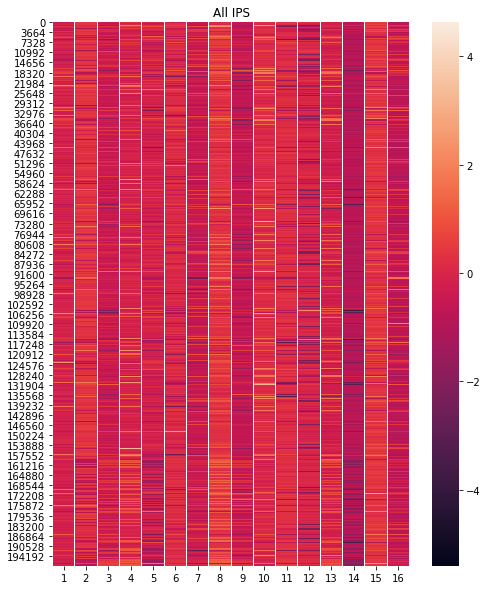

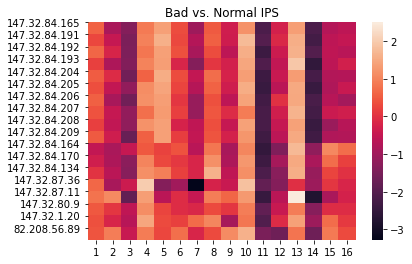

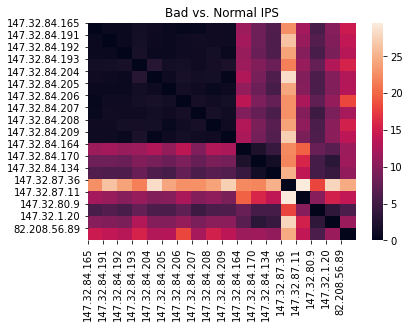

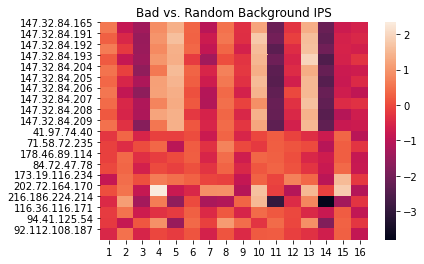

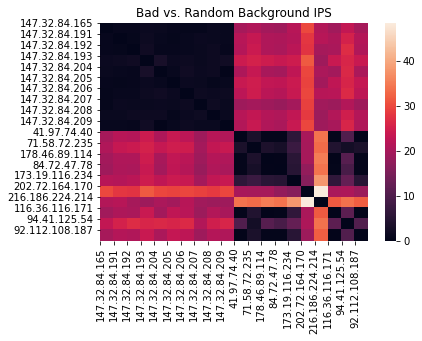

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  767.408942937851


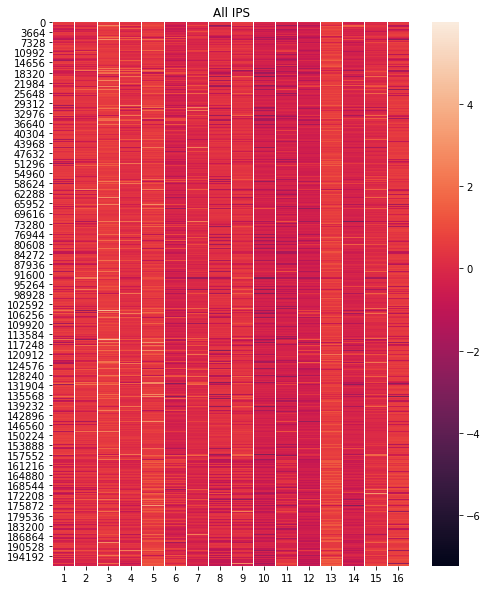

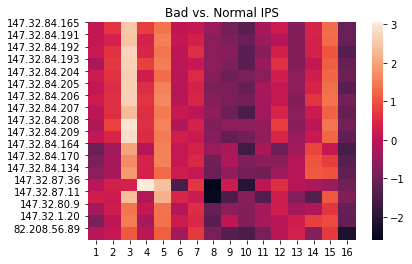

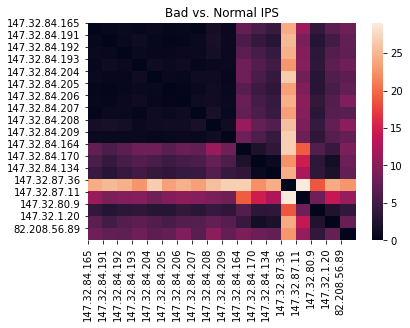

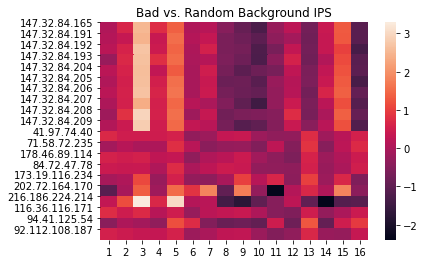

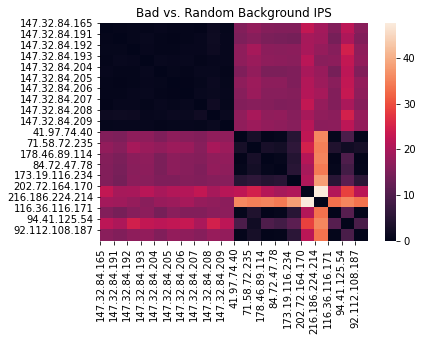

--------------------------------------------------
n_walks: 5, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  1096.908818244934


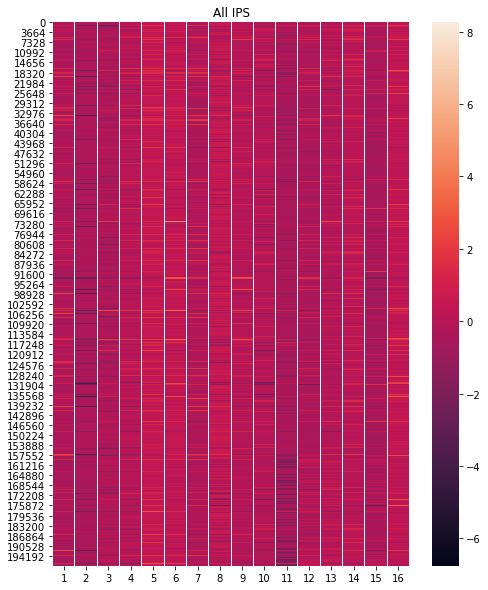

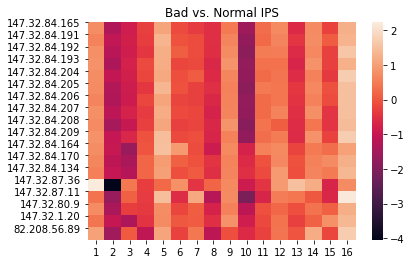

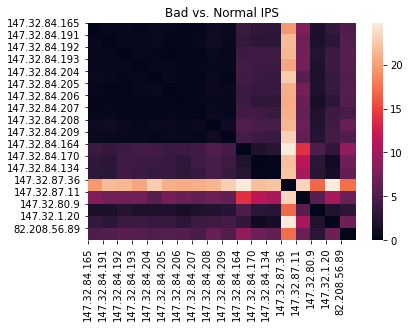

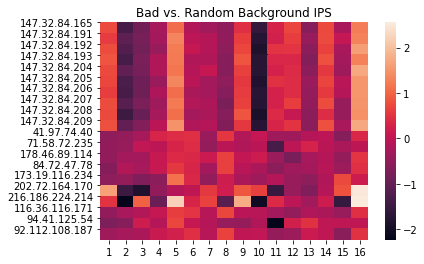

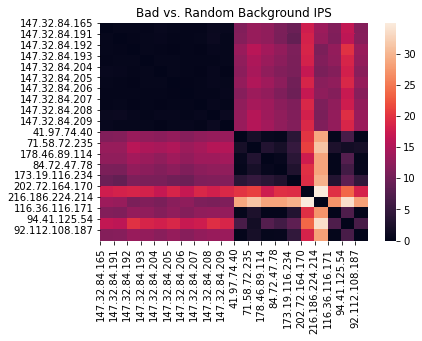

--------------------------------------------------
n_walks: 10, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  275.3042402267456


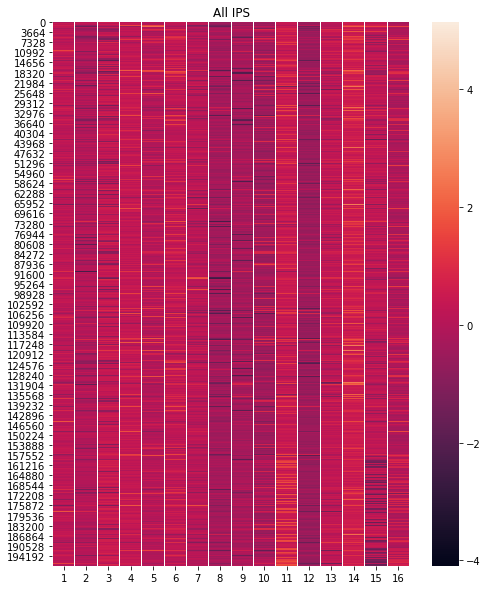

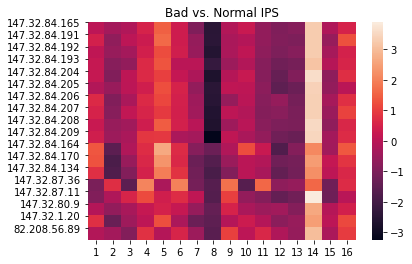

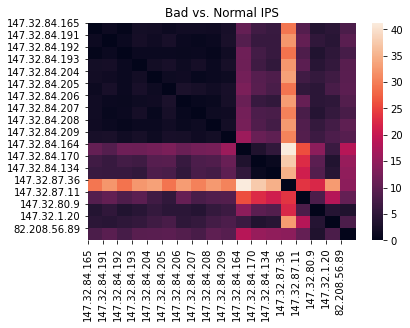

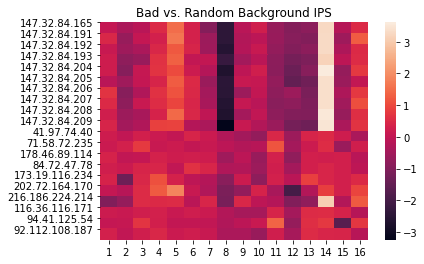

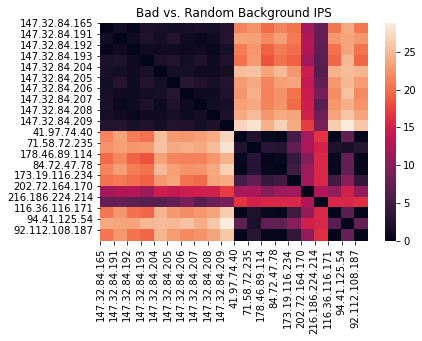

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  523.7489879131317


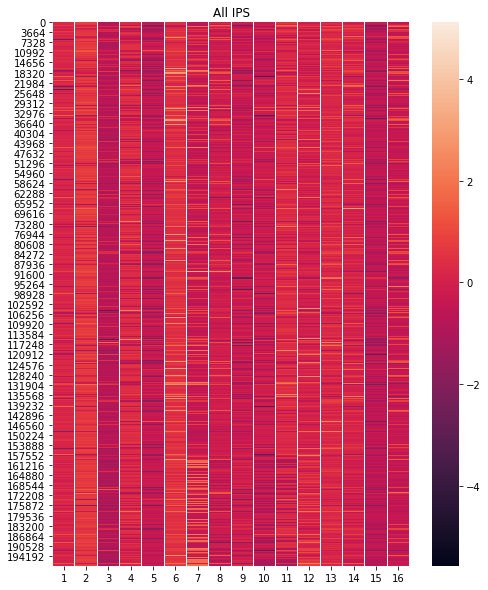

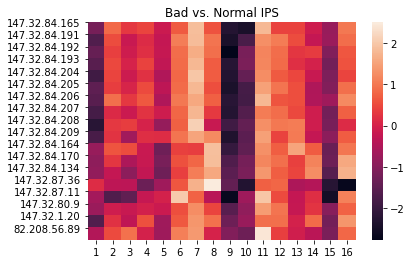

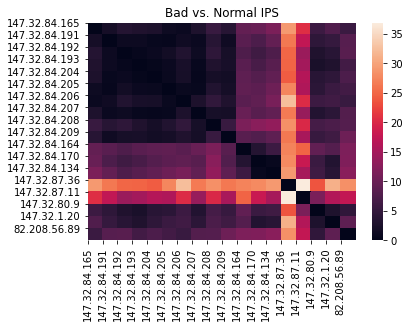

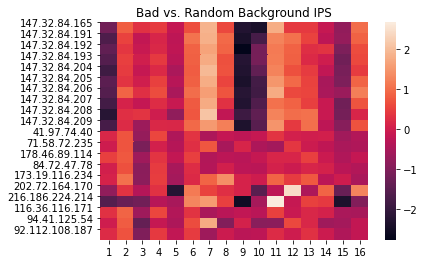

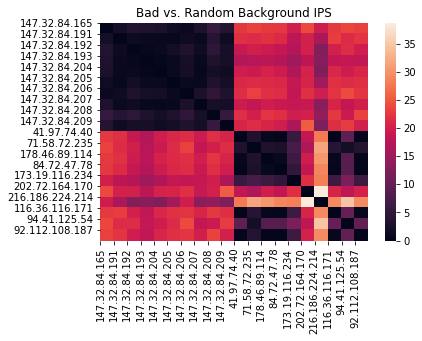

--------------------------------------------------
n_walks: 10, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  640.7829697132111


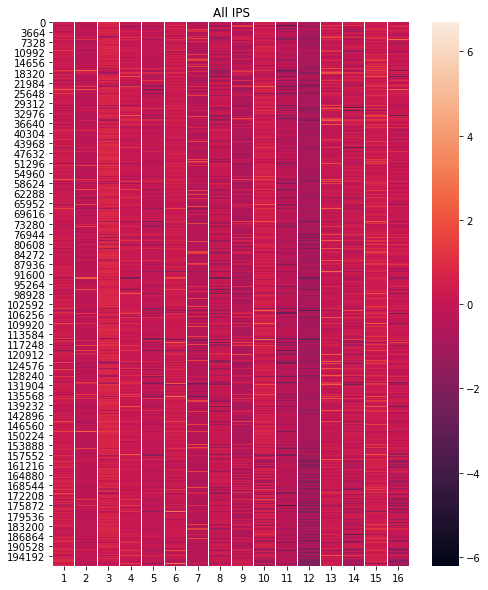

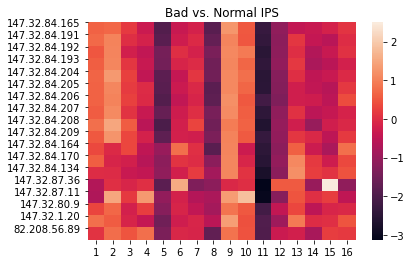

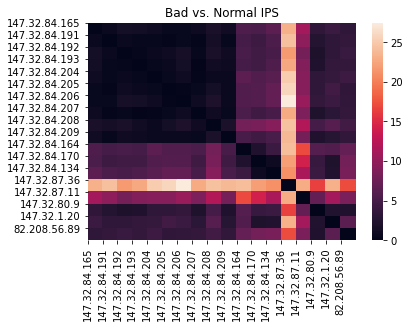

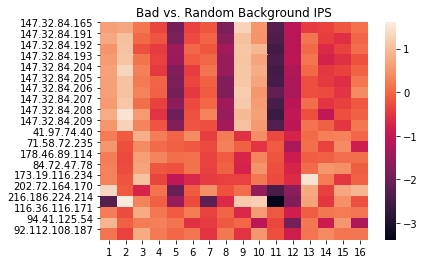

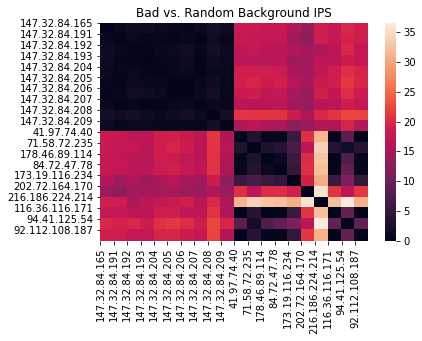

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  1094.5324375629425


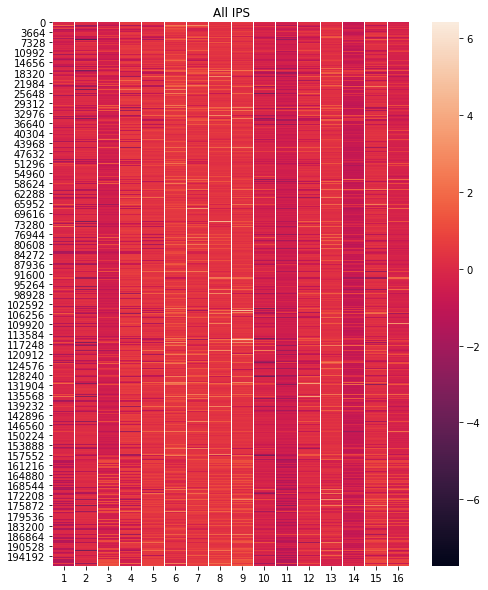

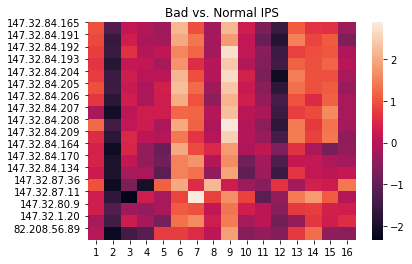

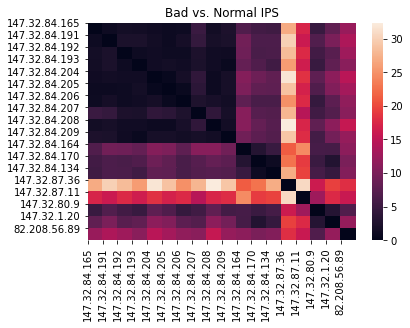

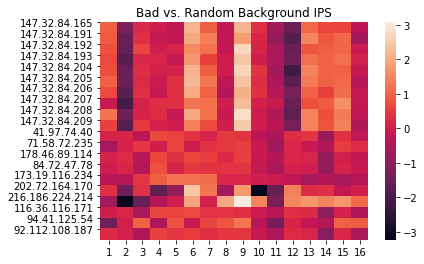

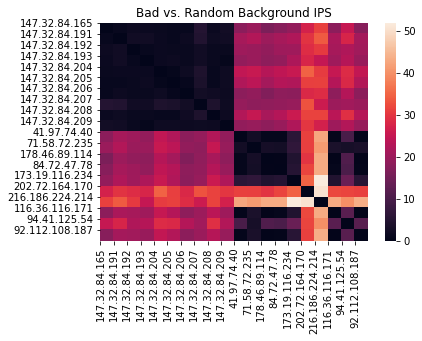

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  1519.2895603179932


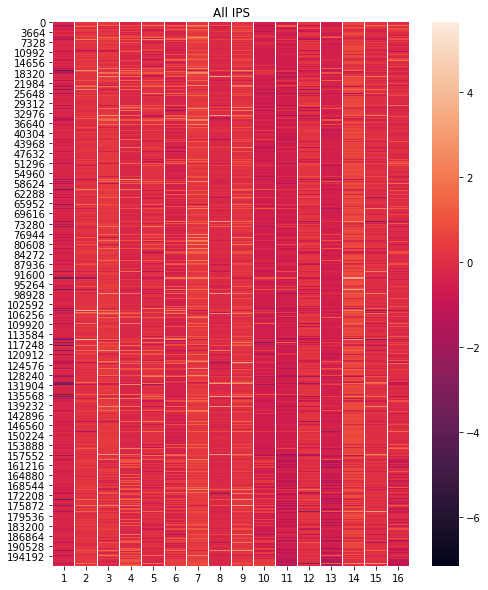

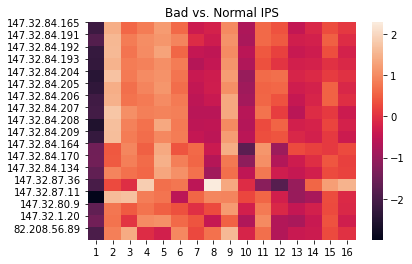

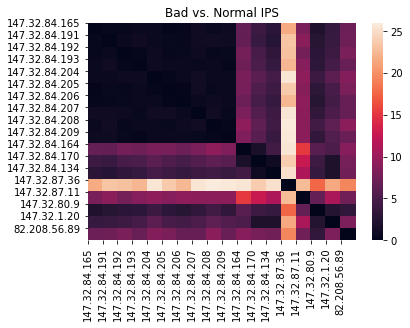

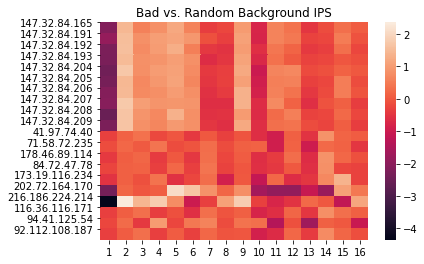

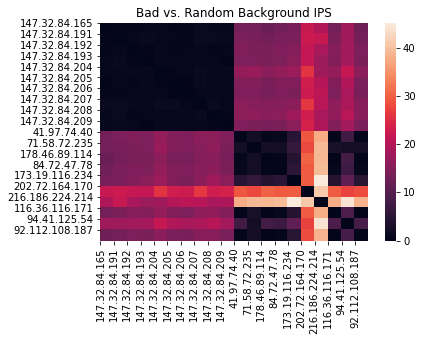

--------------------------------------------------
n_walks: 10, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  2232.3833858966827


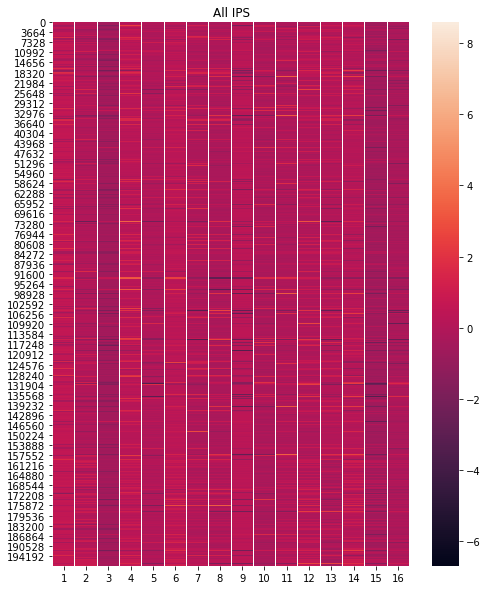

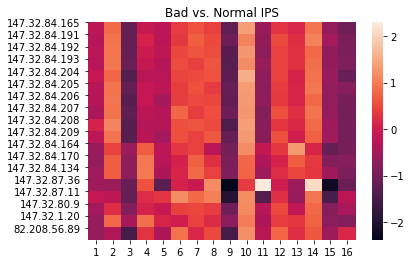

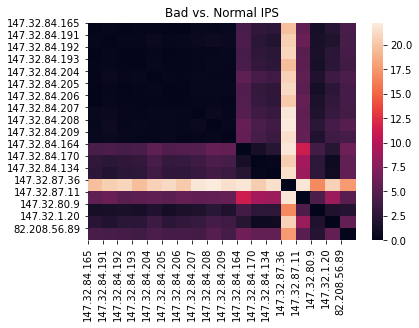

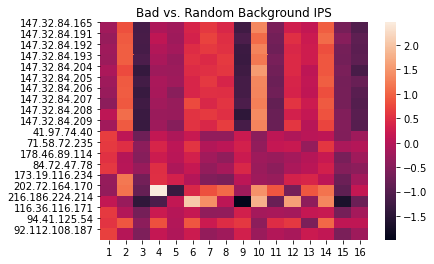

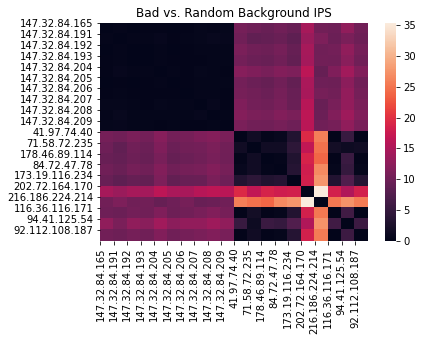

--------------------------------------------------
n_walks: 25, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  639.5503714084625


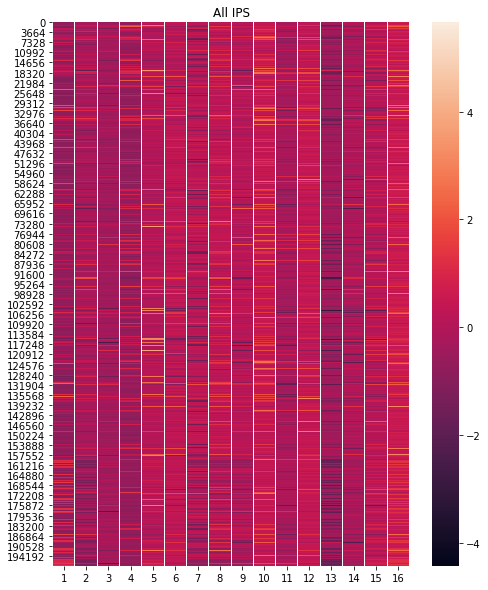

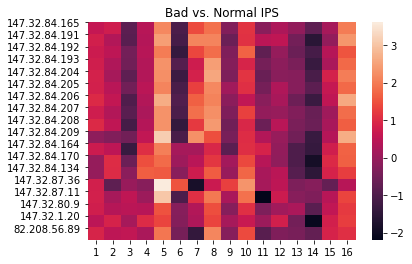

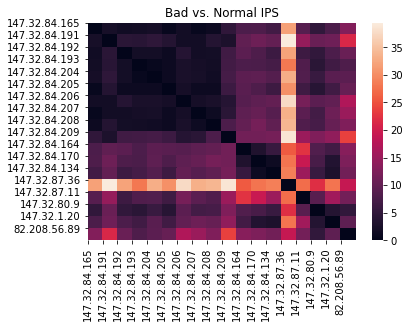

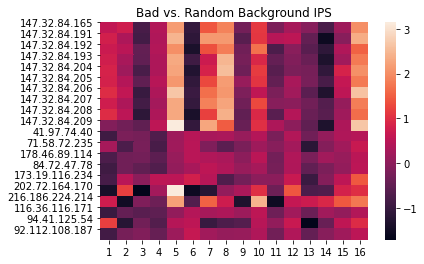

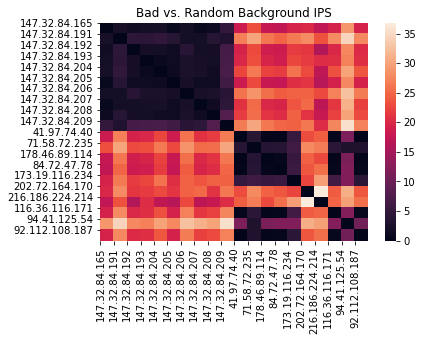

--------------------------------------------------
n_walks: 25, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  1257.0398800373077


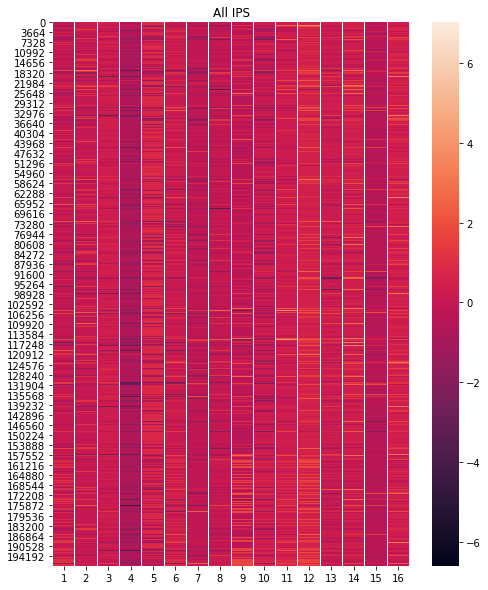

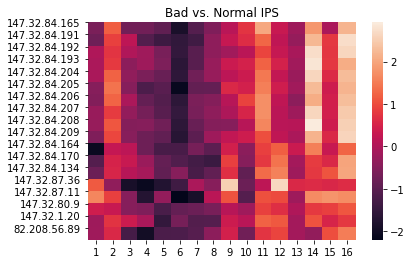

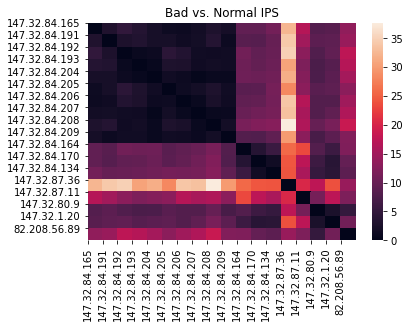

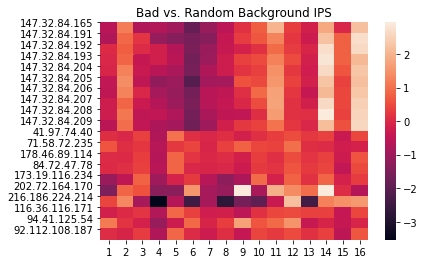

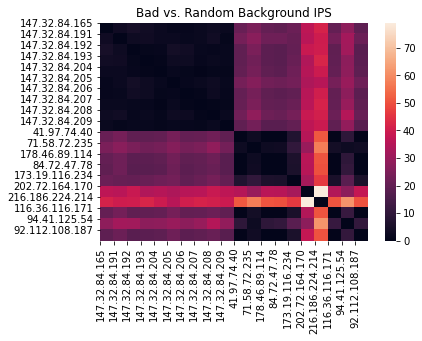

--------------------------------------------------
n_walks: 25, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  1605.1186974048615


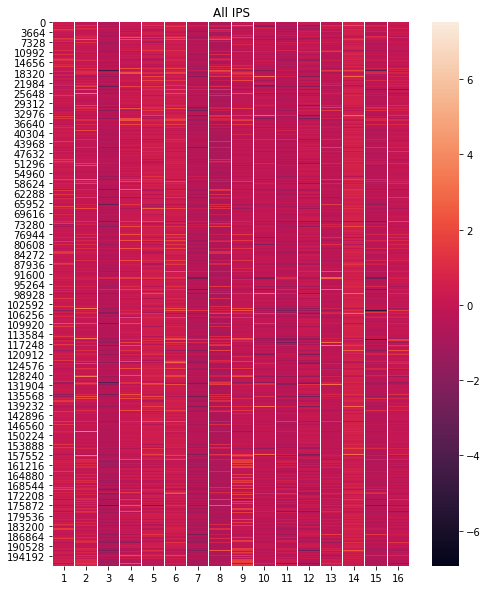

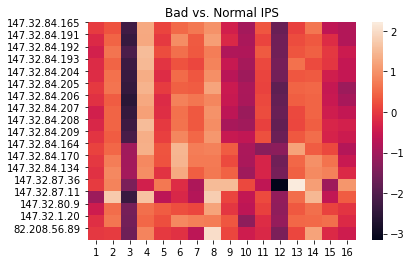

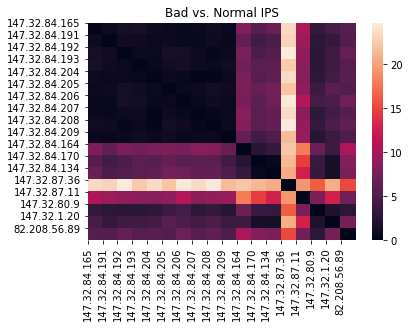

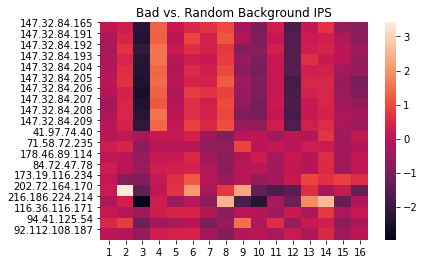

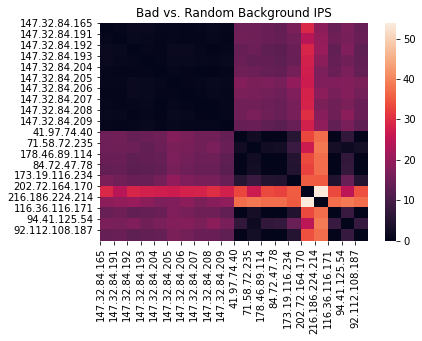

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  2885.997014284134


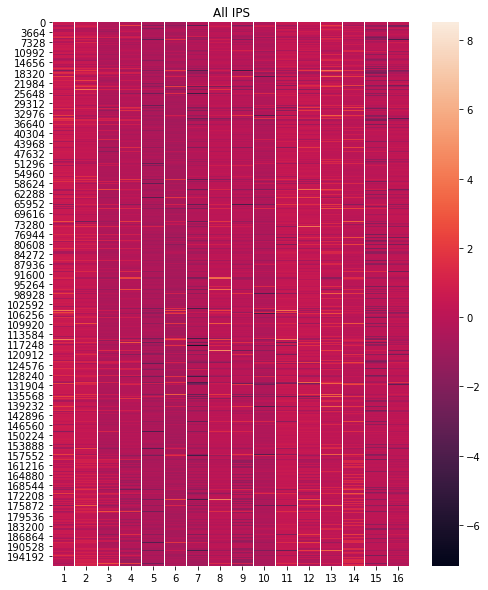

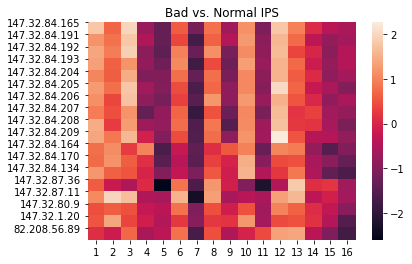

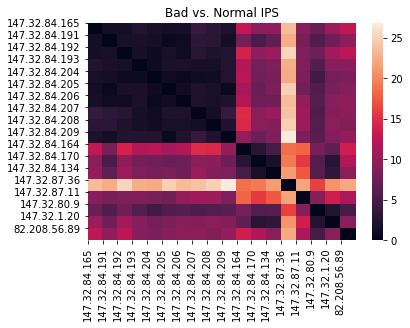

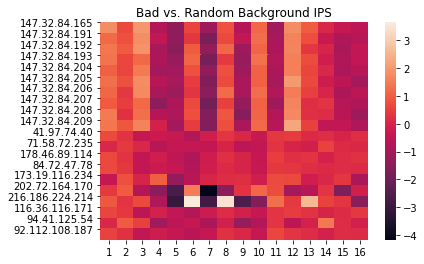

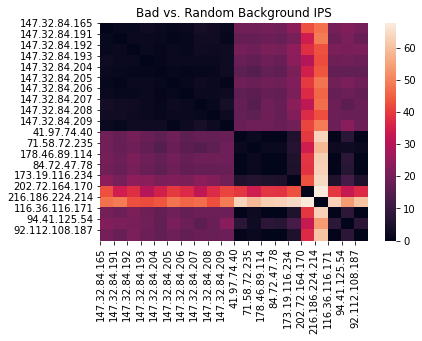

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  3718.8460655212402


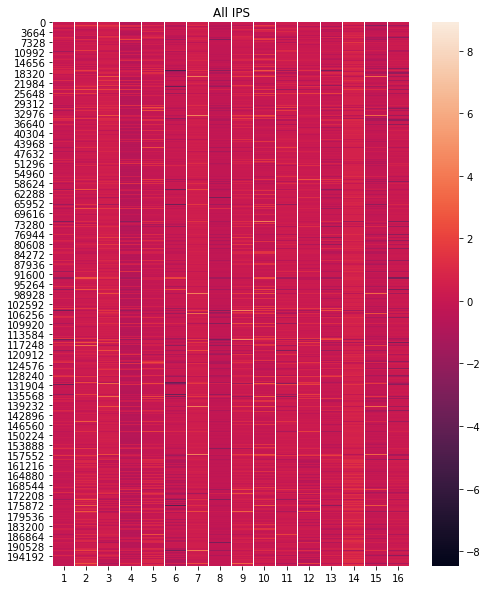

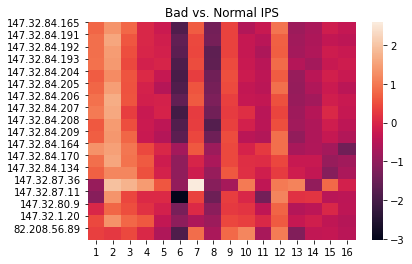

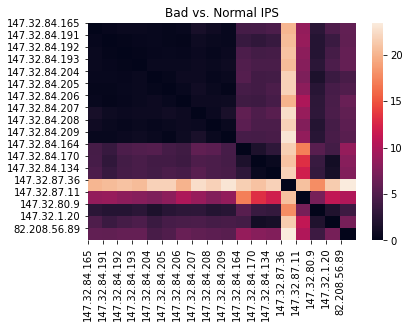

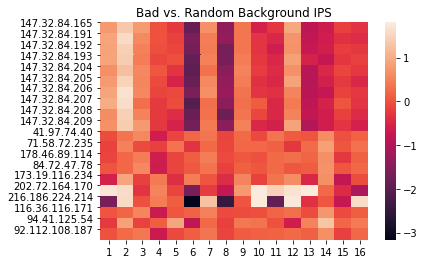

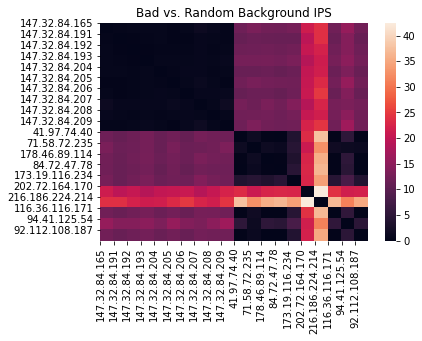

--------------------------------------------------
n_walks: 25, walk_length: 20, representation_size: 16, window_size: 8 Running Time:  5660.308507204056


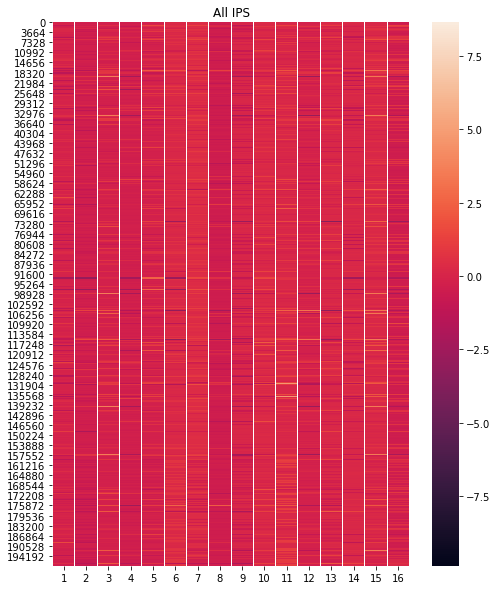

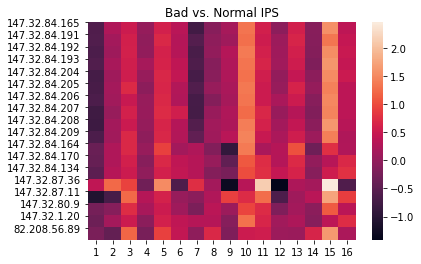

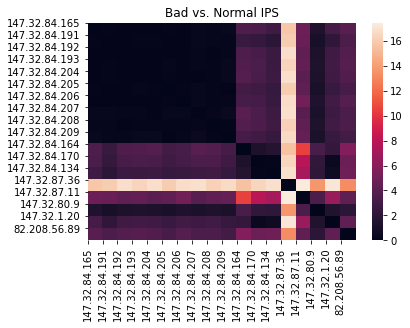

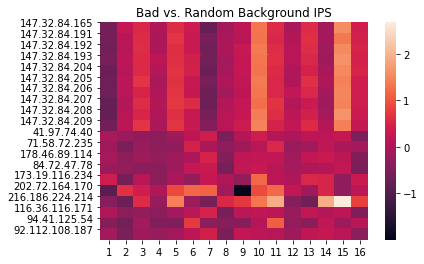

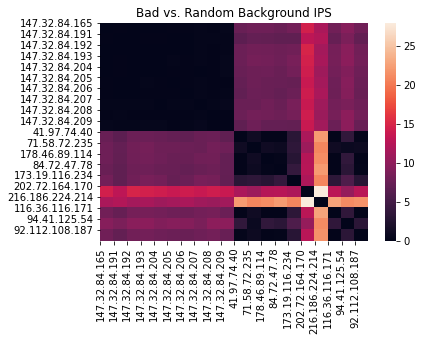

--------------------------------------------------
n_walks: 50, walk_length: 5, representation_size: 16, window_size: 2 Running Time:  1217.1003007888794


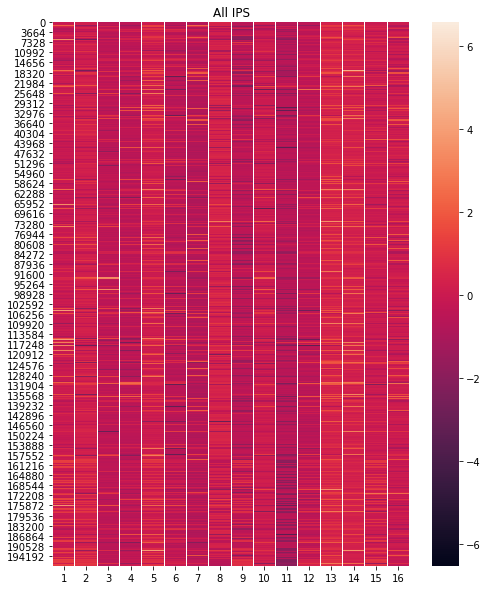

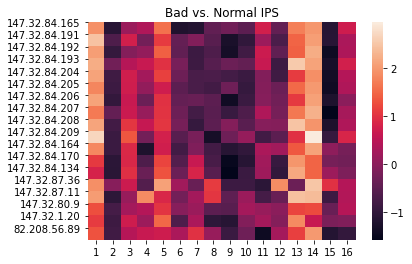

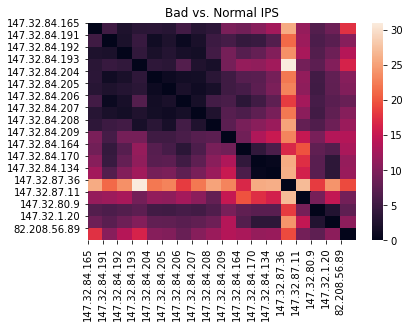

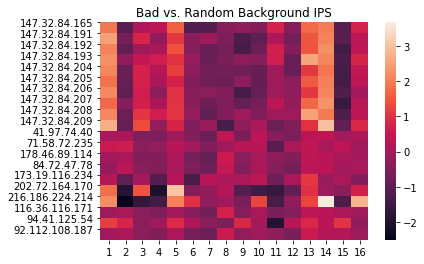

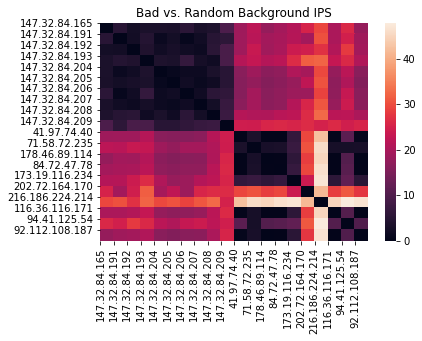

--------------------------------------------------
n_walks: 50, walk_length: 10, representation_size: 16, window_size: 2 Running Time:  2372.4505338668823


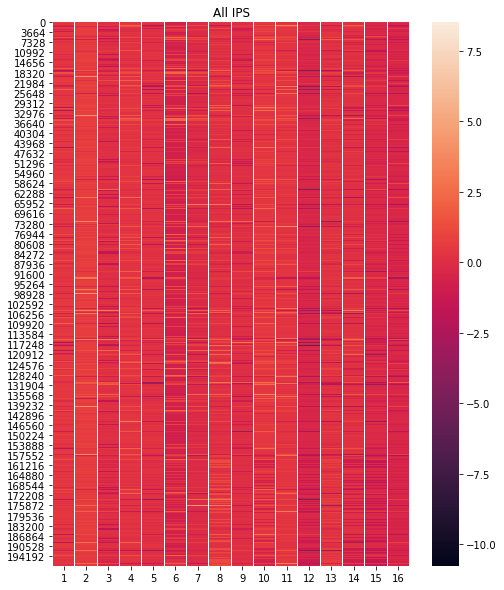

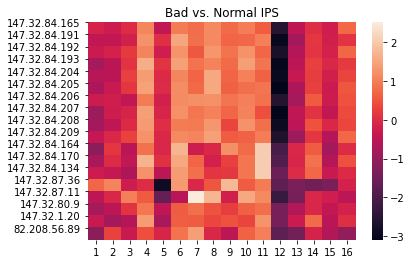

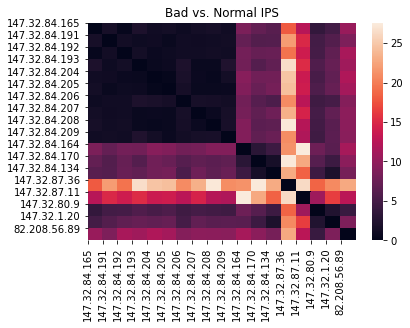

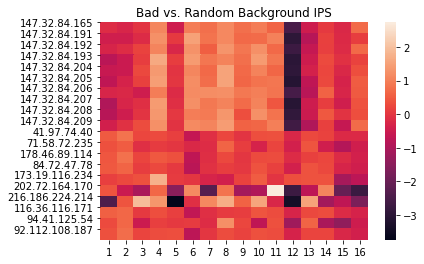

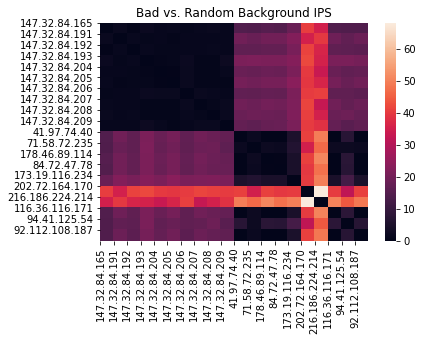

--------------------------------------------------
n_walks: 50, walk_length: 10, representation_size: 16, window_size: 4 Running Time:  3044.6733527183533


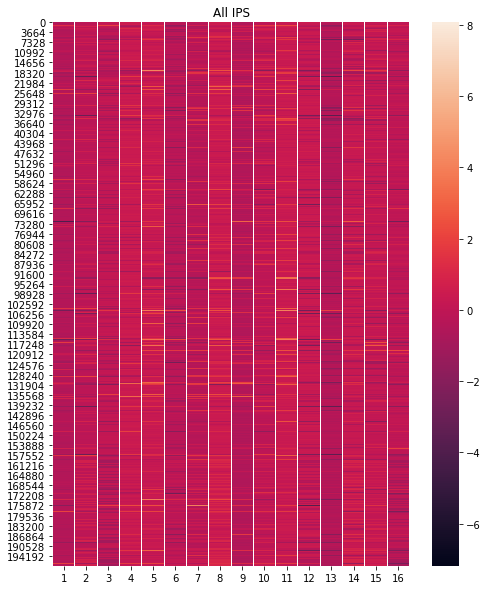

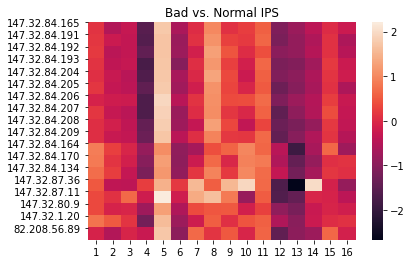

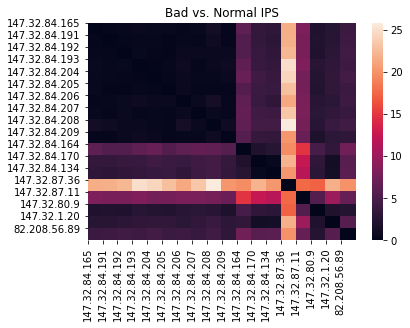

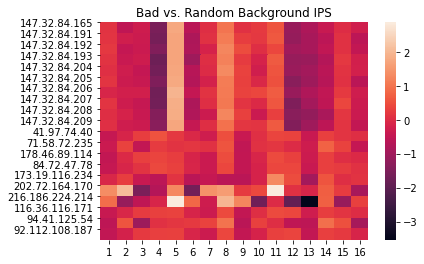

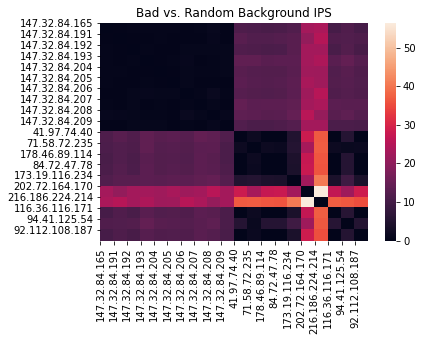

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 2 Running Time:  5149.6766884326935


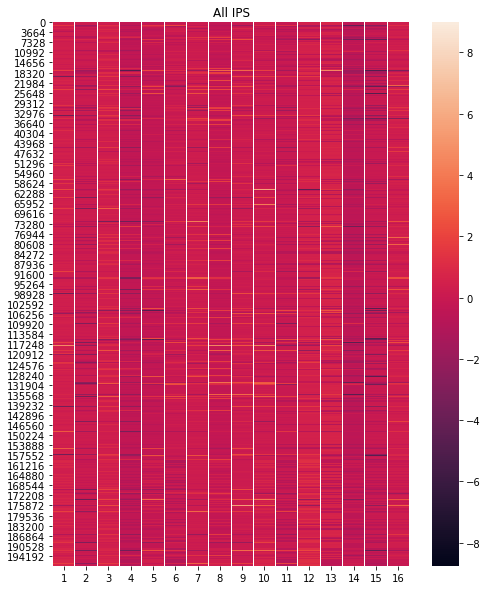

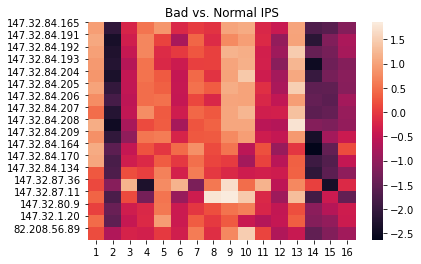

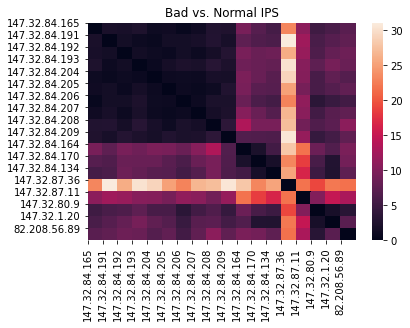

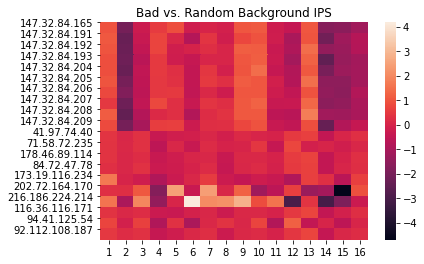

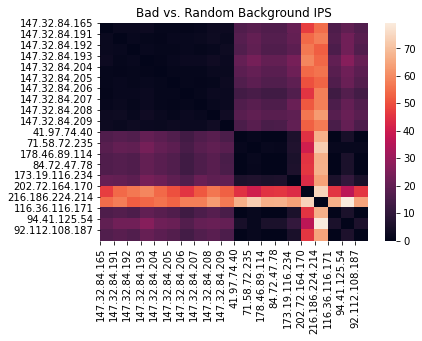

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 4 Running Time:  7200.24748134613


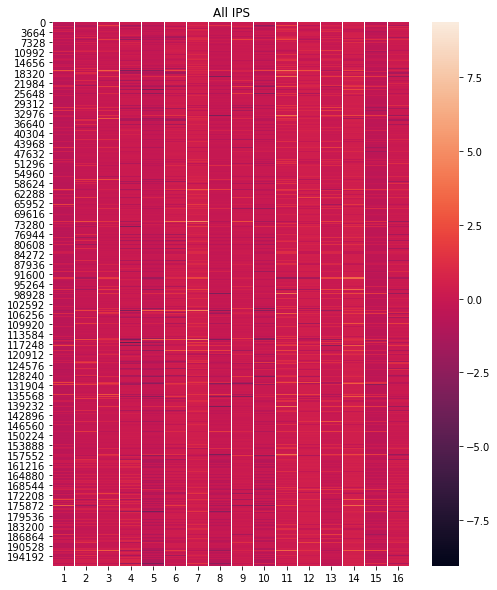

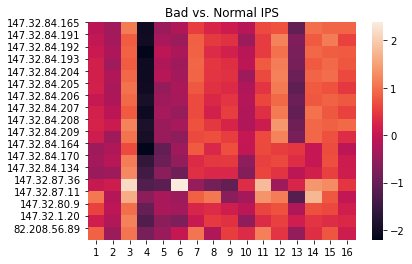

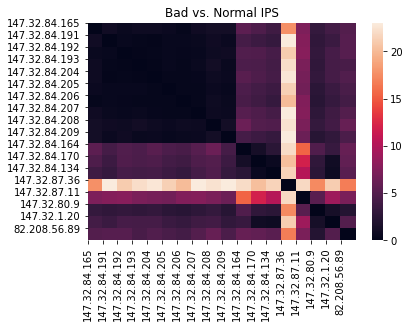

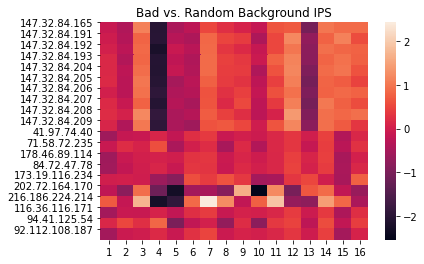

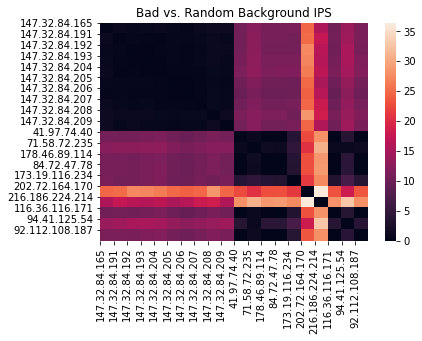

--------------------------------------------------
n_walks: 50, walk_length: 20, representation_size: 16, window_size: 8 

In [ ]:
for representation_size in [16]:
    for n_walks in [5, 10, 25, 50]:
        for walk_length in [2, 5, 10, 20]:
            for window_size in [2, 4, 8]:
                if walk_length > 2*window_size:
                    run_deepwalk(G, 
                                 n_walks=n_walks, 
                                 walk_length=walk_length, 
                                 representation_size=representation_size, 
                                 window_size=window_size, 
                                 n_jobs=1)
        